# todo

Notes:</br>
for methods which detect the trend, will be more likely to detect the points nearby groundtruth other than just ground truch, this kind of methods are more fit to real case data</br>
for method which detect the sudden change, will be more likely to detect only the groundtruth, this kind of methods are more fit to synthetic data

for really sparse points, the point window value need to be carelly examined, and the interpolation will be needed for these points

todo:fine tuning</br>
(could combine different experiment result together)</br>
1 </br>
use exponential or log curve for predicting</br>
fitting curve for predicting</br>
percentile</br>
function type when fitting the border</br>
the number of points when calculate the pattern parameters</br>
window for learning</br>
window for predicting</br>
2 </br>
use the difference of slope </br>
or</br>
statistics of slope</br>

# import

In [1]:
import numpy as np
import pandas as pd
import statistics
import matplotlib.pyplot as plt
from matplotlib.backends.backend_pdf import PdfPages
from matplotlib import rcParams
from operator import itemgetter
from typing import Callable, Dict, List, Set, Tuple
from scipy.optimize import curve_fit
import csv
import json
from collections import defaultdict
from scipy.signal import savgol_filter
import math 
import warnings
warnings.simplefilter('ignore', np.RankWarning)

In [4]:
from util import calculate_derivative,pointInterval_to_pressure,point_dt_to_pressure
from baseline_method import detect_breakpoints_startPoint, detect_breakpoints, detect_breakpoints_2, detect_breakpoints_3,detect_breakpoints_4,detect_breakpoints_startPoint2
from plot import PlotNSave
from data_load_N_preprocess import LoadNPreprocessData
from patterndRrecognition_N_tangent_method import polyval_func_wrapper,linear_func_wrapper,PatternRecognition

# load data and process

## synthetic

In [5]:
#experiment setup
ground_truth_synthetic=[107, 164, 243, 328, 375, 446, 644, 713, 771, 820, 887, 953, 1036, 1101, 1179, 1254, 1319, 1396, 1456, 1513, 1598, 1648, 1719, 1784, 1875, 1938, 2017, 2073, 2185, 2247, 2315, 2369, 2433, 2487, 2552, 2610, 2835, 2916, 2965, 3044, 3101, 3240, 3284, 3368, 3411]
print("len(ground_truth_synthetic):",len(ground_truth_synthetic))
# colum_names ={"pressure":{"Date","Pressure (psia)","first_order_derivative","second_order_derivative"},
#                     "rate":{"Time@end","Liquid rate (STB/D)"}}

colum_names_synthetic={"pressure":{"time":"Date",
                        "measure":"Pressure (psia)",
                        "first_order_derivative":"first_order_derivative",
                        "second_order_derivative":"second_order_derivative"},
             "rate":{"time":"Time@end",
                     "measure":"Liquid rate (STB/D)"}}
data_inOneRow_synthetic=400
pressure_filePath="../data_input/Synthetic_Data.xlsx"
rate_filePath="../data_input/Synthetic_Data.xlsx"

processed_data=LoadNPreprocessData(pressure_filePath=pressure_filePath, 
                 rate_filePath=rate_filePath, 
                 colum_names=colum_names_synthetic, 
                 use_SG_smoothing=False)
pressure_df_synthetic=processed_data.pressure_df
rate_df_synthetic=processed_data.rate_df

print("len(pressure_df_synthetic)",len(pressure_df_synthetic))
print("len(rate_df_synthetic)",len(rate_df_synthetic))

pressure_measure_synthetic=list(pressure_df_synthetic[colum_names_synthetic["pressure"]["measure"]])
pressure_time_synthetic=list(pressure_df_synthetic[colum_names_synthetic["pressure"]["time"]])

len(ground_truth_synthetic): 45
---load data from 'txt' or 'xlsx' files...
---The first & second order derivative has been calculated and appended to pressure dataframe
len(pressure_df_synthetic) 3519
len(rate_df_synthetic) 95


## denoised data

In [6]:
#experiment setup
ground_truth_temp=[2249,  2467,  2805,[2875, 2876],3100,3561,3994,[4228, 4232],4753,4895, 5297,5436,5985,[6543, 6547], 7249,[7544, 7545],7946,[8362, 8364],9025,[9607, 9608],10149,10216, 10528,[10801, 10804],11340,  11479,12363,[13039, 13040],13868, 14086,14774,15341,16098,16619,[17589, 17590],18435,19643,19764,20021,20349,20701,21030,21974,22186,22710,23220,24215,24685,25717,26006,26656, 26759,27023,[27316,27327],27773,[27966,27970],28322,28497,28832,29115]
colum_names_denoised   ={"pressure":{"time":"Elapsed time",
                             "measure":"Data",
                             "first_order_derivative":"first_order_derivative",
                             "second_order_derivative":"second_order_derivative"},
                "rate":{"time":"Elapsed time",
                        "measure":"Liquid rate"}}
data_inOneRow_denoised=1000
pressure_filePath="../data_input/EAGE_Shchipanov_2017/Pressure.txt"
rate_filePath="../data_input/EAGE_Shchipanov_2017/Rate.txt"
ground_truth=[]
for point in ground_truth_temp: 
    if "list" in str(type(point)):
        ground_truth.append(math.ceil(sum(point)/len(point)))
    else:
        ground_truth.append(point)
                     

processed_data_denoised=LoadNPreprocessData(pressure_filePath=pressure_filePath, 
                 rate_filePath=rate_filePath, 
                 colum_names=colum_names_denoised, 
                 use_SG_smoothing=True)
pressure_df_denoised=processed_data_denoised.pressure_df


pressure_df=pressure_df_denoised
pressure_measure_denoised=list(pressure_df[colum_names_denoised["pressure"]["measure"]])
print("len(pressure_measure_denoised)",len(pressure_measure_denoised))
pressure_time_denoised=list(pressure_df[colum_names_denoised["pressure"]["time"]])
second_derivatives=list(pressure_df[colum_names_denoised["pressure"]["second_order_derivative"]])
# ground truth adapted for denoise data
ground_truth_denoised=[2248, 2467, 2804, 2884, 3095, 3560, 3987, 4246, 4750, 4899, 5297, 5436, 5983, 6543, 7249, 7545, 7946, 8361, 9024, 9619, 10149, 10224, 10527, 10800, 11340,11490, 12362, 13040, 13867, 14089, 14766, 15348, 16097, 16619, 17589, 18434, 19642, 19777, 20014, 20358, 20700, 21025, 21974, 22183, 22709, 23219, 24215, 24683, 25698, 26011, 26656, 26753, 27022, 27315, 27760, 27969, 28322, 28494, 28831, 29115]
print("len(ground_truth_denoised)",len(ground_truth_denoised))
ground_truth_badQuality=[9024,10800,2467,10224,21025,26753]
for item in ground_truth_badQuality:
    ground_truth_denoised.remove(item)

print("after remove uncorrect ground truth")
print("len(ground_truth_denoised)",len(ground_truth_denoised))

---load data from 'txt' or 'xlsx' files...
check the time type
---denoising data using S-G smoothing...
---The first & second order derivative has been calculated and appended to pressure dataframe
len(pressure_measure_denoised) 29813
len(ground_truth_denoised) 60
after remove uncorrect ground truth
len(ground_truth_denoised) 54


In [3]:
#!pip install astropy

# the curve fitting for pattern in literature

In [4]:
file_path=pressure_filePath="../data_input/pattern_left.txt"
pattern_left = pd.read_csv(file_path, delimiter=" ",skiprows=1, names=["X", "Y"],skipinitialspace = True)
pattern_left["X"]= pattern_left["X"]-pattern_left["X"][0]
pattern_left["Y"]= pattern_left["Y"]-pattern_left["Y"][0]
print(pattern_left.describe())

pattern_left_top=pattern_left.loc[pattern_left["Y"]>0]
pattern_left_bottom=pattern_left.loc[pattern_left["Y"]<0]

                X           Y
count  106.000000  106.000000
mean    -6.447343    1.100501
std      3.845383    2.987507
min    -14.049790   -2.763160
25%     -9.565758   -2.051525
50%     -6.371515    1.160395
75%     -3.177262    4.181658
max      0.000000    5.118920


In [5]:
file_path=pressure_filePath="../data_input/pattern_right_top.txt"
pattern_right_top = pd.read_csv(file_path, delimiter=" ",skiprows=1, names=["X", "Y"],skipinitialspace = True)
pattern_right_top["X"]= pattern_right_top["X"]-pattern_right_top["X"][0]
pattern_right_top["Y"]= pattern_right_top["Y"]-pattern_right_top["Y"][0]
pattern_right_top= pattern_right_top.clip(lower=0)
print(pattern_right_top.describe())
# pd.set_option('display.max_rows', pattern_right_top.shape[0]+1)
# pattern_right_top 


               X          Y
count  69.000000  69.000000
mean    1.339242   8.207413
std     1.180701   5.028328
min     0.000000   0.000000
25%     0.371150   3.726520
50%     0.962310   8.391060
75%     2.050570  12.649460
max     4.186780  16.254090


In [6]:
file_path=pressure_filePath="../data_input/pattern_right_bottom.txt"
pattern_right_bottom = pd.read_csv(file_path, delimiter=" ",skiprows=1, names=["X", "Y"],skipinitialspace = True)
pattern_right_bottom["X"]= pattern_right_bottom["X"]-pattern_right_bottom["X"][0]
pattern_right_bottom["Y"]= pattern_right_bottom["Y"]-pattern_right_bottom["Y"][0]

pattern_right_bottom= pattern_right_bottom.clip(lower=0)

print(pattern_right_bottom.describe())


               X          Y
count  77.000000  77.000000
mean    5.628174   6.761963
std     3.985883   3.379727
min     0.000000   0.000000
25%     1.995140   4.067440
50%     5.219620   7.767010
75%     9.048680   9.699000
max    12.877740  10.923490


In [7]:
def test_func_1(x, a,b,c,d):
    y = a+b*x-c*np.exp(d*x)
    return y
def test_func_2(x, a,b,c,d):
    y = a+b*x-c*np.exp(-d*x)
    return y

In [8]:
def fit_curve(xdata,ydata,test_func):
    x = np.asarray(xdata)
    y = np.asarray(ydata)
    parameters, covariance = curve_fit(test_func, x, y)

    fit_a = parameters[0]
    fit_b = parameters[1]
    fit_c = parameters[2]
    fit_d = parameters[3]

    print(F'The parameters is {parameters}.')

    y_fit = test_func(x, fit_a, fit_b,fit_c,fit_d)

    plt.plot(x, y, 'o', label='data')
    plt.plot(x, y_fit, '-', label='LJ fit')
    return fit_a,fit_b,fit_c,fit_d

The parameters is [ 4.12959938 -0.07459858  4.31571225  0.27952833].
The parameters is [-3.00297354e+00 -3.35921627e-04 -2.99822437e+00  2.29392013e-01].
The parameters is [13.14227315  0.78460405 13.4545323   0.90468973].
The parameters is [8.77210719 0.17952762 8.95294473 0.28833003].


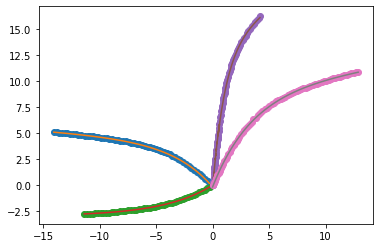

In [9]:
fit_parameters={}
curves=[pattern_left_top,pattern_left_bottom,pattern_right_top,pattern_right_bottom]
test_func=[test_func_1,test_func_1,test_func_2,test_func_2]
names=["pattern_left_top","pattern_left_bottom","pattern_right_top","pattern_right_bottom"]
for curve, func,name in zip(curves,test_func,names):
    xdata=curve["X"]
    ydata=curve["Y"]
    fit_parameters[name]=fit_curve(xdata,ydata,func)


# Synthetic data_1

## learn from real case, predict synthetic

### test with small datasets

In [ ]:
percentile_tuning={
                    "buildUp":{"left":[100,10],
                              "right":[100,10]},
                   "drawDown":{"left":[95,6],
                              "right":[95,3]}
                   }

fine_tuning={"buildUp":{"left_top":1.1,
                    "left_bottom":1.1,
                    "right_top":1.1,
                    "right_bottom":0.9},
            "drawDown":{"left_top":1.1,
                        "left_bottom":-1.1,
                        "right_top":0.9,
                        "right_bottom":1.1}}
# fine_tuning={"buildUp":{"left_top":1,
#                                     "left_bottom":1,
#                                     "right_top":1,
#                                     "right_bottom":1},
#                             "drawDown":{"left_top":1,
#                                         "left_bottom":1,
#                                         "right_top":1,
#                                         "right_bottom":1}}

point_halfWindow=8
identfication_UsePattern=PatternRecognition(point_halfWindow=point_halfWindow,time_halfWindow_forPredict=1,time_halfWindow_forLearn=1,percentile_tuning=percentile_tuning,fine_tuning=fine_tuning)

# fitting_type="linear"
fitting_type="polynomial"
mode="whole_dataset"
identfication_UsePattern.learn(pressure_measure_denoised,pressure_time_denoised,ground_truth_denoised,fitting_type=fitting_type)
identfication_UsePattern.get_tangents_twoPatterns(fitting_type)
buildup1,drawdown1=identfication_UsePattern.predict_usingTangent(pressure_measure_denoised[0:5000],pressure_time_denoised[0:5000],mode=mode,fitting_type=fitting_type)
print("**********************************")
print(f"result after first detection: buildUp,{len(buildup1)}, drawDown {len(drawdown1)}")


fitting_type="polynomial"
mode="refine_detection"
identfication_UsePattern.learn(pressure_measure_synthetic,pressure_time_synthetic,ground_truth_synthetic,fitting_type=fitting_type)
identfication_UsePattern.get_pattern(fitting_type=fitting_type)
buildup2,drawdown2=identfication_UsePattern.predict(pressure_measure_denoised[0:5000],pressure_time_denoised[0:5000],mode=mode,fitting_type=fitting_type)
print("************************************")
print(f"result after second detection: buildUp,{len(buildup2)}, drawDown {len(drawdown2)}")

### test with whole dataset

start to learn..., using polynomial curve fitting
detect breakpoint type.....
-------calculate_Parameters_allCurve using 'linear' fitting
------In the input ground truth: 25 points are detected as buildup, 28 points are detected as drawDown
start to learn 'buildUp' pattern...
-------calculate_Parameters_allCurve using 'polynomial' fitting
start to learn 'drawDown' pattern...
-------calculate_Parameters_allCurve using 'polynomial' fitting
start to get tangent pattern..., using 'polynomial' fitting
start to predict using tangent...
-------calculate_Parameters_allCurve using 'polynomial' fitting
detect breakpoint type.....
-------calculate_Parameters_allCurve using 'linear' fitting
**********************************
result after first detection: buildUp,92, drawDown 136
start to learn..., using polynomial curve fitting
detect breakpoint type.....
-------calculate_Parameters_allCurve using 'linear' fitting
------In the input ground truth: 25 points are detected as buildup, 28 points are de

<Figure size 1440x720 with 0 Axes>

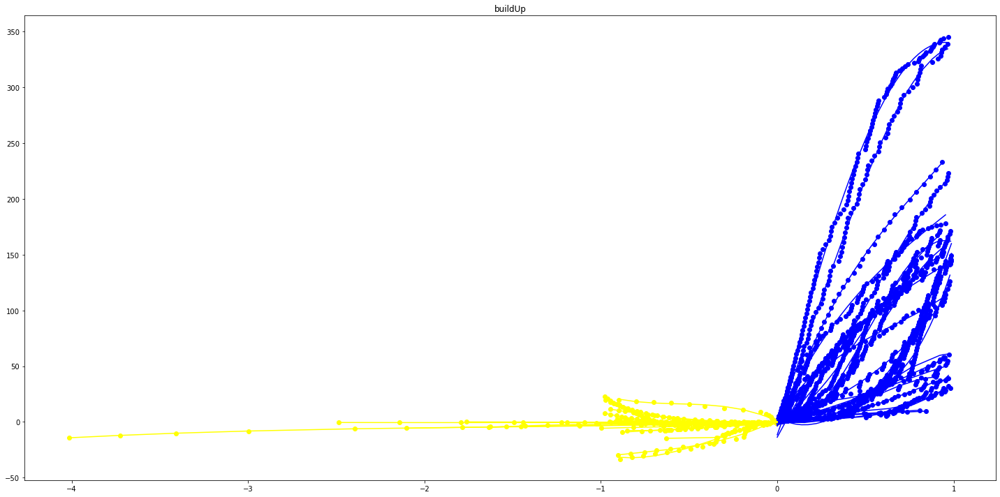

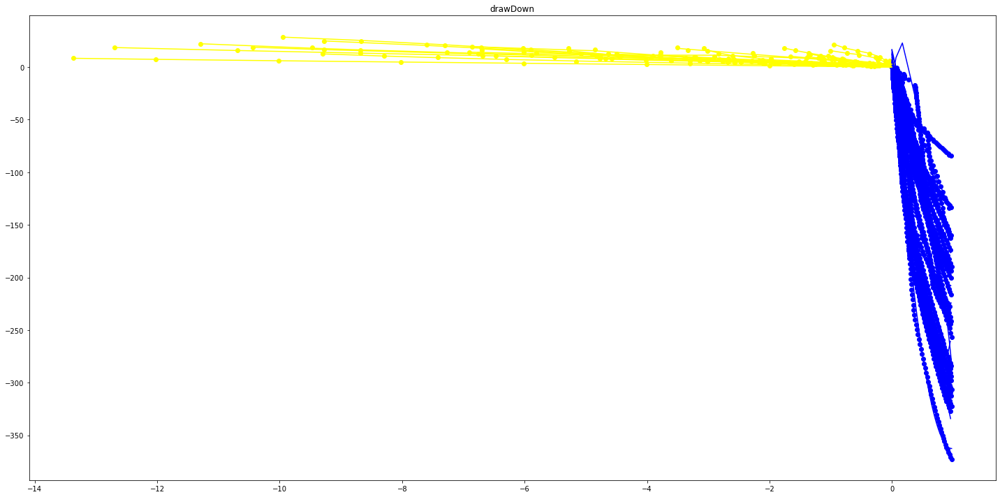

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

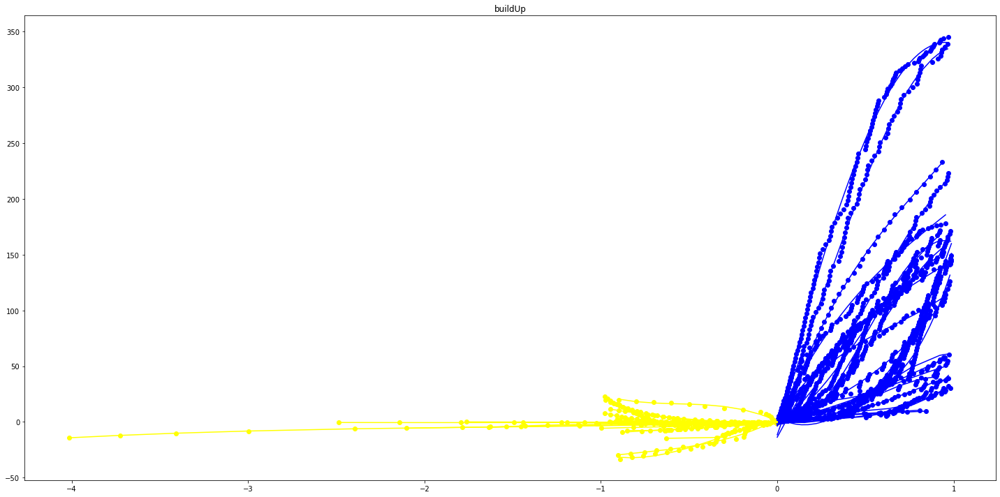

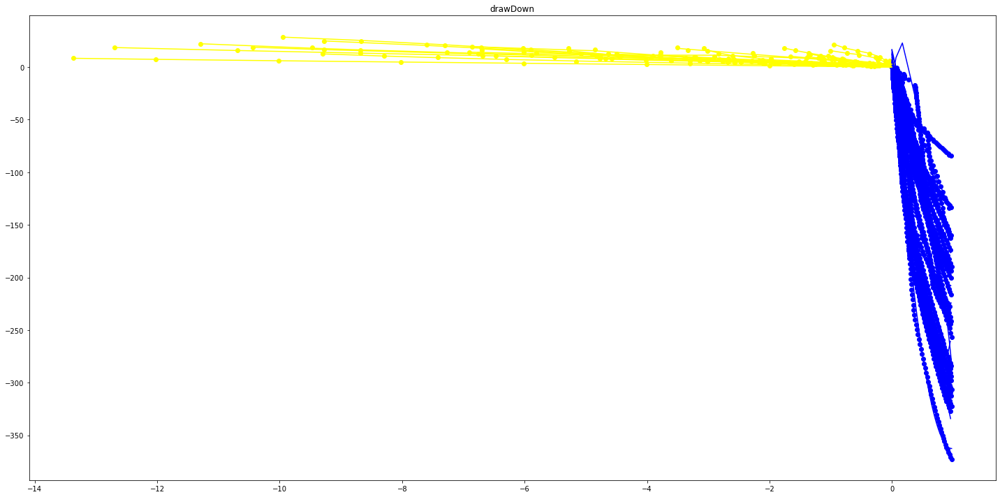

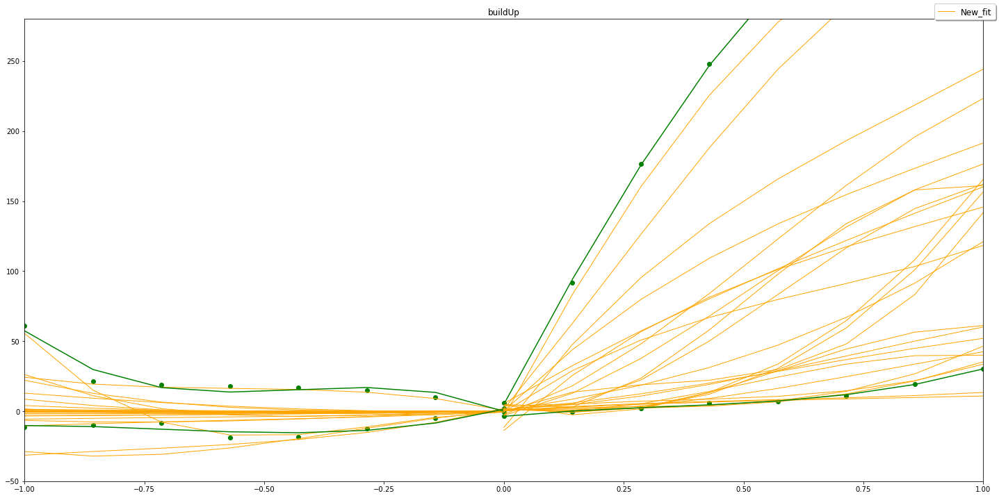

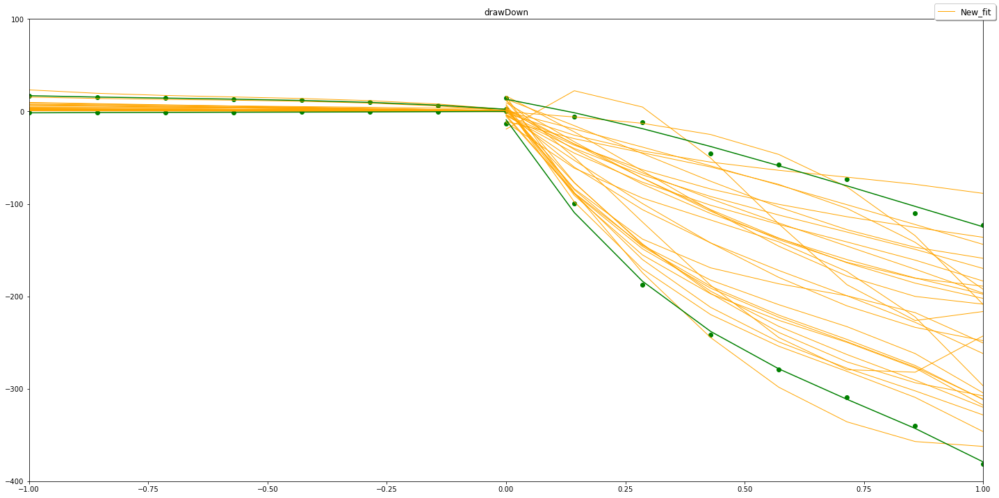

<Figure size 1440x720 with 0 Axes>

In [29]:
percentile_tuning={
                    "buildUp":{"left":[100,10],
                              "right":[100,10]},
                   "drawDown":{"left":[95,6],
                              "right":[95,3]}
                   }

fine_tuning={"buildUp":{"left_top":1.1,
                    "left_bottom":1.1,
                    "right_top":1.1,
                    "right_bottom":0.9},
            "drawDown":{"left_top":1.1,
                        "left_bottom":-1.1,
                        "right_top":0.9,
                        "right_bottom":1.1}}
# fine_tuning={"buildUp":{"left_top":1,
#                                     "left_bottom":1,
#                                     "right_top":1,
#                                     "right_bottom":1},
#                             "drawDown":{"left_top":1,
#                                         "left_bottom":1,
#                                         "right_top":1,
#                                         "right_bottom":1}}

point_halfWindow=8
identfication_UsePattern=PatternRecognition(point_halfWindow=point_halfWindow,time_halfWindow_forPredict=1,time_halfWindow_forLearn=1,percentile_tuning=percentile_tuning,fine_tuning=fine_tuning)

# fitting_type="linear"
fitting_type="polynomial"
mode="whole_dataset"
identfication_UsePattern.learn(pressure_measure_denoised,pressure_time_denoised,ground_truth_denoised,fitting_type=fitting_type)
identfication_UsePattern.get_tangents_twoPatterns(fitting_type)
buildup1,drawdown1=identfication_UsePattern.predict_usingTangent(pressure_measure_synthetic,pressure_time_synthetic,mode="whole_dataset",fitting_type=fitting_type)
print("**********************************")
print(f"result after first detection: buildUp,{len(buildup1)}, drawDown {len(drawdown1)}")


fitting_type="polynomial"
mode="refine_detection"
identfication_UsePattern.learn(pressure_measure_denoised,pressure_time_denoised,ground_truth_denoised,fitting_type=fitting_type)
identfication_UsePattern.get_pattern(fitting_type=fitting_type)
buildup2,drawdown2=identfication_UsePattern.predict(pressure_measure_synthetic,pressure_time_synthetic,mode="refine_detection",fitting_type=fitting_type)
print("************************************")
print(f"result after second detection: buildUp,{len(buildup2)}, drawDown {len(drawdown2)}")

## learn from synthetic, predict synthetic

start to learn..., using polynomial curve fitting
detect breakpoint type.....
-------calculate_Parameters_allCurve using 'linear' fitting
------In the input ground truth: 22 points are detected as buildup, 23 points are detected as drawDown
-------calculate_Parameters_allCurve using 'polynomial' fitting
parameters (-0.11446499040219961, 0.5819822018084511, -18.20506611530437, -0.031523046669755146)
parameters (1742.3228688112702, -2810.494629463182, 1566.1796675404437, 94.48869471334459)
parameters (-67671.27554461101, -11175.531698551462, -226.85577274405273, -1.3880460812410313)
parameters (6476.053630651877, -6984.549188754492, 2561.6543695320424, 67.30858089292768)
parameters (-0.0008908889418099626, 0.017145936494595226, -2.9188738495679734, -0.06633001383019671)
parameters (2315.2517368732297, -3145.3112099283185, 1484.38978695207, 70.95601002545583)
parameters (-0.002024538269399193, 0.03756772184130218, -5.033212294859148, -0.06593303720688516)
parameters (3313.786126409721, -3

-----start to calculate'drawDown' pattern parameter, there are 23 for calculation
parameters (0.0034970814645565907, 0.29937313816817507, 20.39416345327287, 35.79287999452194)
parameters (-77.1100371987984, -150.6853565270528, 30.496903717928408, 1.383739881708418)
parameters (-458.2257421161133, 657.6883625687819, -416.73686830198227, -25.81962368736664)
parameters (-18373.87433234173, 21723.207851594994, -8315.160684121123, -275.48223678336035)
start to predict using pattern...
after second prediction, there are 116 detected buildup points, 0 drawdown detected
detect breakpoint type.....
-------calculate_Parameters_allCurve using 'linear' fitting
after second prediction, the results are filtered further, there are 115 detected buildup points, 0 drawdown detected
************************************
result after second detection: buildUp,115, drawDown 0


<Figure size 1440x720 with 0 Axes>

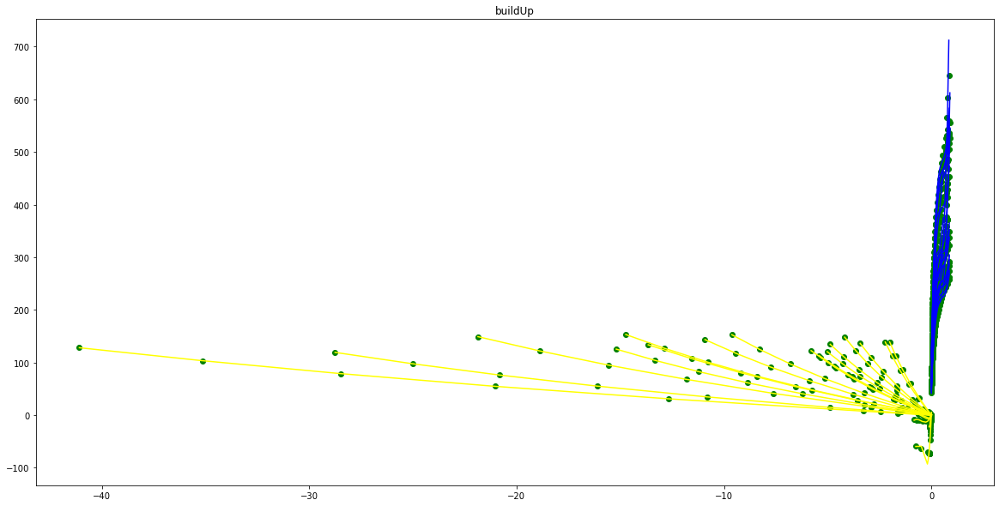

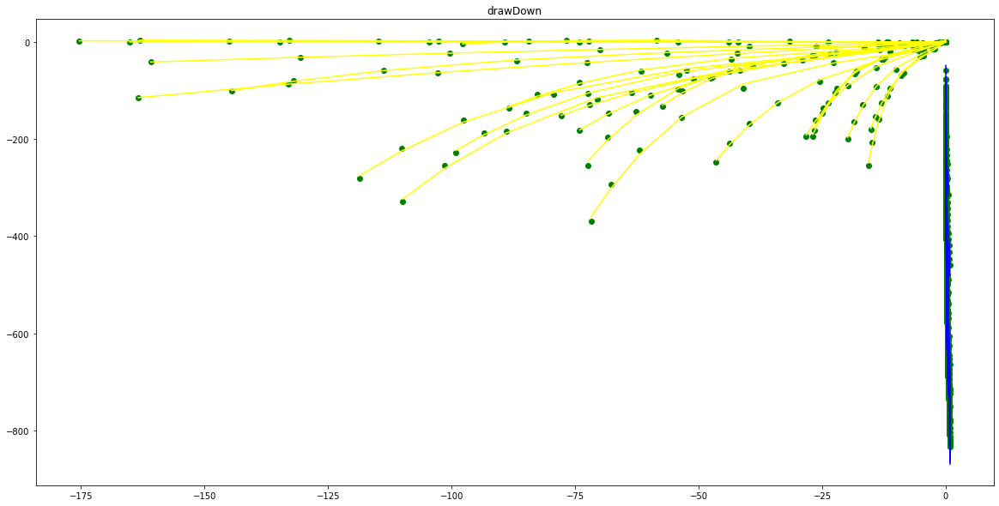

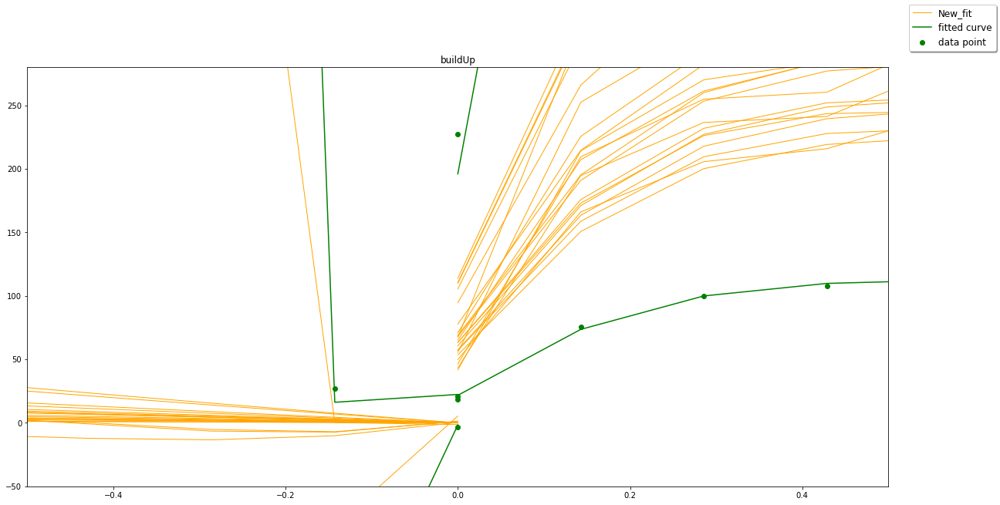

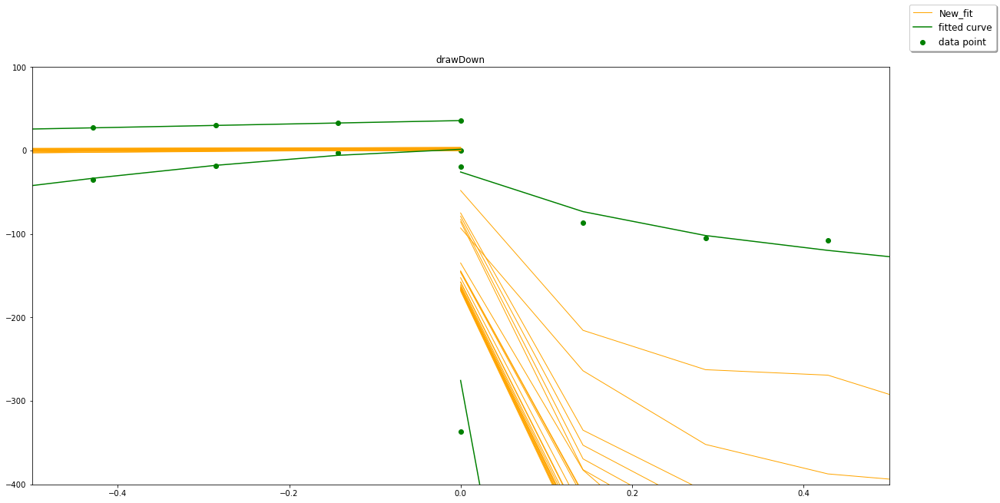

<Figure size 1440x720 with 0 Axes>

In [10]:
percentile_tuning={
                    "buildUp":{"left":[100,10],
                              "right":[100,10]},
                   "drawDown":{"left":[95,6],
                              "right":[95,3]}
                   }

# fine_tuning={"buildUp":{"left_top":1.1,
#                     "left_bottom":1.1,
#                     "right_top":1.1,
#                     "right_bottom":0.9},
#             "drawDown":{"left_top":1.1,
#                         "left_bottom":-1.1,
#                         "right_top":0.9,
#                         "right_bottom":1.1}}
fine_tuning={"buildUp":{"left_top":1,
                                    "left_bottom":1,
                                    "right_top":1,
                                    "right_bottom":1},
                            "drawDown":{"left_top":1,
                                        "left_bottom":1,
                                        "right_top":1,
                                        "right_bottom":1}}

percentile_tuning={
                                    "buildUp":{"left":[98,0],
                                              "right":[98,0]},
                                   "drawDown":{"left":[100,0],
                                              "right":[100,0]}
                                   }

fine_tuning={"buildUp":{"left_top":3.5,
                    "left_bottom":2.5,
                    "right_top":2,
                    "right_bottom":0.5},
            "drawDown":{"left_top":10,
                        "left_bottom":15,
                        "right_top":0.4,
                        "right_bottom":2}}
time_halfWindow_forPredict=0.5
time_halfWindow_forLearn=1
identfication_UsePattern=PatternRecognition(time_halfWindow_forPredict=time_halfWindow_forPredict,time_halfWindow_forLearn=time_halfWindow_forLearn,percentile_tuning=percentile_tuning,fine_tuning=fine_tuning)

# # fitting_type="linear"
# fitting_type="polynomial"
# mode="whole_dataset"
# identfication_UsePattern.learn(pressure_measure_synthetic,pressure_time_synthetic,ground_truth_synthetic,fitting_type=fitting_type)
# identfication_UsePattern.get_tangents_twoPatterns(fitting_type)
# points=[index for index in range(len(pressure_measure_synthetic))]
# buildup1,drawdown1=identfication_UsePattern.predict_usingTangentRange(pressure_measure_synthetic,pressure_time_synthetic,points,fitting_type=fitting_type)
# print("**********************************")
# print(f"result after first detection: buildUp,{len(buildup1)}, drawDown {len(drawdown1)}")



fitting_type="polynomial"
mode="refine_detection"
identfication_UsePattern.learn(pressure_measure_synthetic,pressure_time_synthetic,ground_truth_synthetic,fitting_type=fitting_type)
identfication_UsePattern.get_pattern(fitting_type=fitting_type)
points=buildup1+drawdown1
points=[index for index in range(len(pressure_measure_synthetic))]
buildup2,drawdown2=identfication_UsePattern.predict_usePatternRecognition(pressure_measure_synthetic,pressure_time_synthetic,points,fitting_type=fitting_type)
print("************************************")
print(f"result after second detection: buildUp,{len(buildup2)}, drawDown {len(drawdown2)}")

## plot detected points

---initializing...
---plotting...
No ground truth defined


findfont: Font family ['Arial Black'] not found. Falling back to DejaVu Sans.


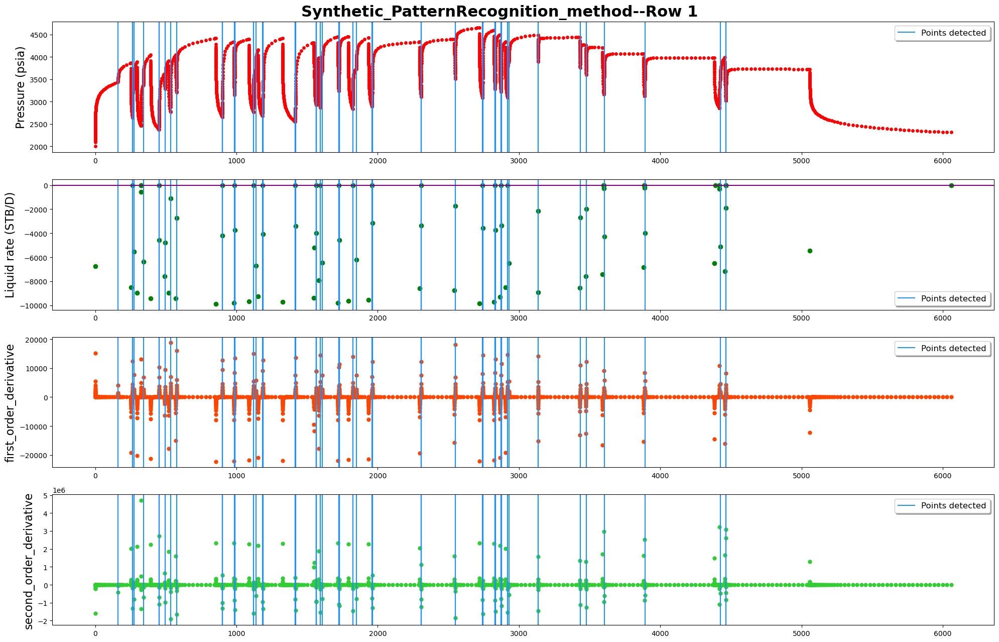

detected 115 points as breakpoints
The plot is devided into 9 rows
------row 1-----detected points:[80, 162, 163, 164, 165, 219, 221, 350]


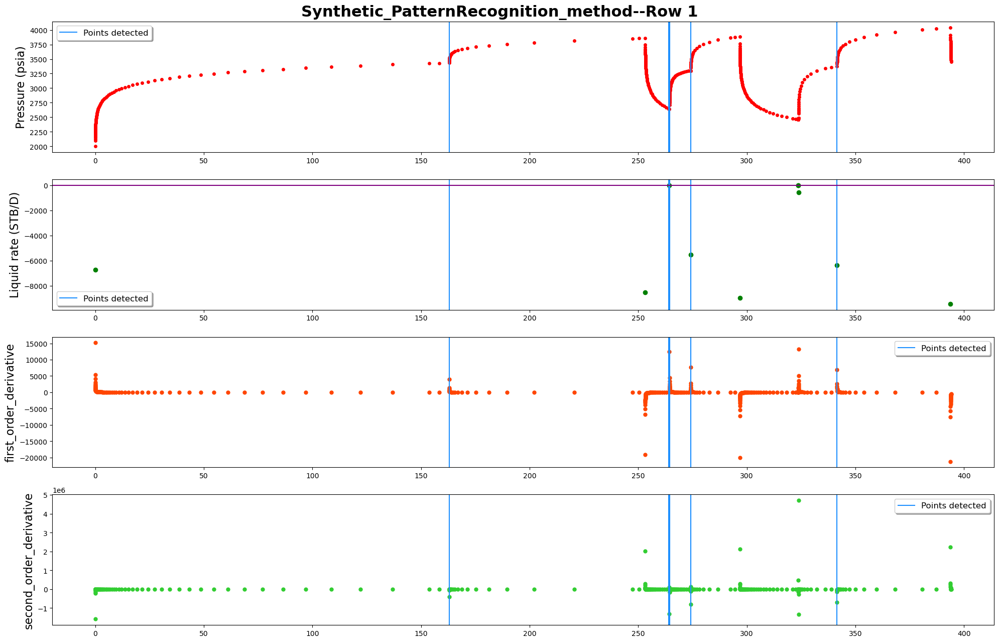

------row 2-----detected points:[446, 447, 478, 479, 480, 523, 524, 568, 569, 611, 612, 713, 714, 743, 744, 745]


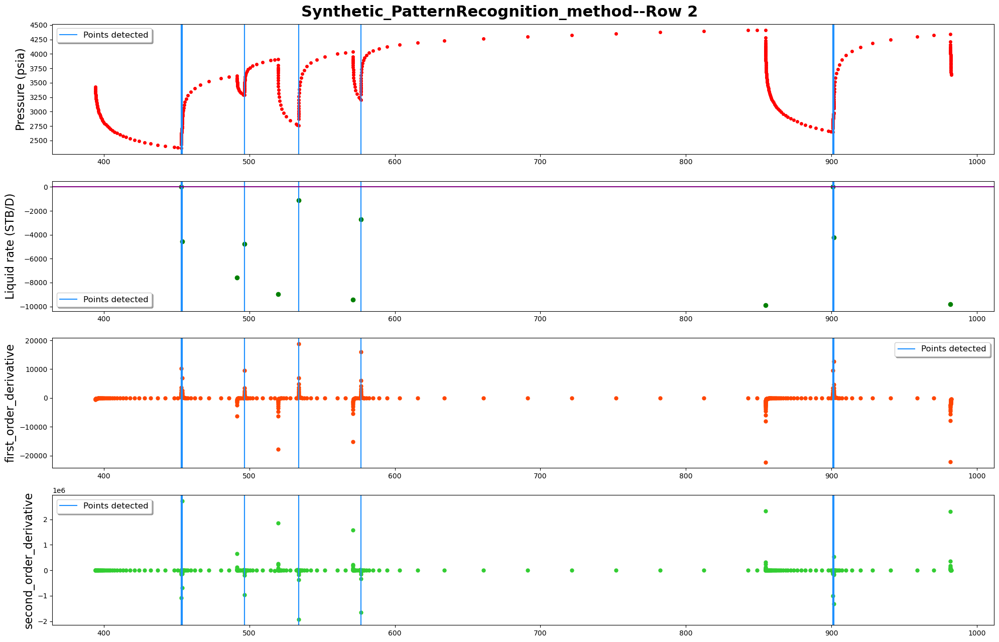

------row 3-----detected points:[818, 819, 821, 858, 859, 861, 951, 952, 953, 954, 1014, 1101, 1102, 1151, 1152]


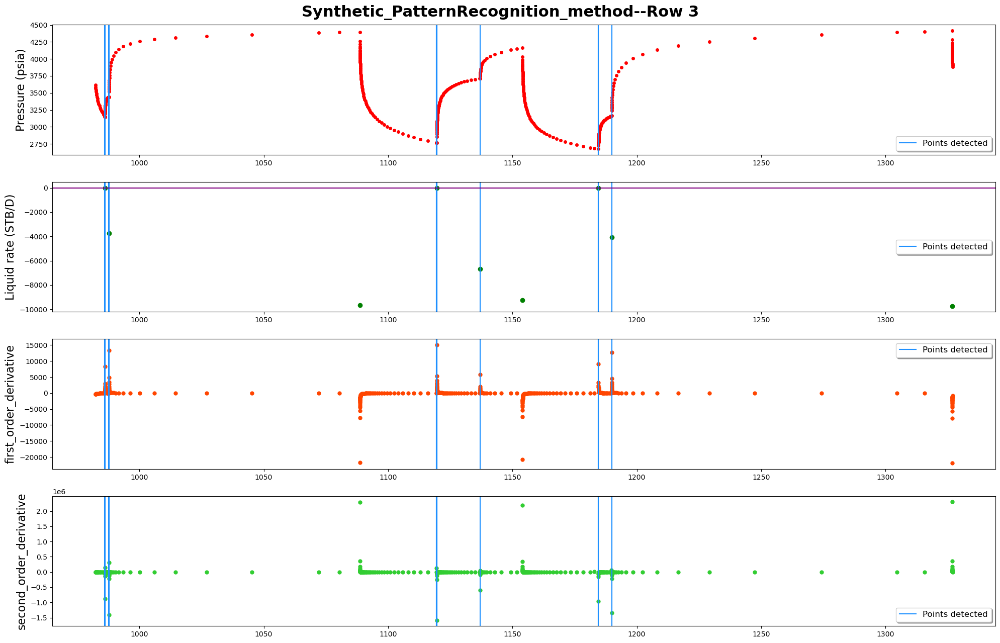

------row 4-----detected points:[1254, 1255, 1289, 1290, 1291, 1396, 1397, 1432, 1433, 1434, 1435, 1439, 1512, 1513, 1514, 1571, 1572]


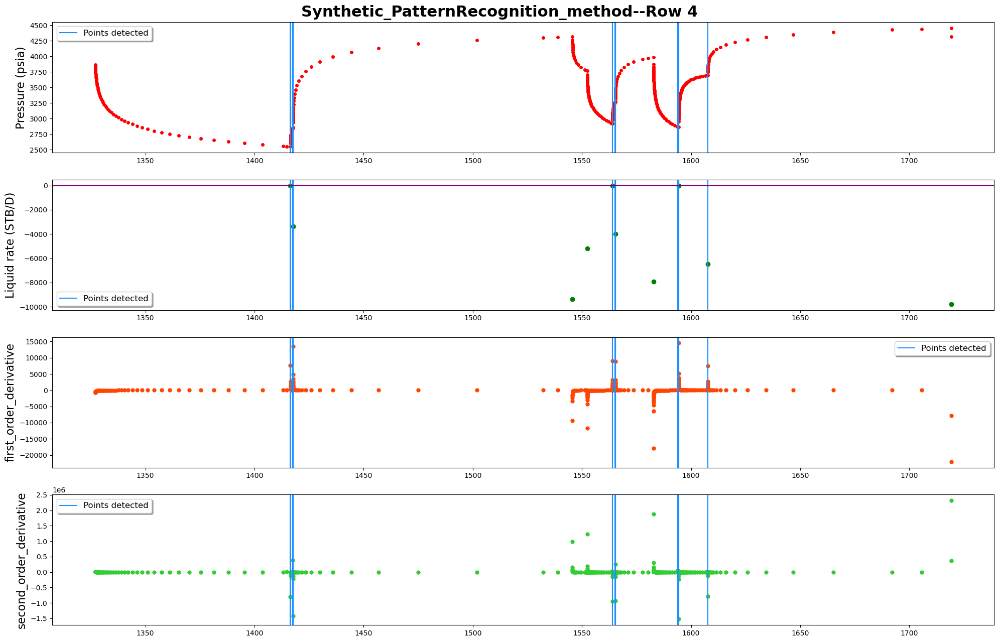

------row 5-----detected points:[1646, 1647, 1649, 1691, 1692, 1693, 1694, 1784, 1785, 1848, 1849, 1938, 1939, 1980, 1981, 1982]


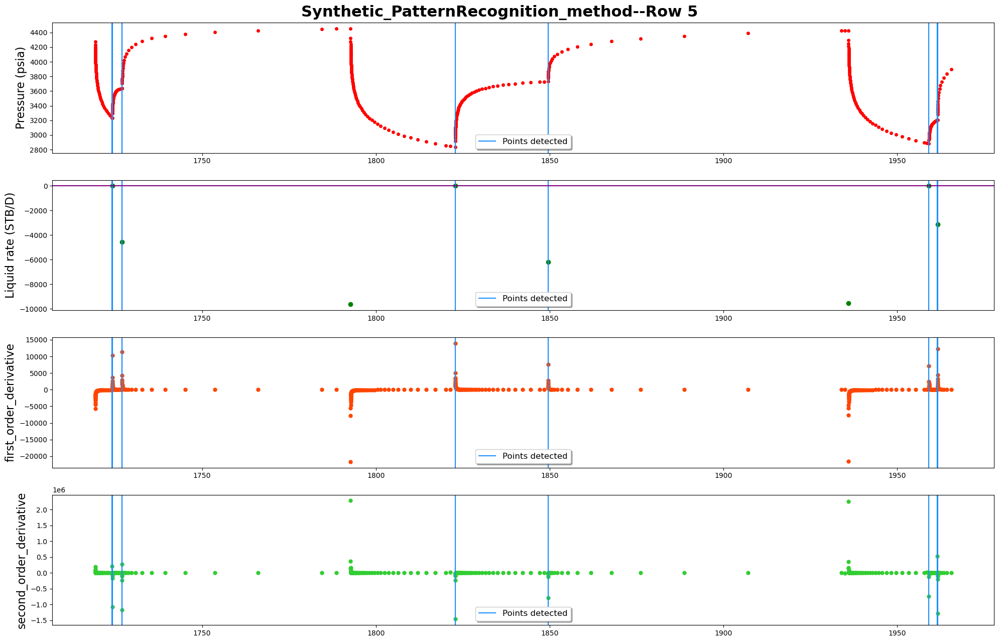

------row 6-----detected points:[2073, 2074, 2104, 2105, 2106, 2156, 2157, 2247, 2248, 2287, 2288, 2290, 2367, 2368, 2369, 2370]


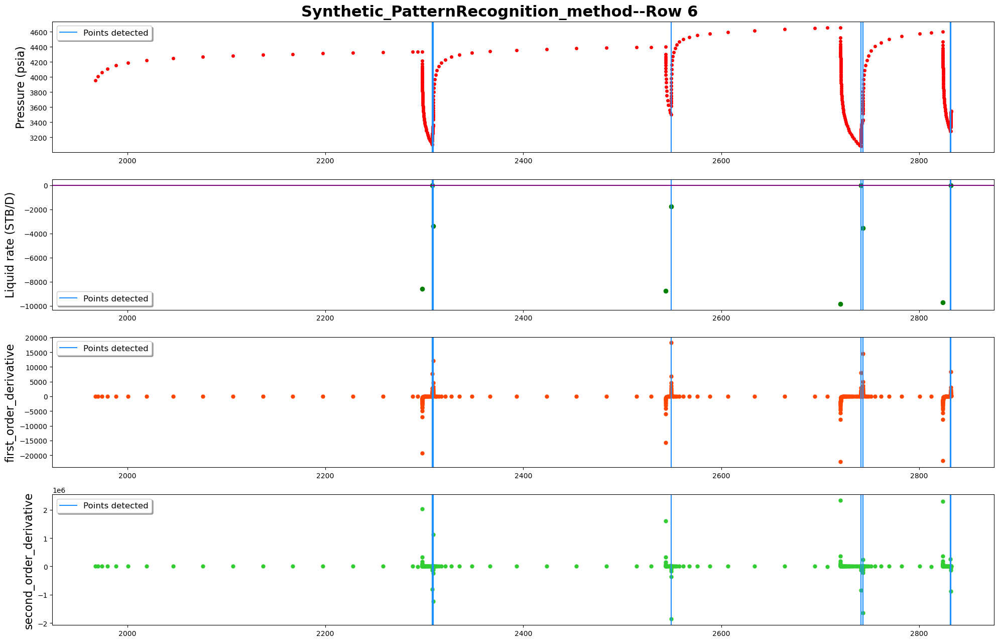

------row 7-----detected points:[2407, 2408, 2410, 2487, 2488, 2490, 2526, 2527, 2528, 2529, 2609, 2610, 2611, 2667, 2712, 2713, 2714, 2764, 2765]


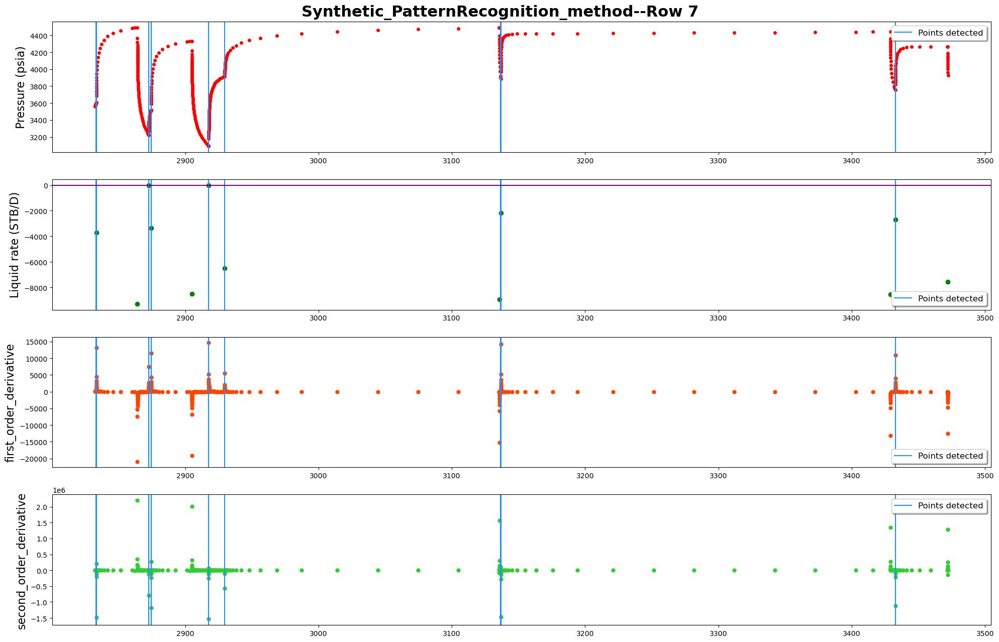

------row 8-----detected points:[2807, 2808, 2932, 3061]


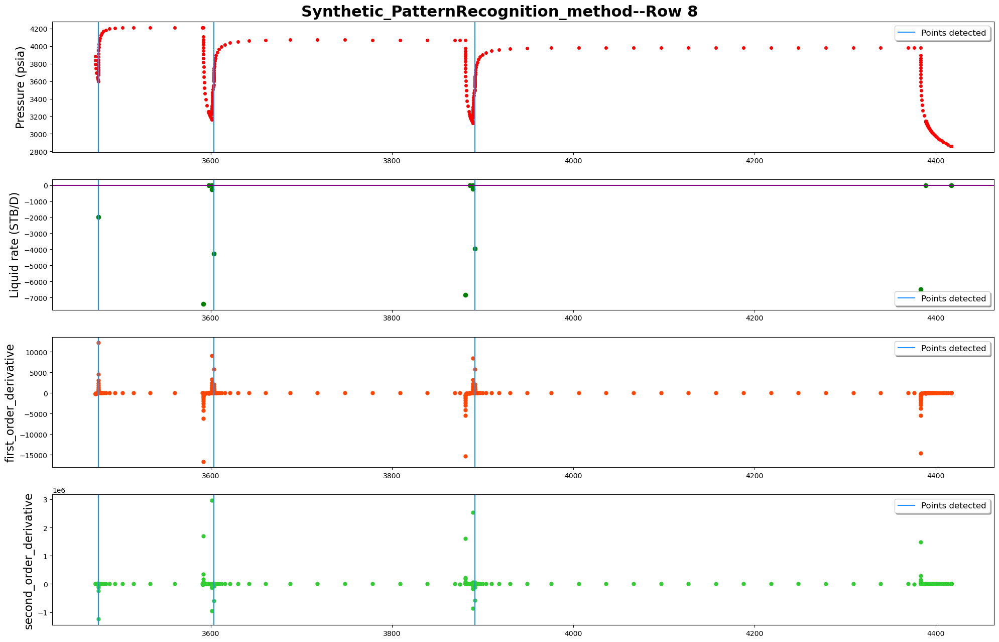

------row 9-----detected points:[3260, 3366, 3367, 3368]


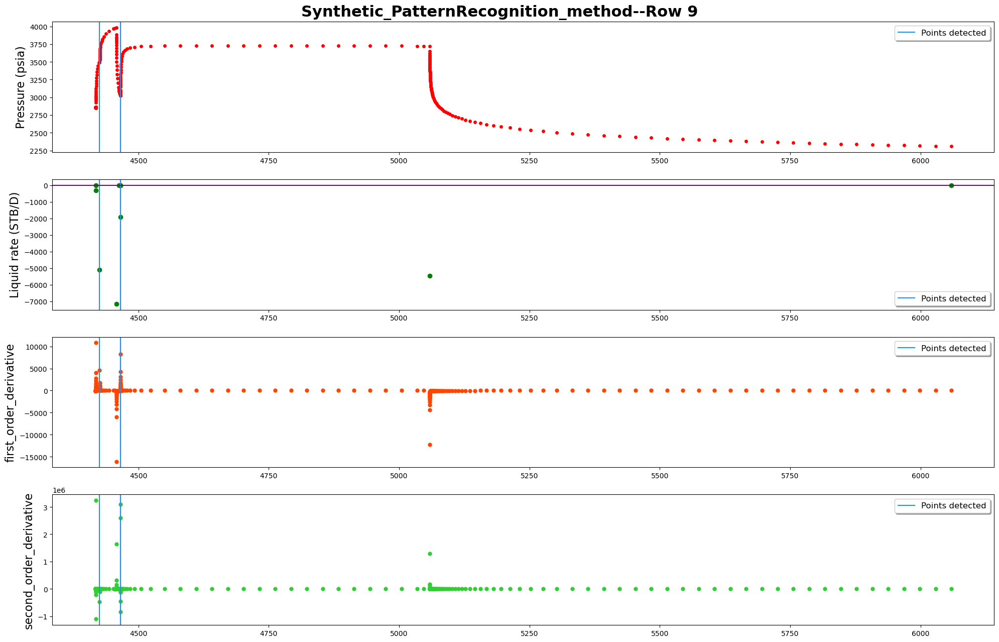

In [14]:

colum_names_synthetic={"pressure":{"time":"Date",
                        "measure":"Pressure (psia)",
                        "first_order_derivative":"first_order_derivative",
                        "second_order_derivative":"second_order_derivative"},
             "rate":{"time":"Time@end",
                     "measure":"Liquid rate (STB/D)"}}
data_inOneRow_synthetic=400

pressure_df=pressure_df_synthetic
rate_df=rate_df_synthetic
buildup=buildup2
data_inOneRow=data_inOneRow_synthetic
colum_names=colum_names_synthetic

filename_toSave=""
plot_name="Synthetic_PatternRecognition_method"
plot_whole=True
plot_details=True
plot_statistics=False
PlotNSave(pressure_df,
          rate_df,
          buildup2,
          [],
          data_inOneRow,
          plot_name,
         "",
         colum_names=colum_names_synthetic)

---initializing...
---plotting...


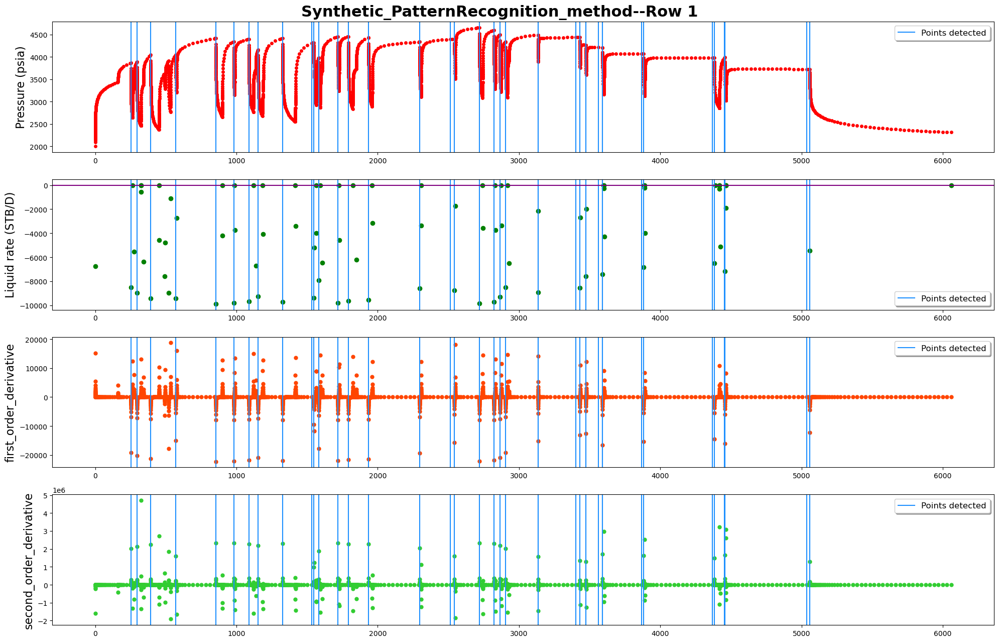

detected 39 points as breakpoints
The plot is devided into 9 rows
------row 1-----detected points:[107, 243, 375]


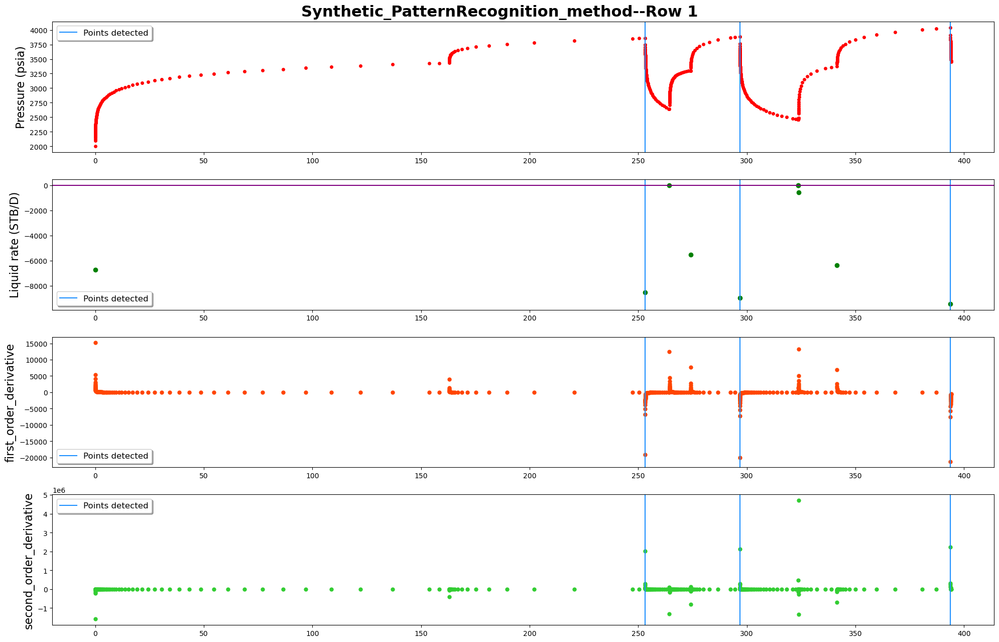

------row 2-----detected points:[592, 644, 771]


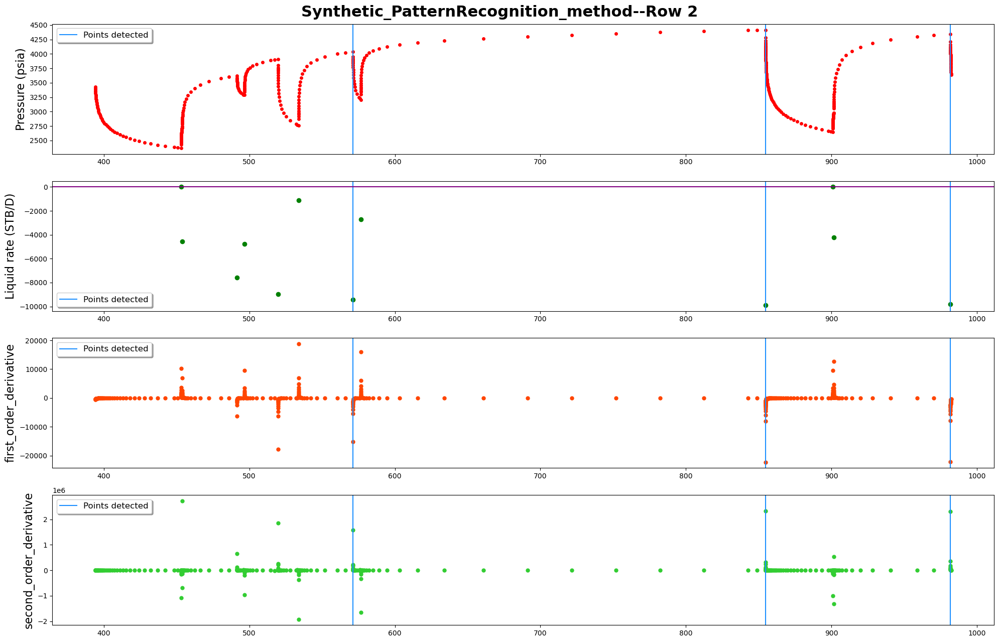

------row 3-----detected points:[887, 1036, 1179]


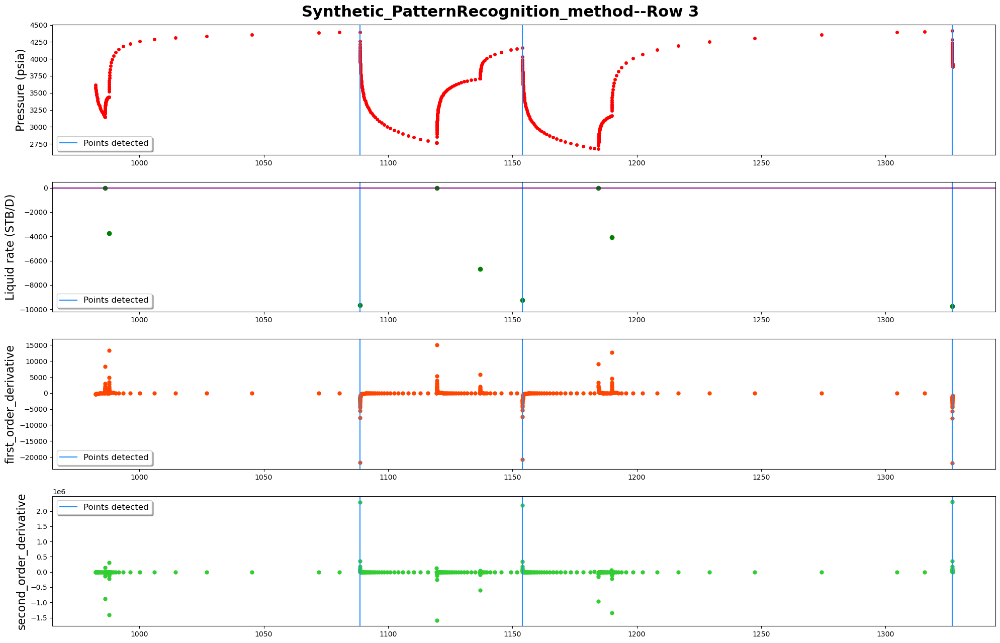

------row 4-----detected points:[1317, 1319, 1456, 1598]


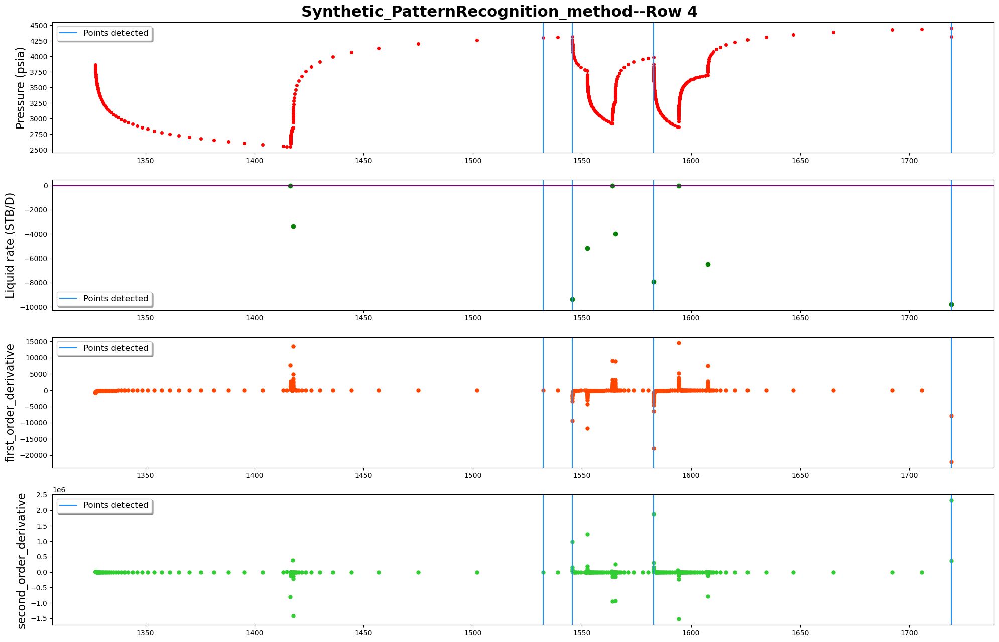

------row 5-----detected points:[1719, 1875]


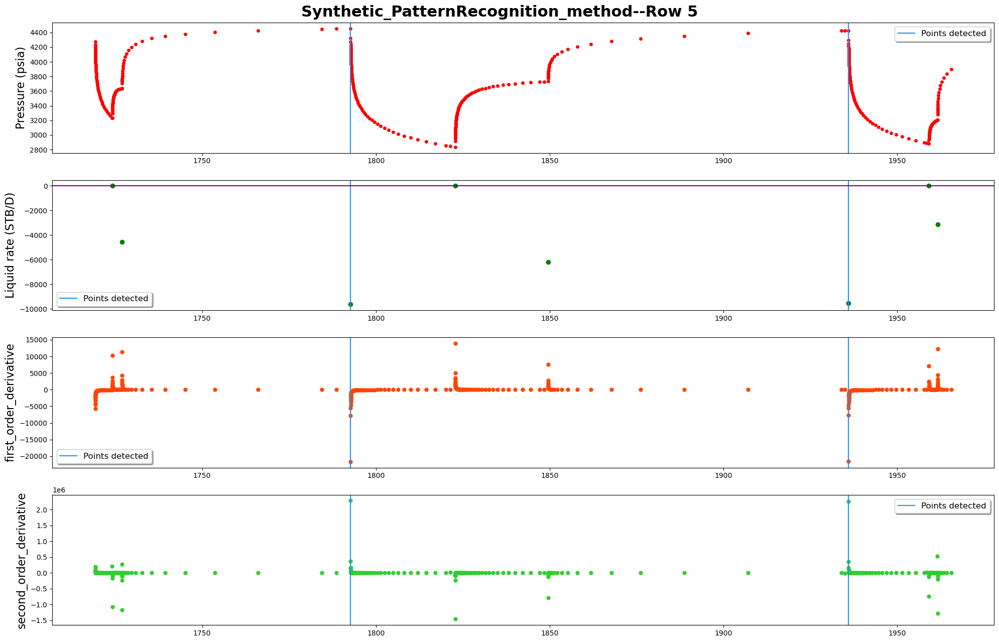

------row 6-----detected points:[2017, 2135, 2137, 2185, 2315]


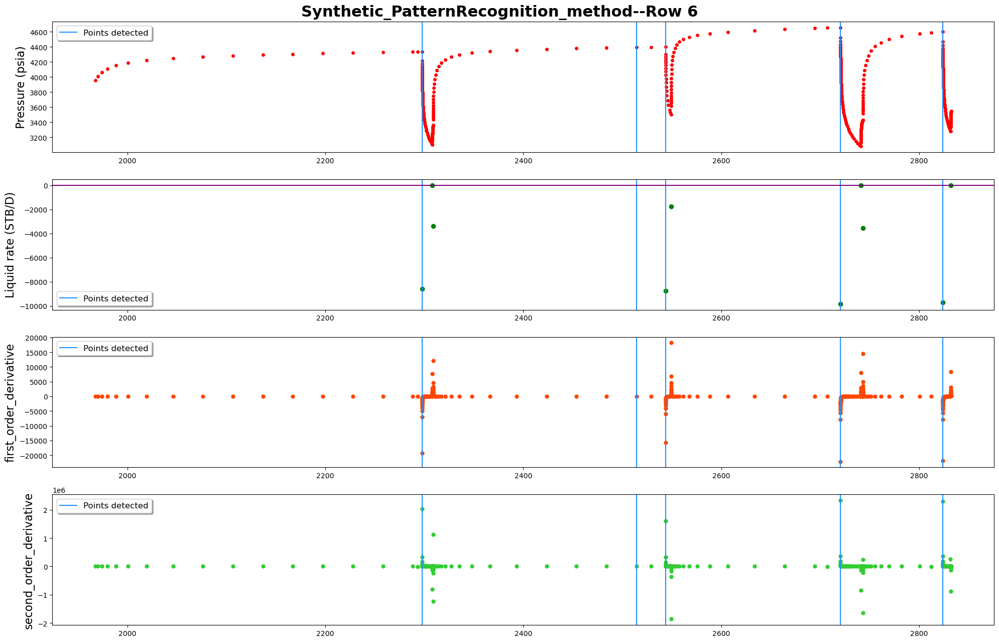

------row 7-----detected points:[2433, 2552, 2697, 2698, 2744, 2746, 2787, 2789]


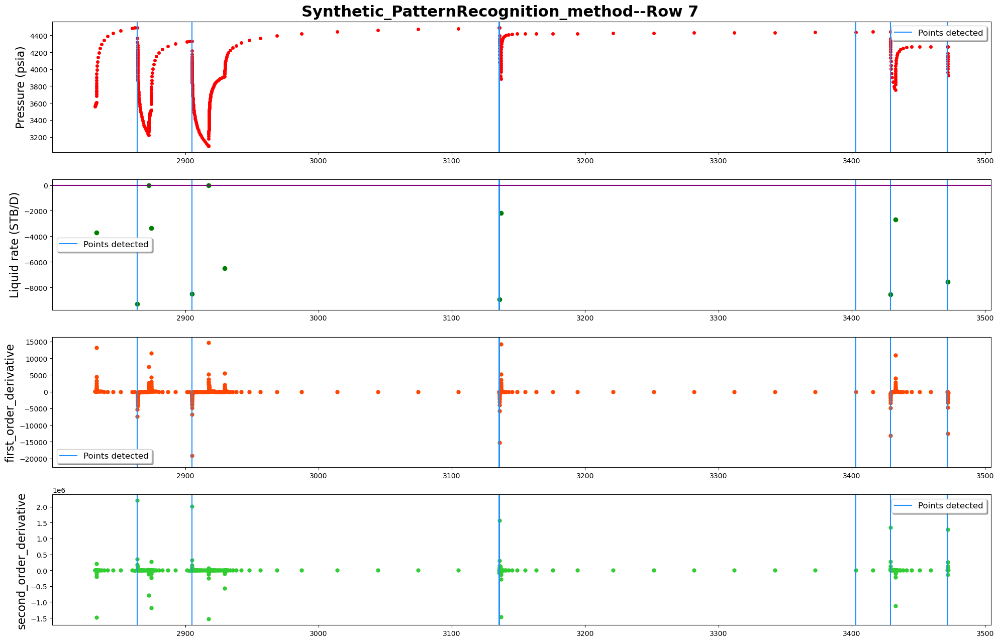

------row 8-----detected points:[2832, 2833, 2835, 2963, 2965, 3099, 3101]


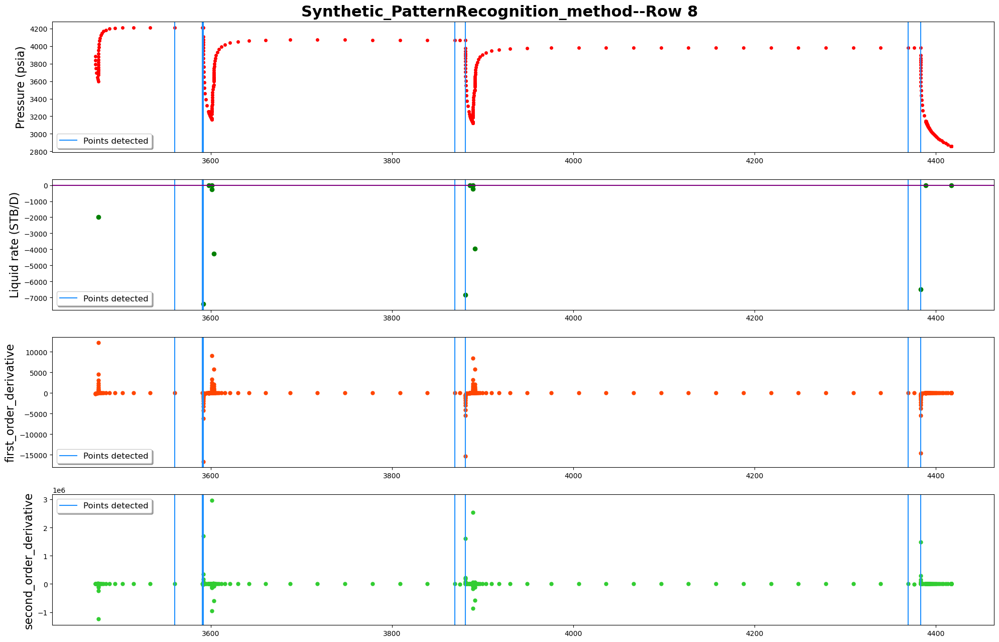

------row 9-----detected points:[3282, 3284, 3409, 3411]


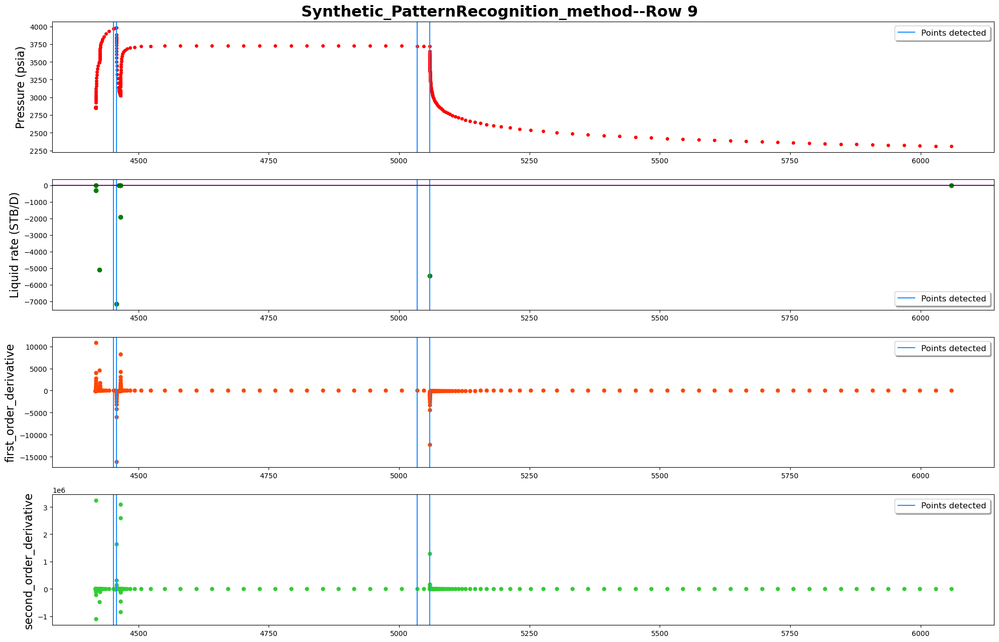

In [20]:
filename_toSave=""
plot_name="Synthetic_PatternRecognition_method"
plot_whole=True
plot_details=True
plot_statistics=False
PlotNSave(pressure_df,
          rate_df,
          drawdown1,
          [],
          data_inOneRow,
          plot_name,
          filename_toSave,
          plot_statistics,
          plot_whole,
          plot_details,
          colum_names)

# real case data

## raw data

#todo

## denoised data

### get pattern

detect_breakpoint.....
-------start to extract_points_inTimeWindow
---------------calculate_Parameters_allCurve linear
--------------self.buildUp_or_drawDown 
------In the input ground truth: 25 points are detected as buildup, 28 points are detected as drawDown
start to learn 'buildUp' pattern...
-------start to extract_points_inTimeWindow
---------------calculate_Parameters_allCurve polynomial
--------------self.buildUp_or_drawDown buildUp
start to learn 'drawDown' pattern...
-------start to extract_points_inTimeWindow
---------------calculate_Parameters_allCurve polynomial
--------------self.buildUp_or_drawDown drawDown
-----start to calculate'buildUp' pattern parameter, there are 25 for calculation
-----start to calculate'drawDown' pattern parameter, there are 28 for calculation


<Figure size 1440x720 with 0 Axes>

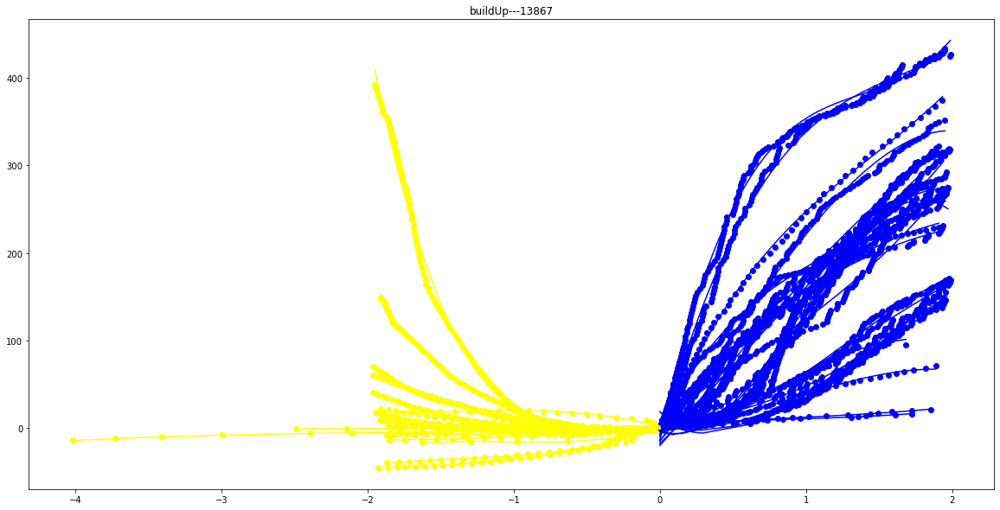

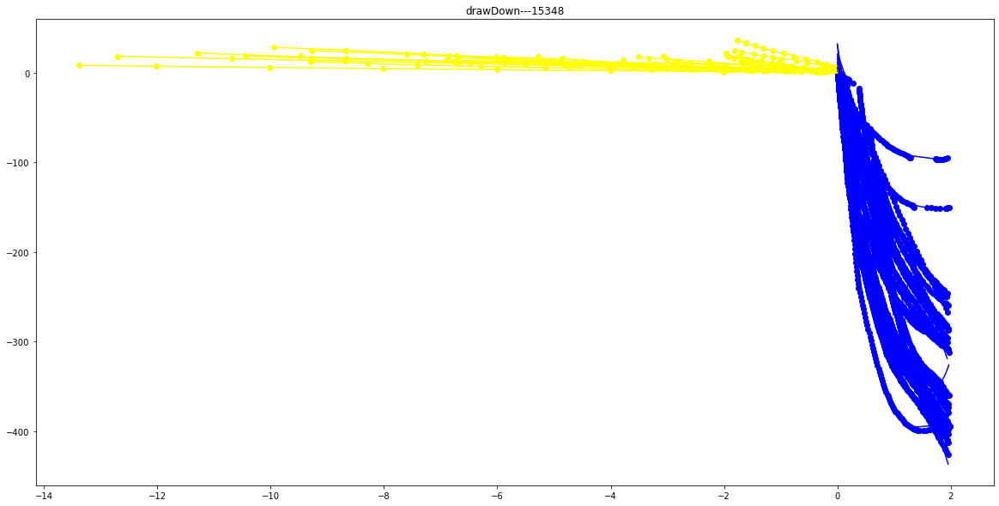

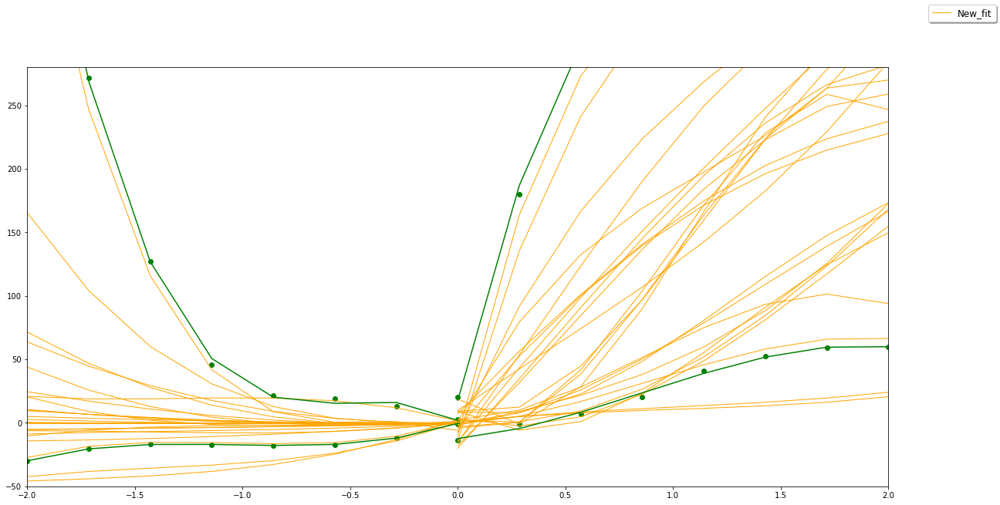

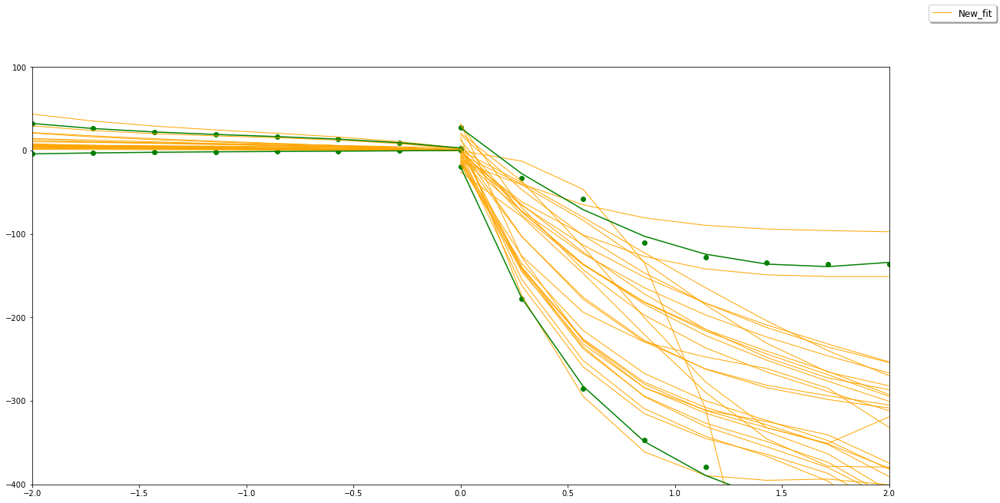

In [4]:
percentile_tuning={
                                    "buildUp":{"left":[100,10],
                                              "right":[100,10]},
                                   "drawDown":{"left":[95,6],
                                              "right":[95,3]}
                                   }


fine_tuning={"buildUp":{"left_top":1.1,
                    "left_bottom":1.1,
                    "right_top":1.1,
                    "right_bottom":0.9},
            "drawDown":{"left_top":1.1,
                        "left_bottom":-1.1,
                        "right_top":0.9,
                        "right_bottom":1.1}}

identfication_UsePattern=PatternRecognition(time_halfWindow_forPredict=2,time_halfWindow_forLearn=2,percentile_tuning=percentile_tuning,fine_tuning=fine_tuning)
identfication_UsePattern.learn(pressure_measure_denoised,pressure_time_denoised,ground_truth_denoised,fitting_type="polynomial")
# identfication_UsePattern.learn(pressure_measure_synthetic,pressure_time_synthetic,ground_truth_synthetic,fitting_type="polynomial")
identfication_UsePattern.get_pattern(fitting_type="polynomial")

### learn from real case, predict real case

start to learn..., using linear curve fitting
detect breakpoint type.....
-------calculate_Parameters_allCurve using 'linear' fitting
------In the input ground truth: 25 points are detected as buildup, 28 points are detected as drawDown
start to learn 'buildUp' pattern...
-------calculate_Parameters_allCurve using 'linear' fitting
start to learn 'drawDown' pattern...
-------calculate_Parameters_allCurve using 'linear' fitting
start to get tangent pattern..., using 'linear' fitting
start to predict using tangent...
-------calculate_Parameters_allCurve using 'linear' fitting
detect breakpoint type.....
-------calculate_Parameters_allCurve using 'linear' fitting
3677 433
start to learn..., using polynomial curve fitting
detect breakpoint type.....
-------calculate_Parameters_allCurve using 'linear' fitting
------In the input ground truth: 25 points are detected as buildup, 28 points are detected as drawDown
start to learn 'buildUp' pattern...
-------calculate_Parameters_allCurve using 'po

<Figure size 1440x720 with 0 Axes>

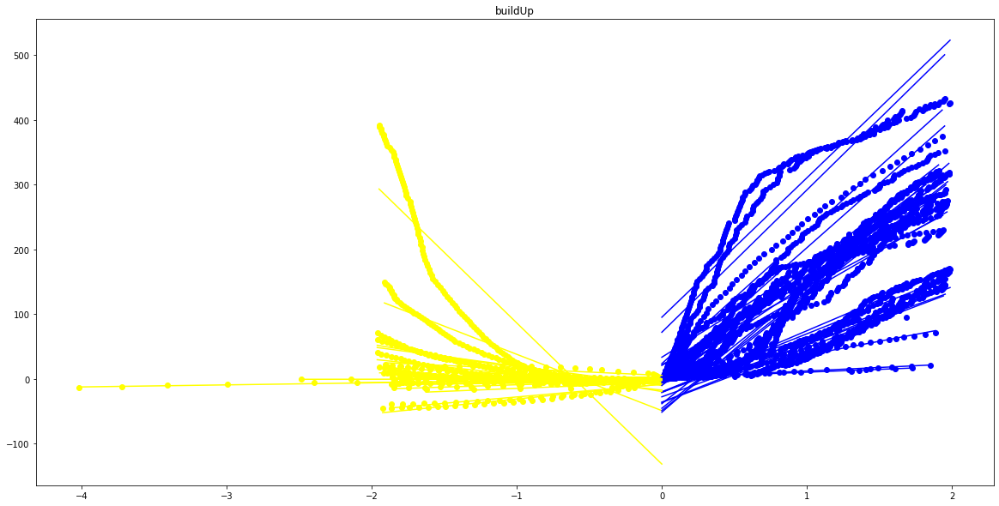

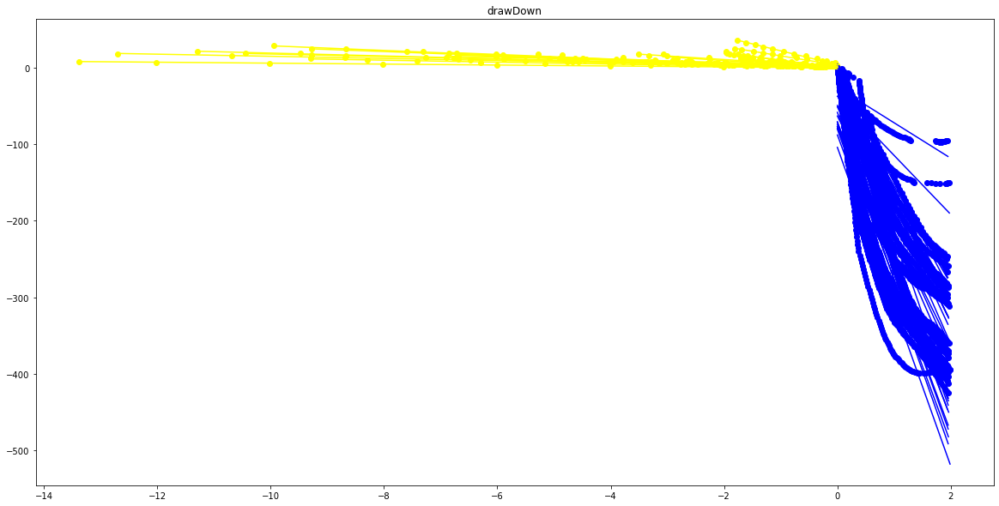

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

<Figure size 1440x720 with 0 Axes>

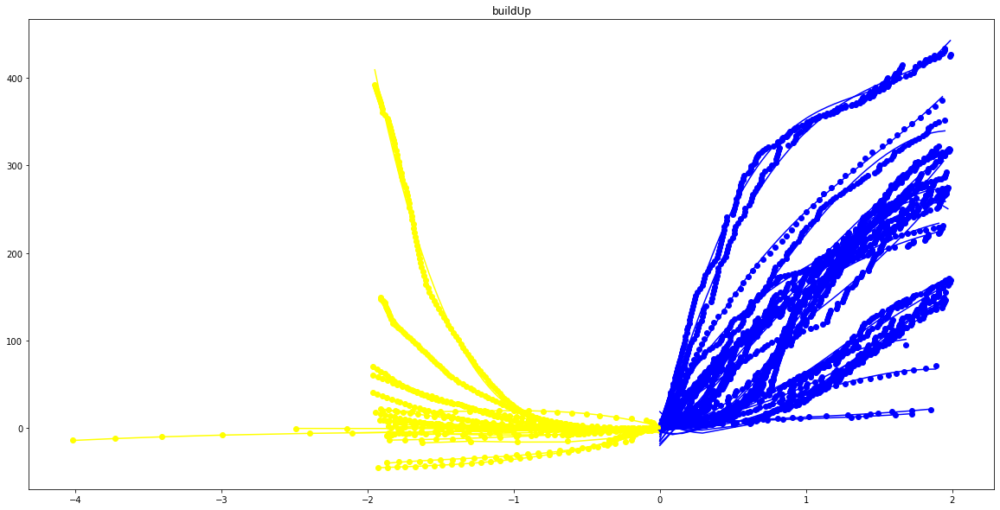

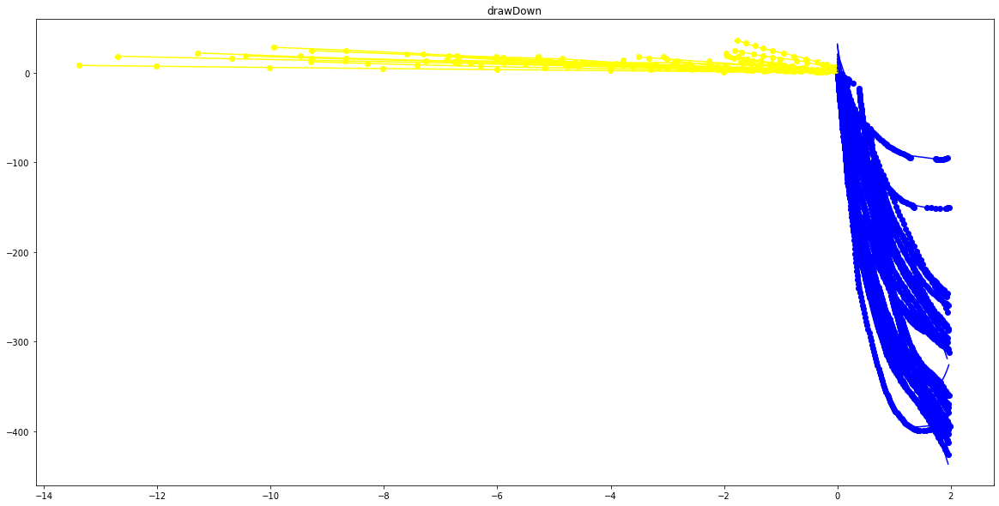

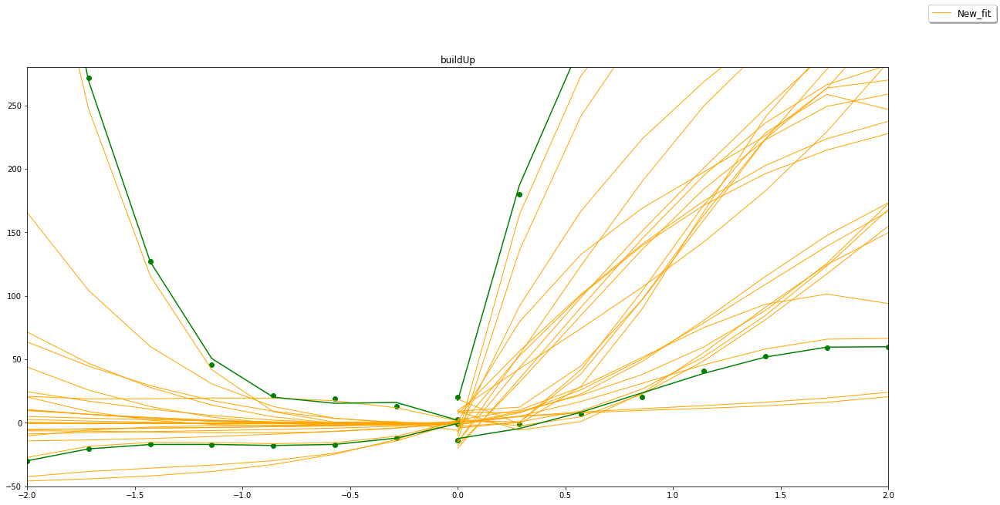

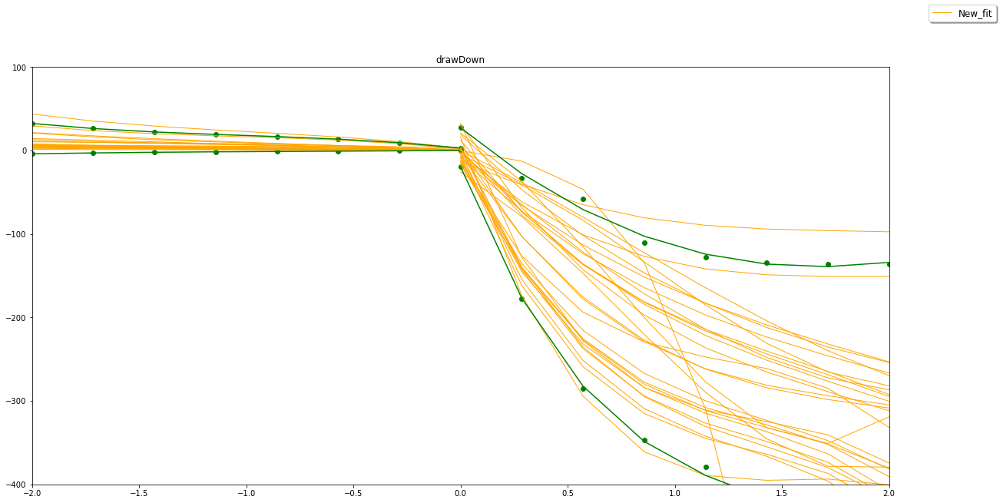

<Figure size 1440x720 with 0 Axes>

In [5]:
percentile_tuning={
                    "buildUp":{"left":[100,10],
                              "right":[100,10]},
                   "drawDown":{"left":[95,6],
                              "right":[95,3]}
                   }


fine_tuning={"buildUp":{"left_top":1.1,
                    "left_bottom":1.1,
                    "right_top":1.1,
                    "right_bottom":0.9},
            "drawDown":{"left_top":1.1,
                        "left_bottom":-1.1,
                        "right_top":0.9,
                        "right_bottom":1.1}}

identfication_UsePattern=PatternRecognition(time_halfWindow_forPredict=2,time_halfWindow_forLearn=2,percentile_tuning=percentile_tuning,fine_tuning=fine_tuning)

# identfication_UsePattern.learn(pressure_measure_denoised,pressure_time_denoised,ground_truth_denoised,fitting_type="linear")
fitting_type="linear"
# fitting_type="polynomial"
mode="whole_dataset"
identfication_UsePattern.learn(pressure_measure_denoised,pressure_time_denoised,ground_truth_denoised,fitting_type=fitting_type)
identfication_UsePattern.get_tangents_twoPatterns(fitting_type)
# buildup1,drawdown1=identfication_UsePattern.predict_usingTangent(pressure_measure_denoised[0:5000],pressure_time_denoised[0:5000],mode=mode,fitting_type=fitting_type)
buildup1,drawdown1=identfication_UsePattern.predict_usingTangent(pressure_measure_denoised,pressure_time_denoised,mode="whole_dataset",fitting_type=fitting_type)
print(len(buildup1),len(drawdown1))

fitting_type="polynomial"
mode="refine_detection"
# mode="whole_dataset"
identfication_UsePattern.learn(pressure_measure_denoised,pressure_time_denoised,ground_truth_denoised,fitting_type=fitting_type)
# identfication_UsePattern.learn(pressure_measure_synthetic,pressure_time_synthetic,ground_truth_synthetic,fitting_type=fitting_type)
identfication_UsePattern.get_pattern(fitting_type=fitting_type)
# buildup2,drawdown2=identfication_UsePattern.predict(pressure_measure_denoised[0:5000],pressure_time_denoised[0:5000],mode=mode,fitting_type=fitting_type)
buildup2,drawdown2=identfication_UsePattern.predict(pressure_measure_denoised,pressure_time_denoised,mode="refine_detection",fitting_type=fitting_type)
print(len(buildup2),len(drawdown2))
# buildup,drawdown



In [25]:
print(len(buildup1),len(drawdown1))
print(len(buildup2),len(drawdown2))

3677 433
713 99


### plot false detection

5
5
*****************=============
in buildUp pattern
-------------left
8 points for comparison, 0 points are above top, 0 points under bottom
-------------right
93 points for comparison, 0 points are above top, 86 points under bottom
-----------------criterion: False
sum(np.array(y_axis[0][0:-1])>=np.array(y_borders_left[1][0:-1])),len(y_axis[0][0:-1] 7 7
sum(np.array(y_axis[0][0:-1])<=np.array(y_borders_left[0][0:-1])),len(y_axis[0][0:-1]) 7 7
sum(np.array(y_axis[1][0:-1])>=np.array(y_borders_right[1][0:-1])),len(y_axis[1][0:-1]) 6 92
sum(np.array(y_axis[1][0:-1])<=np.array(y_borders_right[0][0:-1])),len(y_axis[1][0:-1]) 92 92
in drawDown pattern
-------------left
8 points for comparison, 0 points are above top, 1 points under bottom
-------------right
93 points for comparison, 0 points are above top, 0 points under bottom
-----------------criterion: True
sum(np.array(y_axis[0][0:-1])>=np.array(y_borders_left[1][0:-1])),len(y_axis[0][0:-1] 7 7
sum(np.array(y_axis[0][0:-1])<=np.array(

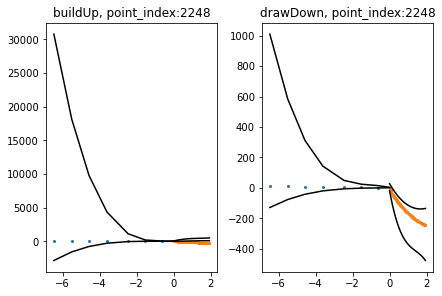

*****************=============
in buildUp pattern
-------------left
8 points for comparison, 0 points are above top, 0 points under bottom
-------------right
86 points for comparison, 0 points are above top, 80 points under bottom
-----------------criterion: False
sum(np.array(y_axis[0][0:-1])>=np.array(y_borders_left[1][0:-1])),len(y_axis[0][0:-1] 7 7
sum(np.array(y_axis[0][0:-1])<=np.array(y_borders_left[0][0:-1])),len(y_axis[0][0:-1]) 7 7
sum(np.array(y_axis[1][0:-1])>=np.array(y_borders_right[1][0:-1])),len(y_axis[1][0:-1]) 5 85
sum(np.array(y_axis[1][0:-1])<=np.array(y_borders_right[0][0:-1])),len(y_axis[1][0:-1]) 85 85
in drawDown pattern
-------------left
8 points for comparison, 0 points are above top, 1 points under bottom
-------------right
86 points for comparison, 0 points are above top, 0 points under bottom
-----------------criterion: True
sum(np.array(y_axis[0][0:-1])>=np.array(y_borders_left[1][0:-1])),len(y_axis[0][0:-1] 7 7
sum(np.array(y_axis[0][0:-1])<=np.array(y_bo

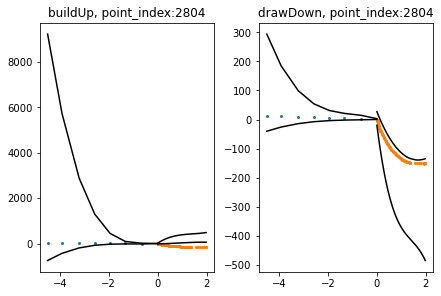

*****************=============
in buildUp pattern
-------------left
8 points for comparison, 0 points are above top, 0 points under bottom
-------------right
101 points for comparison, 0 points are above top, 94 points under bottom
-----------------criterion: False
sum(np.array(y_axis[0][0:-1])>=np.array(y_borders_left[1][0:-1])),len(y_axis[0][0:-1] 7 7
sum(np.array(y_axis[0][0:-1])<=np.array(y_borders_left[0][0:-1])),len(y_axis[0][0:-1]) 7 7
sum(np.array(y_axis[1][0:-1])>=np.array(y_borders_right[1][0:-1])),len(y_axis[1][0:-1]) 6 100
sum(np.array(y_axis[1][0:-1])<=np.array(y_borders_right[0][0:-1])),len(y_axis[1][0:-1]) 100 100
in drawDown pattern
-------------left
8 points for comparison, 0 points are above top, 1 points under bottom
-------------right
101 points for comparison, 0 points are above top, 0 points under bottom
-----------------criterion: True
sum(np.array(y_axis[0][0:-1])>=np.array(y_borders_left[1][0:-1])),len(y_axis[0][0:-1] 7 7
sum(np.array(y_axis[0][0:-1])<=np.array

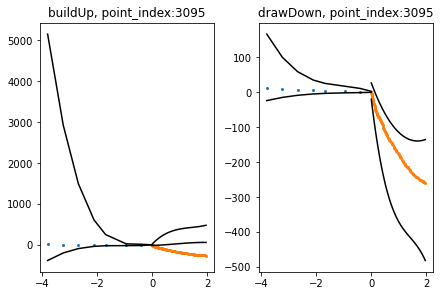

*****************=============
in buildUp pattern
-------------left
8 points for comparison, 0 points are above top, 0 points under bottom
-------------right
107 points for comparison, 0 points are above top, 97 points under bottom
-----------------criterion: False
sum(np.array(y_axis[0][0:-1])>=np.array(y_borders_left[1][0:-1])),len(y_axis[0][0:-1] 7 7
sum(np.array(y_axis[0][0:-1])<=np.array(y_borders_left[0][0:-1])),len(y_axis[0][0:-1]) 7 7
sum(np.array(y_axis[1][0:-1])>=np.array(y_borders_right[1][0:-1])),len(y_axis[1][0:-1]) 9 106
sum(np.array(y_axis[1][0:-1])<=np.array(y_borders_right[0][0:-1])),len(y_axis[1][0:-1]) 106 106
in drawDown pattern
-------------left
8 points for comparison, 0 points are above top, 1 points under bottom
-------------right
107 points for comparison, 0 points are above top, 0 points under bottom
-----------------criterion: True
sum(np.array(y_axis[0][0:-1])>=np.array(y_borders_left[1][0:-1])),len(y_axis[0][0:-1] 7 7
sum(np.array(y_axis[0][0:-1])<=np.array

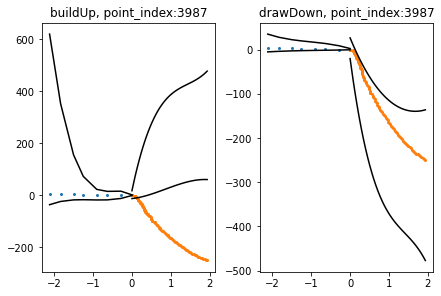

*****************=============
in buildUp pattern
-------------left
8 points for comparison, 0 points are above top, 0 points under bottom
-------------right
104 points for comparison, 0 points are above top, 96 points under bottom
-----------------criterion: False
sum(np.array(y_axis[0][0:-1])>=np.array(y_borders_left[1][0:-1])),len(y_axis[0][0:-1] 7 7
sum(np.array(y_axis[0][0:-1])<=np.array(y_borders_left[0][0:-1])),len(y_axis[0][0:-1]) 7 7
sum(np.array(y_axis[1][0:-1])>=np.array(y_borders_right[1][0:-1])),len(y_axis[1][0:-1]) 7 103
sum(np.array(y_axis[1][0:-1])<=np.array(y_borders_right[0][0:-1])),len(y_axis[1][0:-1]) 103 103
in drawDown pattern
-------------left
8 points for comparison, 0 points are above top, 1 points under bottom
-------------right
104 points for comparison, 0 points are above top, 0 points under bottom
-----------------criterion: True
sum(np.array(y_axis[0][0:-1])>=np.array(y_borders_left[1][0:-1])),len(y_axis[0][0:-1] 7 7
sum(np.array(y_axis[0][0:-1])<=np.array

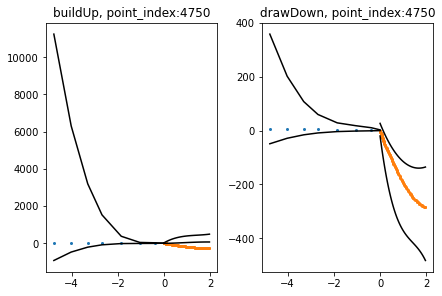

In [5]:
# buildUp_Detected=[buildUp for buildUp in identfication_UsePattern.breakpoints_forLearn['buildUp'] if buildUp not in buildup]
drawDown_Detectedin1=[drawDown for drawDown in identfication_UsePattern.breakpoints_forLearn['drawDown'] if drawDown in drawdown1]
print(len(drawDown_Detectedin1))
drawDown_Detectedin1_notIn2=[drawDown for drawDown in drawDown_Detectedin1 if drawDown not in drawdown2]
print(len(drawDown_Detectedin1_notIn2))

false=[1357, 1358, 1359, 1360, 1361, 1363, 1450, 1451, 1488, 1490]
false=[25358, 25382, 25384, 25407, 25425, 25453, 25455, 25456, 25467, 25499, 25501, 25503, 25505, 25506, 25523, 25524, 25540, 25543, 25547, 25582, 25587, 25594, 25601, 25602, 25603, 25606, 25610, 25615, 25617, 25619, 25621, 25622, 25624, 25677, 25679, 25680, 25681, 25682, 25685, 25687, 25702, 25703, 25704, 25705, 26350, 26351, 26352, 26354, 26355, 26357, 26358, 26363, 26368, 26382, 26397]
false=[25384, 25455, 25467, 25499, 25503, 25505, 25506, 25524, 25540, 25543, 25582, 25594, 25601, 25615, 25619, 25622, 25679, 25682, 25685, 25687, 25705, 26351, 26354, 26355, 26357, 26358, 26363, 26382, 26397]
false=[12038, 12137, 12339, 13038,10011, 10014, 10017,12339,13716, 13717,15330, 15331, 15334,25384, 25455, 25503, 25505, 25506, 25524, 25540, 25543, 25582, 25679, 25682, 25685, 25687, 25705, 26351, 26354, 26355, 26357, 26358, 26363, 26382, 26397,29669,29515]
false=[25453, 25455, 25540, 25543, 26397,29515, 29669]
false=[25455, 25488, 25540, 25543, 25594, 25601]
false=[25283, 25352, 25455, 25488, 25540, 25543, 25594, 25601,29650, 29669, 29717, 29772]

false=[2000]
false=drawDown_Detectedin1_notIn2
# false=drawdown2
for point_index in false:
    identfication_UsePattern.plot_data_forPredict(point_index)

len(buildUp_notDetected) 24
len(drawDown_notDetected) 26
in buildUp pattern
-------------left
8 points for comparison, 0 points are above top, 0 points under bottom
-------------right
23 points for comparison, 0 points are above top, 9 points under bottom
in drawDown pattern
-------------left
8 points for comparison, 0 points are above top, 1 points under bottom
-------------right
23 points for comparison, 16 points are above top, 0 points under bottom


c:\users\junec\appdata\local\programs\python\python38-32\lib\site-packages\IPython\core\pylabtools.py:134: UserWarning: This figure was using constrained_layout==True, but that is incompatible with subplots_adjust and or tight_layout: setting constrained_layout==False. 
  fig.canvas.print_figure(bytes_io, **kw)


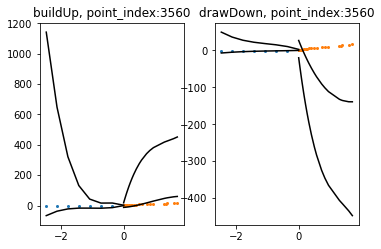

in buildUp pattern
-------------left
19 points for comparison, 0 points are above top, 0 points under bottom
-------------right
123 points for comparison, 0 points are above top, 0 points under bottom
in drawDown pattern
-------------left
19 points for comparison, 0 points are above top, 19 points under bottom
-------------right
123 points for comparison, 116 points are above top, 0 points under bottom


c:\users\junec\appdata\local\programs\python\python38-32\lib\site-packages\IPython\core\pylabtools.py:134: UserWarning: This figure was using constrained_layout==True, but that is incompatible with subplots_adjust and or tight_layout: setting constrained_layout==False. 
  fig.canvas.print_figure(bytes_io, **kw)


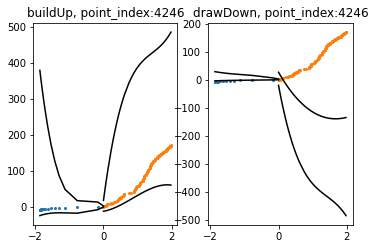

in buildUp pattern
-------------left
37 points for comparison, 0 points are above top, 0 points under bottom
-------------right
91 points for comparison, 0 points are above top, 16 points under bottom
in drawDown pattern
-------------left
37 points for comparison, 0 points are above top, 13 points under bottom
-------------right
91 points for comparison, 83 points are above top, 0 points under bottom


c:\users\junec\appdata\local\programs\python\python38-32\lib\site-packages\IPython\core\pylabtools.py:134: UserWarning: This figure was using constrained_layout==True, but that is incompatible with subplots_adjust and or tight_layout: setting constrained_layout==False. 
  fig.canvas.print_figure(bytes_io, **kw)


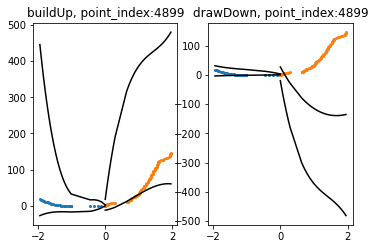

in buildUp pattern
-------------left
34 points for comparison, 0 points are above top, 0 points under bottom
-------------right
87 points for comparison, 0 points are above top, 19 points under bottom
in drawDown pattern
-------------left
34 points for comparison, 0 points are above top, 7 points under bottom
-------------right
87 points for comparison, 81 points are above top, 0 points under bottom


c:\users\junec\appdata\local\programs\python\python38-32\lib\site-packages\IPython\core\pylabtools.py:134: UserWarning: This figure was using constrained_layout==True, but that is incompatible with subplots_adjust and or tight_layout: setting constrained_layout==False. 
  fig.canvas.print_figure(bytes_io, **kw)


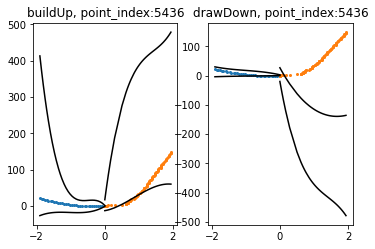

in buildUp pattern
-------------left
8 points for comparison, 0 points are above top, 0 points under bottom
-------------right
28 points for comparison, 0 points are above top, 12 points under bottom
in drawDown pattern
-------------left
8 points for comparison, 0 points are above top, 2 points under bottom
-------------right
28 points for comparison, 19 points are above top, 0 points under bottom


c:\users\junec\appdata\local\programs\python\python38-32\lib\site-packages\IPython\core\pylabtools.py:134: UserWarning: This figure was using constrained_layout==True, but that is incompatible with subplots_adjust and or tight_layout: setting constrained_layout==False. 
  fig.canvas.print_figure(bytes_io, **kw)


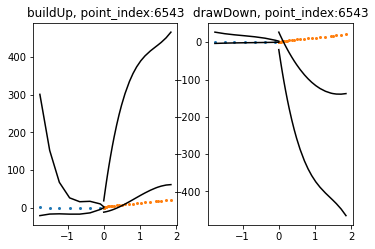

in buildUp pattern
-------------left
28 points for comparison, 0 points are above top, 0 points under bottom
-------------right
52 points for comparison, 0 points are above top, 0 points under bottom
in drawDown pattern
-------------left
28 points for comparison, 0 points are above top, 10 points under bottom
-------------right
52 points for comparison, 47 points are above top, 0 points under bottom


c:\users\junec\appdata\local\programs\python\python38-32\lib\site-packages\IPython\core\pylabtools.py:134: UserWarning: This figure was using constrained_layout==True, but that is incompatible with subplots_adjust and or tight_layout: setting constrained_layout==False. 
  fig.canvas.print_figure(bytes_io, **kw)


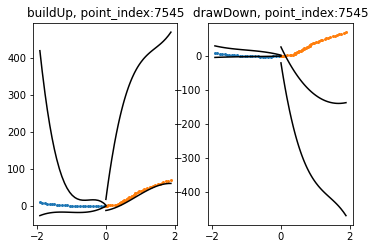

in buildUp pattern
-------------left
12 points for comparison, 0 points are above top, 0 points under bottom
-------------right
87 points for comparison, 0 points are above top, 0 points under bottom
in drawDown pattern
-------------left
12 points for comparison, 0 points are above top, 1 points under bottom
-------------right
87 points for comparison, 81 points are above top, 0 points under bottom


c:\users\junec\appdata\local\programs\python\python38-32\lib\site-packages\IPython\core\pylabtools.py:134: UserWarning: This figure was using constrained_layout==True, but that is incompatible with subplots_adjust and or tight_layout: setting constrained_layout==False. 
  fig.canvas.print_figure(bytes_io, **kw)


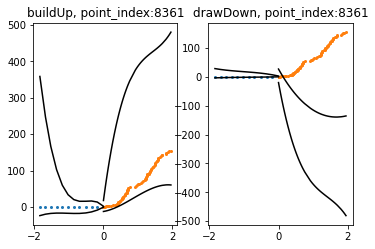

in buildUp pattern
-------------left
18 points for comparison, 0 points are above top, 2 points under bottom
-------------right
170 points for comparison, 0 points are above top, 0 points under bottom
in drawDown pattern
-------------left
18 points for comparison, 0 points are above top, 18 points under bottom
-------------right
170 points for comparison, 160 points are above top, 0 points under bottom


c:\users\junec\appdata\local\programs\python\python38-32\lib\site-packages\IPython\core\pylabtools.py:134: UserWarning: This figure was using constrained_layout==True, but that is incompatible with subplots_adjust and or tight_layout: setting constrained_layout==False. 
  fig.canvas.print_figure(bytes_io, **kw)


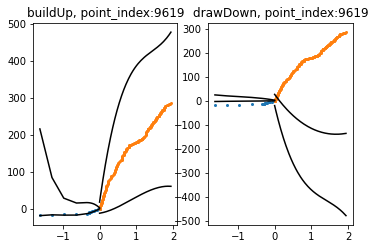

in buildUp pattern
-------------left
74 points for comparison, 0 points are above top, 0 points under bottom
-------------right
97 points for comparison, 0 points are above top, 0 points under bottom
in drawDown pattern
-------------left
74 points for comparison, 29 points are above top, 21 points under bottom
-------------right
97 points for comparison, 86 points are above top, 0 points under bottom


c:\users\junec\appdata\local\programs\python\python38-32\lib\site-packages\IPython\core\pylabtools.py:134: UserWarning: This figure was using constrained_layout==True, but that is incompatible with subplots_adjust and or tight_layout: setting constrained_layout==False. 
  fig.canvas.print_figure(bytes_io, **kw)


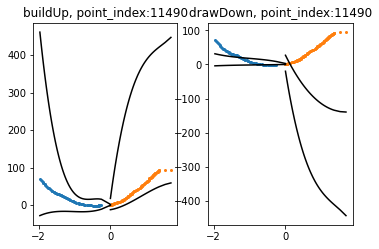

in buildUp pattern
-------------left
12 points for comparison, 0 points are above top, 1 points under bottom
-------------right
134 points for comparison, 0 points are above top, 0 points under bottom
in drawDown pattern
-------------left
12 points for comparison, 0 points are above top, 12 points under bottom
-------------right
134 points for comparison, 126 points are above top, 0 points under bottom


c:\users\junec\appdata\local\programs\python\python38-32\lib\site-packages\IPython\core\pylabtools.py:134: UserWarning: This figure was using constrained_layout==True, but that is incompatible with subplots_adjust and or tight_layout: setting constrained_layout==False. 
  fig.canvas.print_figure(bytes_io, **kw)


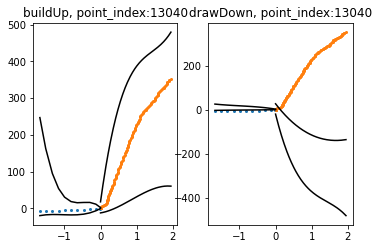

in buildUp pattern
-------------left
50 points for comparison, 0 points are above top, 0 points under bottom
-------------right
137 points for comparison, 0 points are above top, 0 points under bottom
in drawDown pattern
-------------left
50 points for comparison, 8 points are above top, 13 points under bottom
-------------right
137 points for comparison, 129 points are above top, 0 points under bottom


c:\users\junec\appdata\local\programs\python\python38-32\lib\site-packages\IPython\core\pylabtools.py:134: UserWarning: This figure was using constrained_layout==True, but that is incompatible with subplots_adjust and or tight_layout: setting constrained_layout==False. 
  fig.canvas.print_figure(bytes_io, **kw)


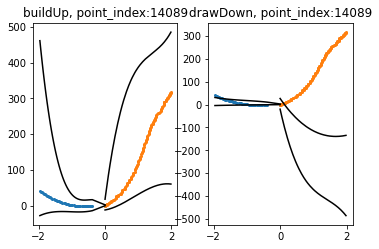

in buildUp pattern
-------------left
30 points for comparison, 0 points are above top, 0 points under bottom
-------------right
126 points for comparison, 0 points are above top, 0 points under bottom
in drawDown pattern
-------------left
30 points for comparison, 0 points are above top, 30 points under bottom
-------------right
126 points for comparison, 116 points are above top, 0 points under bottom


c:\users\junec\appdata\local\programs\python\python38-32\lib\site-packages\IPython\core\pylabtools.py:134: UserWarning: This figure was using constrained_layout==True, but that is incompatible with subplots_adjust and or tight_layout: setting constrained_layout==False. 
  fig.canvas.print_figure(bytes_io, **kw)


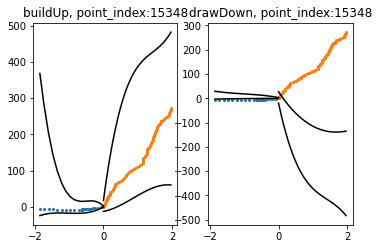

in buildUp pattern
-------------left
8 points for comparison, 0 points are above top, 0 points under bottom
-------------right
120 points for comparison, 0 points are above top, 0 points under bottom
in drawDown pattern
-------------left
8 points for comparison, 0 points are above top, 3 points under bottom
-------------right
120 points for comparison, 112 points are above top, 0 points under bottom


c:\users\junec\appdata\local\programs\python\python38-32\lib\site-packages\IPython\core\pylabtools.py:134: UserWarning: This figure was using constrained_layout==True, but that is incompatible with subplots_adjust and or tight_layout: setting constrained_layout==False. 
  fig.canvas.print_figure(bytes_io, **kw)


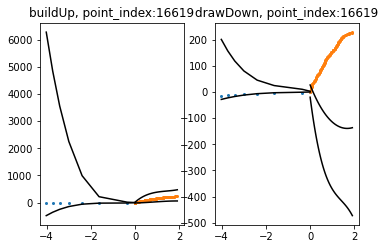

in buildUp pattern
-------------left
8 points for comparison, 0 points are above top, 0 points under bottom
-------------right
127 points for comparison, 0 points are above top, 0 points under bottom
in drawDown pattern
-------------left
8 points for comparison, 0 points are above top, 8 points under bottom
-------------right
127 points for comparison, 119 points are above top, 0 points under bottom


c:\users\junec\appdata\local\programs\python\python38-32\lib\site-packages\IPython\core\pylabtools.py:134: UserWarning: This figure was using constrained_layout==True, but that is incompatible with subplots_adjust and or tight_layout: setting constrained_layout==False. 
  fig.canvas.print_figure(bytes_io, **kw)


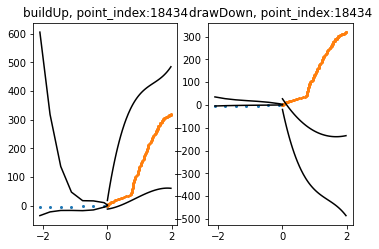

in buildUp pattern
-------------left
135 points for comparison, 0 points are above top, 0 points under bottom
-------------right
171 points for comparison, 0 points are above top, 0 points under bottom
in drawDown pattern
-------------left
135 points for comparison, 97 points are above top, 23 points under bottom
-------------right
171 points for comparison, 161 points are above top, 0 points under bottom


c:\users\junec\appdata\local\programs\python\python38-32\lib\site-packages\IPython\core\pylabtools.py:134: UserWarning: This figure was using constrained_layout==True, but that is incompatible with subplots_adjust and or tight_layout: setting constrained_layout==False. 
  fig.canvas.print_figure(bytes_io, **kw)


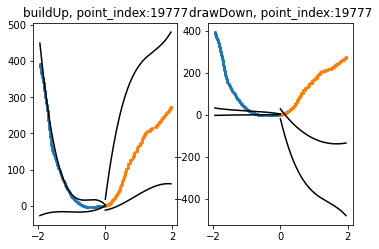

in buildUp pattern
-------------left
34 points for comparison, 0 points are above top, 28 points under bottom
-------------right
170 points for comparison, 0 points are above top, 0 points under bottom
in drawDown pattern
-------------left
34 points for comparison, 0 points are above top, 34 points under bottom
-------------right
170 points for comparison, 162 points are above top, 0 points under bottom


c:\users\junec\appdata\local\programs\python\python38-32\lib\site-packages\IPython\core\pylabtools.py:134: UserWarning: This figure was using constrained_layout==True, but that is incompatible with subplots_adjust and or tight_layout: setting constrained_layout==False. 
  fig.canvas.print_figure(bytes_io, **kw)


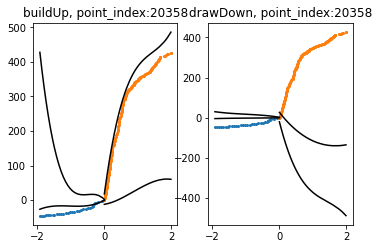

in buildUp pattern
-------------left
54 points for comparison, 0 points are above top, 0 points under bottom
-------------right
146 points for comparison, 0 points are above top, 0 points under bottom
in drawDown pattern
-------------left
54 points for comparison, 23 points are above top, 7 points under bottom
-------------right
146 points for comparison, 140 points are above top, 0 points under bottom


c:\users\junec\appdata\local\programs\python\python38-32\lib\site-packages\IPython\core\pylabtools.py:134: UserWarning: This figure was using constrained_layout==True, but that is incompatible with subplots_adjust and or tight_layout: setting constrained_layout==False. 
  fig.canvas.print_figure(bytes_io, **kw)


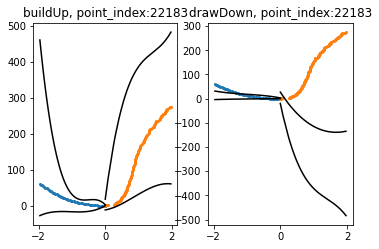

in buildUp pattern
-------------left
16 points for comparison, 0 points are above top, 0 points under bottom
-------------right
83 points for comparison, 0 points are above top, 10 points under bottom
in drawDown pattern
-------------left
16 points for comparison, 0 points are above top, 3 points under bottom
-------------right
83 points for comparison, 77 points are above top, 0 points under bottom


c:\users\junec\appdata\local\programs\python\python38-32\lib\site-packages\IPython\core\pylabtools.py:134: UserWarning: This figure was using constrained_layout==True, but that is incompatible with subplots_adjust and or tight_layout: setting constrained_layout==False. 
  fig.canvas.print_figure(bytes_io, **kw)


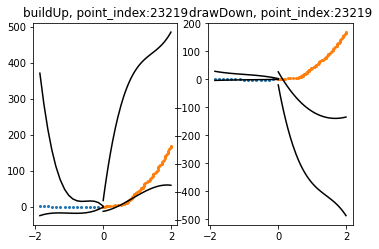

in buildUp pattern
-------------left
29 points for comparison, 3 points are above top, 0 points under bottom
-------------right
71 points for comparison, 0 points are above top, 0 points under bottom
in drawDown pattern
-------------left
29 points for comparison, 14 points are above top, 2 points under bottom
-------------right
71 points for comparison, 60 points are above top, 0 points under bottom


c:\users\junec\appdata\local\programs\python\python38-32\lib\site-packages\IPython\core\pylabtools.py:134: UserWarning: This figure was using constrained_layout==True, but that is incompatible with subplots_adjust and or tight_layout: setting constrained_layout==False. 
  fig.canvas.print_figure(bytes_io, **kw)


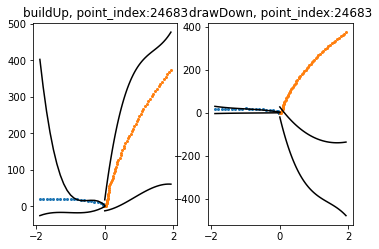

in buildUp pattern
-------------left
30 points for comparison, 0 points are above top, 26 points under bottom
-------------right
140 points for comparison, 0 points are above top, 0 points under bottom
in drawDown pattern
-------------left
30 points for comparison, 0 points are above top, 30 points under bottom
-------------right
140 points for comparison, 133 points are above top, 0 points under bottom


c:\users\junec\appdata\local\programs\python\python38-32\lib\site-packages\IPython\core\pylabtools.py:134: UserWarning: This figure was using constrained_layout==True, but that is incompatible with subplots_adjust and or tight_layout: setting constrained_layout==False. 
  fig.canvas.print_figure(bytes_io, **kw)


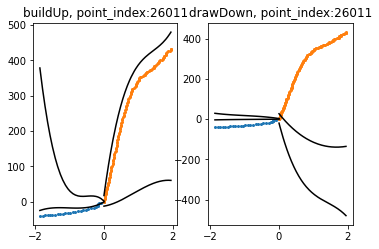

in buildUp pattern
-------------left
15 points for comparison, 0 points are above top, 0 points under bottom
-------------right
139 points for comparison, 0 points are above top, 0 points under bottom
in drawDown pattern
-------------left
15 points for comparison, 0 points are above top, 1 points under bottom
-------------right
139 points for comparison, 131 points are above top, 0 points under bottom


c:\users\junec\appdata\local\programs\python\python38-32\lib\site-packages\IPython\core\pylabtools.py:134: UserWarning: This figure was using constrained_layout==True, but that is incompatible with subplots_adjust and or tight_layout: setting constrained_layout==False. 
  fig.canvas.print_figure(bytes_io, **kw)


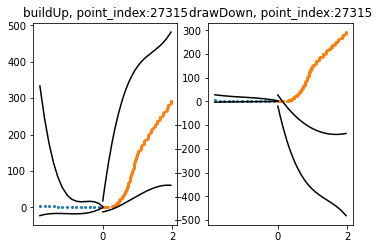

in buildUp pattern
-------------left
29 points for comparison, 0 points are above top, 0 points under bottom
-------------right
161 points for comparison, 0 points are above top, 0 points under bottom
in drawDown pattern
-------------left
29 points for comparison, 0 points are above top, 12 points under bottom
-------------right
161 points for comparison, 148 points are above top, 0 points under bottom


c:\users\junec\appdata\local\programs\python\python38-32\lib\site-packages\IPython\core\pylabtools.py:134: UserWarning: This figure was using constrained_layout==True, but that is incompatible with subplots_adjust and or tight_layout: setting constrained_layout==False. 
  fig.canvas.print_figure(bytes_io, **kw)


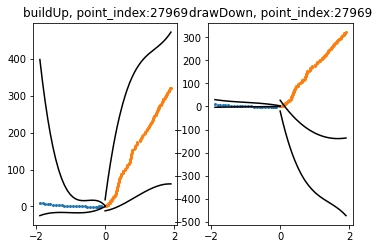

in buildUp pattern
-------------left
27 points for comparison, 0 points are above top, 0 points under bottom
-------------right
148 points for comparison, 0 points are above top, 0 points under bottom
in drawDown pattern
-------------left
27 points for comparison, 0 points are above top, 10 points under bottom
-------------right
148 points for comparison, 137 points are above top, 0 points under bottom


c:\users\junec\appdata\local\programs\python\python38-32\lib\site-packages\IPython\core\pylabtools.py:134: UserWarning: This figure was using constrained_layout==True, but that is incompatible with subplots_adjust and or tight_layout: setting constrained_layout==False. 
  fig.canvas.print_figure(bytes_io, **kw)


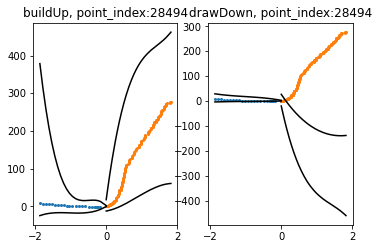

in buildUp pattern
-------------left
19 points for comparison, 0 points are above top, 1 points under bottom
-------------right
126 points for comparison, 0 points are above top, 0 points under bottom
in drawDown pattern
-------------left
19 points for comparison, 0 points are above top, 19 points under bottom
-------------right
126 points for comparison, 120 points are above top, 0 points under bottom


c:\users\junec\appdata\local\programs\python\python38-32\lib\site-packages\IPython\core\pylabtools.py:134: UserWarning: This figure was using constrained_layout==True, but that is incompatible with subplots_adjust and or tight_layout: setting constrained_layout==False. 
  fig.canvas.print_figure(bytes_io, **kw)


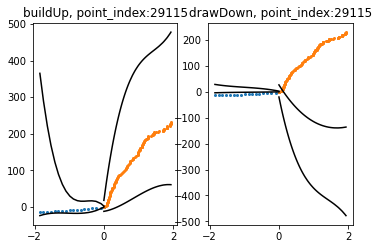

in buildUp pattern
-------------left
8 points for comparison, 0 points are above top, 0 points under bottom
-------------right
101 points for comparison, 0 points are above top, 94 points under bottom
in drawDown pattern
-------------left
8 points for comparison, 0 points are above top, 1 points under bottom
-------------right
101 points for comparison, 0 points are above top, 0 points under bottom


c:\users\junec\appdata\local\programs\python\python38-32\lib\site-packages\IPython\core\pylabtools.py:134: UserWarning: This figure was using constrained_layout==True, but that is incompatible with subplots_adjust and or tight_layout: setting constrained_layout==False. 
  fig.canvas.print_figure(bytes_io, **kw)


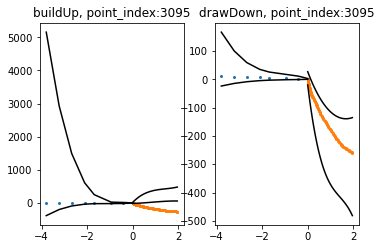

in buildUp pattern
-------------left
8 points for comparison, 0 points are above top, 0 points under bottom
-------------right
107 points for comparison, 0 points are above top, 97 points under bottom
in drawDown pattern
-------------left
8 points for comparison, 0 points are above top, 1 points under bottom
-------------right
107 points for comparison, 0 points are above top, 0 points under bottom


c:\users\junec\appdata\local\programs\python\python38-32\lib\site-packages\IPython\core\pylabtools.py:134: UserWarning: This figure was using constrained_layout==True, but that is incompatible with subplots_adjust and or tight_layout: setting constrained_layout==False. 
  fig.canvas.print_figure(bytes_io, **kw)


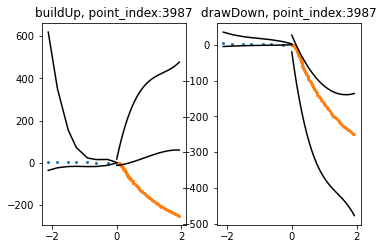

in buildUp pattern
-------------left
8 points for comparison, 0 points are above top, 0 points under bottom
-------------right
104 points for comparison, 0 points are above top, 96 points under bottom
in drawDown pattern
-------------left
8 points for comparison, 0 points are above top, 1 points under bottom
-------------right
104 points for comparison, 0 points are above top, 0 points under bottom


c:\users\junec\appdata\local\programs\python\python38-32\lib\site-packages\IPython\core\pylabtools.py:134: UserWarning: This figure was using constrained_layout==True, but that is incompatible with subplots_adjust and or tight_layout: setting constrained_layout==False. 
  fig.canvas.print_figure(bytes_io, **kw)


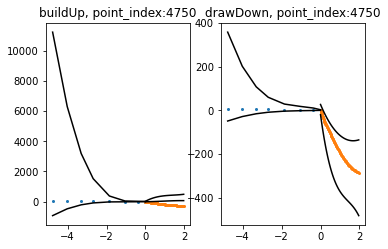

in buildUp pattern
-------------left
8 points for comparison, 0 points are above top, 0 points under bottom
-------------right
56 points for comparison, 0 points are above top, 53 points under bottom
in drawDown pattern
-------------left
8 points for comparison, 0 points are above top, 1 points under bottom
-------------right
56 points for comparison, 0 points are above top, 0 points under bottom


c:\users\junec\appdata\local\programs\python\python38-32\lib\site-packages\IPython\core\pylabtools.py:134: UserWarning: This figure was using constrained_layout==True, but that is incompatible with subplots_adjust and or tight_layout: setting constrained_layout==False. 
  fig.canvas.print_figure(bytes_io, **kw)


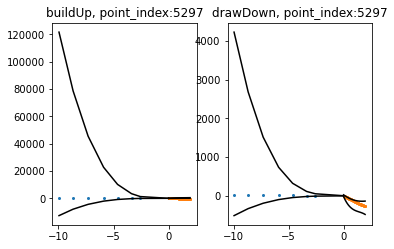

in buildUp pattern
-------------left
8 points for comparison, 0 points are above top, 0 points under bottom
-------------right
126 points for comparison, 0 points are above top, 118 points under bottom
in drawDown pattern
-------------left
8 points for comparison, 0 points are above top, 1 points under bottom
-------------right
126 points for comparison, 0 points are above top, 0 points under bottom


c:\users\junec\appdata\local\programs\python\python38-32\lib\site-packages\IPython\core\pylabtools.py:134: UserWarning: This figure was using constrained_layout==True, but that is incompatible with subplots_adjust and or tight_layout: setting constrained_layout==False. 
  fig.canvas.print_figure(bytes_io, **kw)


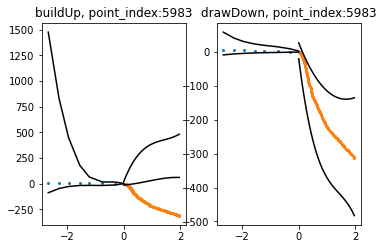

in buildUp pattern
-------------left
9 points for comparison, 0 points are above top, 0 points under bottom
-------------right
119 points for comparison, 0 points are above top, 109 points under bottom
in drawDown pattern
-------------left
9 points for comparison, 0 points are above top, 1 points under bottom
-------------right
119 points for comparison, 0 points are above top, 0 points under bottom


c:\users\junec\appdata\local\programs\python\python38-32\lib\site-packages\IPython\core\pylabtools.py:134: UserWarning: This figure was using constrained_layout==True, but that is incompatible with subplots_adjust and or tight_layout: setting constrained_layout==False. 
  fig.canvas.print_figure(bytes_io, **kw)


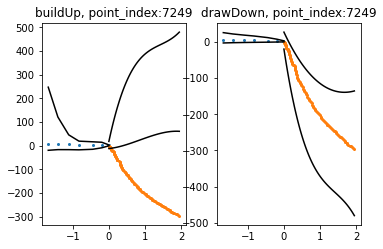

in buildUp pattern
-------------left
8 points for comparison, 0 points are above top, 0 points under bottom
-------------right
118 points for comparison, 0 points are above top, 107 points under bottom
in drawDown pattern
-------------left
8 points for comparison, 0 points are above top, 1 points under bottom
-------------right
118 points for comparison, 0 points are above top, 0 points under bottom


c:\users\junec\appdata\local\programs\python\python38-32\lib\site-packages\IPython\core\pylabtools.py:134: UserWarning: This figure was using constrained_layout==True, but that is incompatible with subplots_adjust and or tight_layout: setting constrained_layout==False. 
  fig.canvas.print_figure(bytes_io, **kw)


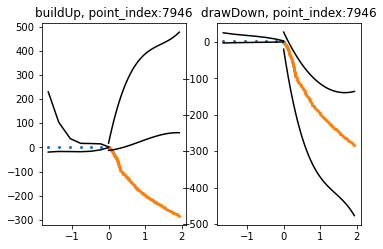

in buildUp pattern
-------------left
10 points for comparison, 0 points are above top, 0 points under bottom
-------------right
83 points for comparison, 0 points are above top, 75 points under bottom
in drawDown pattern
-------------left
10 points for comparison, 0 points are above top, 1 points under bottom
-------------right
83 points for comparison, 48 points are above top, 0 points under bottom


c:\users\junec\appdata\local\programs\python\python38-32\lib\site-packages\IPython\core\pylabtools.py:134: UserWarning: This figure was using constrained_layout==True, but that is incompatible with subplots_adjust and or tight_layout: setting constrained_layout==False. 
  fig.canvas.print_figure(bytes_io, **kw)


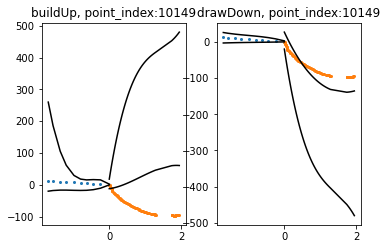

in buildUp pattern
-------------left
8 points for comparison, 0 points are above top, 0 points under bottom
-------------right
112 points for comparison, 0 points are above top, 105 points under bottom
in drawDown pattern
-------------left
8 points for comparison, 0 points are above top, 1 points under bottom
-------------right
112 points for comparison, 0 points are above top, 0 points under bottom


c:\users\junec\appdata\local\programs\python\python38-32\lib\site-packages\IPython\core\pylabtools.py:134: UserWarning: This figure was using constrained_layout==True, but that is incompatible with subplots_adjust and or tight_layout: setting constrained_layout==False. 
  fig.canvas.print_figure(bytes_io, **kw)


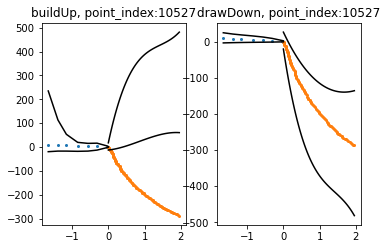

in buildUp pattern
-------------left
15 points for comparison, 0 points are above top, 0 points under bottom
-------------right
117 points for comparison, 0 points are above top, 111 points under bottom
in drawDown pattern
-------------left
15 points for comparison, 0 points are above top, 1 points under bottom
-------------right
117 points for comparison, 0 points are above top, 0 points under bottom


c:\users\junec\appdata\local\programs\python\python38-32\lib\site-packages\IPython\core\pylabtools.py:134: UserWarning: This figure was using constrained_layout==True, but that is incompatible with subplots_adjust and or tight_layout: setting constrained_layout==False. 
  fig.canvas.print_figure(bytes_io, **kw)


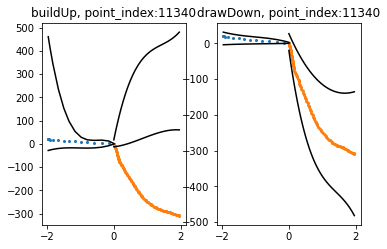

in buildUp pattern
-------------left
8 points for comparison, 0 points are above top, 0 points under bottom
-------------right
128 points for comparison, 0 points are above top, 124 points under bottom
in drawDown pattern
-------------left
8 points for comparison, 0 points are above top, 1 points under bottom
-------------right
128 points for comparison, 0 points are above top, 0 points under bottom


c:\users\junec\appdata\local\programs\python\python38-32\lib\site-packages\IPython\core\pylabtools.py:134: UserWarning: This figure was using constrained_layout==True, but that is incompatible with subplots_adjust and or tight_layout: setting constrained_layout==False. 
  fig.canvas.print_figure(bytes_io, **kw)


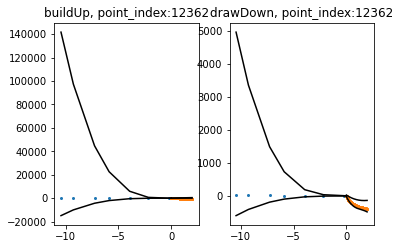

in buildUp pattern
-------------left
8 points for comparison, 0 points are above top, 0 points under bottom
-------------right
136 points for comparison, 0 points are above top, 131 points under bottom
in drawDown pattern
-------------left
8 points for comparison, 0 points are above top, 1 points under bottom
-------------right
136 points for comparison, 0 points are above top, 0 points under bottom


c:\users\junec\appdata\local\programs\python\python38-32\lib\site-packages\IPython\core\pylabtools.py:134: UserWarning: This figure was using constrained_layout==True, but that is incompatible with subplots_adjust and or tight_layout: setting constrained_layout==False. 
  fig.canvas.print_figure(bytes_io, **kw)


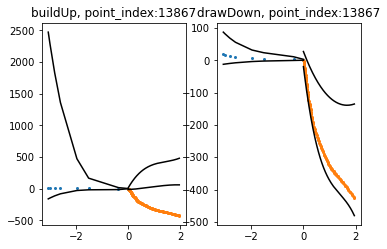

in buildUp pattern
-------------left
8 points for comparison, 0 points are above top, 0 points under bottom
-------------right
121 points for comparison, 0 points are above top, 115 points under bottom
in drawDown pattern
-------------left
8 points for comparison, 0 points are above top, 1 points under bottom
-------------right
121 points for comparison, 14 points are above top, 0 points under bottom


c:\users\junec\appdata\local\programs\python\python38-32\lib\site-packages\IPython\core\pylabtools.py:134: UserWarning: This figure was using constrained_layout==True, but that is incompatible with subplots_adjust and or tight_layout: setting constrained_layout==False. 
  fig.canvas.print_figure(bytes_io, **kw)


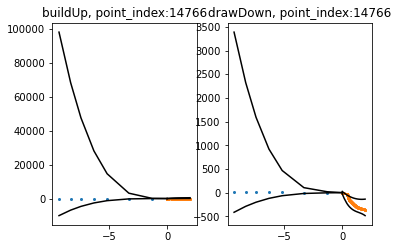

in buildUp pattern
-------------left
13 points for comparison, 4 points are above top, 0 points under bottom
-------------right
121 points for comparison, 0 points are above top, 117 points under bottom
in drawDown pattern
-------------left
13 points for comparison, 12 points are above top, 1 points under bottom
-------------right
121 points for comparison, 0 points are above top, 0 points under bottom


c:\users\junec\appdata\local\programs\python\python38-32\lib\site-packages\IPython\core\pylabtools.py:134: UserWarning: This figure was using constrained_layout==True, but that is incompatible with subplots_adjust and or tight_layout: setting constrained_layout==False. 
  fig.canvas.print_figure(bytes_io, **kw)


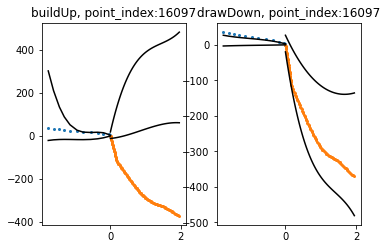

in buildUp pattern
-------------left
8 points for comparison, 0 points are above top, 0 points under bottom
-------------right
142 points for comparison, 0 points are above top, 137 points under bottom
in drawDown pattern
-------------left
8 points for comparison, 0 points are above top, 1 points under bottom
-------------right
142 points for comparison, 0 points are above top, 0 points under bottom


c:\users\junec\appdata\local\programs\python\python38-32\lib\site-packages\IPython\core\pylabtools.py:134: UserWarning: This figure was using constrained_layout==True, but that is incompatible with subplots_adjust and or tight_layout: setting constrained_layout==False. 
  fig.canvas.print_figure(bytes_io, **kw)


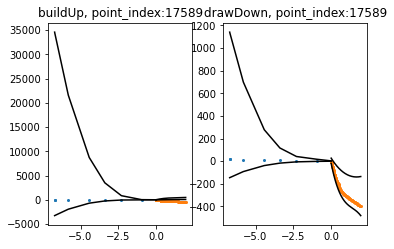

in buildUp pattern
-------------left
8 points for comparison, 0 points are above top, 0 points under bottom
-------------right
139 points for comparison, 0 points are above top, 134 points under bottom
in drawDown pattern
-------------left
8 points for comparison, 0 points are above top, 1 points under bottom
-------------right
139 points for comparison, 0 points are above top, 56 points under bottom


c:\users\junec\appdata\local\programs\python\python38-32\lib\site-packages\IPython\core\pylabtools.py:134: UserWarning: This figure was using constrained_layout==True, but that is incompatible with subplots_adjust and or tight_layout: setting constrained_layout==False. 
  fig.canvas.print_figure(bytes_io, **kw)


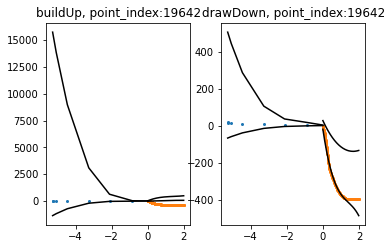

in buildUp pattern
-------------left
13 points for comparison, 0 points are above top, 0 points under bottom
-------------right
132 points for comparison, 0 points are above top, 127 points under bottom
in drawDown pattern
-------------left
13 points for comparison, 1 points are above top, 1 points under bottom
-------------right
132 points for comparison, 0 points are above top, 0 points under bottom


c:\users\junec\appdata\local\programs\python\python38-32\lib\site-packages\IPython\core\pylabtools.py:134: UserWarning: This figure was using constrained_layout==True, but that is incompatible with subplots_adjust and or tight_layout: setting constrained_layout==False. 
  fig.canvas.print_figure(bytes_io, **kw)


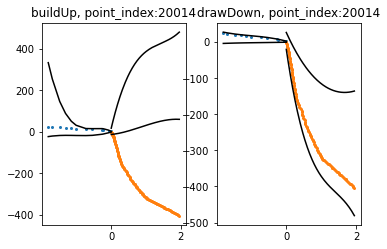

in buildUp pattern
-------------left
8 points for comparison, 0 points are above top, 0 points under bottom
-------------right
124 points for comparison, 0 points are above top, 119 points under bottom
in drawDown pattern
-------------left
8 points for comparison, 0 points are above top, 1 points under bottom
-------------right
124 points for comparison, 0 points are above top, 0 points under bottom


c:\users\junec\appdata\local\programs\python\python38-32\lib\site-packages\IPython\core\pylabtools.py:134: UserWarning: This figure was using constrained_layout==True, but that is incompatible with subplots_adjust and or tight_layout: setting constrained_layout==False. 
  fig.canvas.print_figure(bytes_io, **kw)


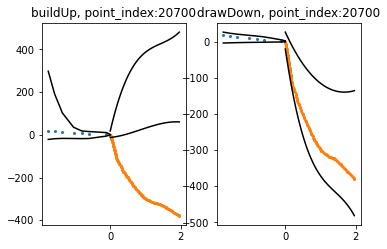

in buildUp pattern
-------------left
8 points for comparison, 0 points are above top, 0 points under bottom
-------------right
124 points for comparison, 0 points are above top, 120 points under bottom
in drawDown pattern
-------------left
8 points for comparison, 0 points are above top, 1 points under bottom
-------------right
124 points for comparison, 0 points are above top, 6 points under bottom


c:\users\junec\appdata\local\programs\python\python38-32\lib\site-packages\IPython\core\pylabtools.py:134: UserWarning: This figure was using constrained_layout==True, but that is incompatible with subplots_adjust and or tight_layout: setting constrained_layout==False. 
  fig.canvas.print_figure(bytes_io, **kw)


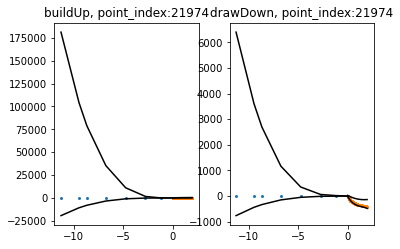

in buildUp pattern
-------------left
8 points for comparison, 0 points are above top, 0 points under bottom
-------------right
114 points for comparison, 0 points are above top, 110 points under bottom
in drawDown pattern
-------------left
8 points for comparison, 0 points are above top, 1 points under bottom
-------------right
114 points for comparison, 0 points are above top, 0 points under bottom


c:\users\junec\appdata\local\programs\python\python38-32\lib\site-packages\IPython\core\pylabtools.py:134: UserWarning: This figure was using constrained_layout==True, but that is incompatible with subplots_adjust and or tight_layout: setting constrained_layout==False. 
  fig.canvas.print_figure(bytes_io, **kw)


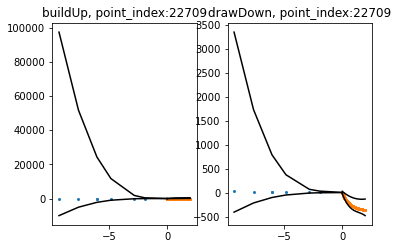

in buildUp pattern
-------------left
8 points for comparison, 0 points are above top, 0 points under bottom
-------------right
113 points for comparison, 0 points are above top, 108 points under bottom
in drawDown pattern
-------------left
8 points for comparison, 0 points are above top, 1 points under bottom
-------------right
113 points for comparison, 0 points are above top, 0 points under bottom


c:\users\junec\appdata\local\programs\python\python38-32\lib\site-packages\IPython\core\pylabtools.py:134: UserWarning: This figure was using constrained_layout==True, but that is incompatible with subplots_adjust and or tight_layout: setting constrained_layout==False. 
  fig.canvas.print_figure(bytes_io, **kw)


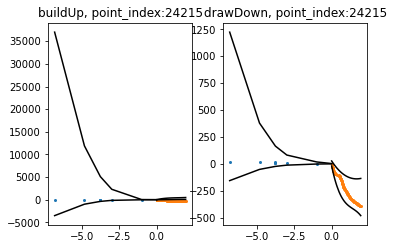

in buildUp pattern
-------------left
8 points for comparison, 0 points are above top, 0 points under bottom
-------------right
10 points for comparison, 0 points are above top, 4 points under bottom
in drawDown pattern
-------------left
8 points for comparison, 0 points are above top, 1 points under bottom
-------------right
10 points for comparison, 5 points are above top, 0 points under bottom


c:\users\junec\appdata\local\programs\python\python38-32\lib\site-packages\IPython\core\pylabtools.py:134: UserWarning: This figure was using constrained_layout==True, but that is incompatible with subplots_adjust and or tight_layout: setting constrained_layout==False. 
  fig.canvas.print_figure(bytes_io, **kw)


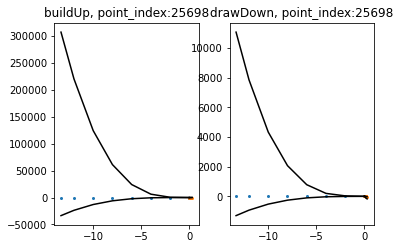

in buildUp pattern
-------------left
8 points for comparison, 1 points are above top, 0 points under bottom
-------------right
75 points for comparison, 0 points are above top, 70 points under bottom
in drawDown pattern
-------------left
8 points for comparison, 0 points are above top, 1 points under bottom
-------------right
75 points for comparison, 5 points are above top, 0 points under bottom


c:\users\junec\appdata\local\programs\python\python38-32\lib\site-packages\IPython\core\pylabtools.py:134: UserWarning: This figure was using constrained_layout==True, but that is incompatible with subplots_adjust and or tight_layout: setting constrained_layout==False. 
  fig.canvas.print_figure(bytes_io, **kw)


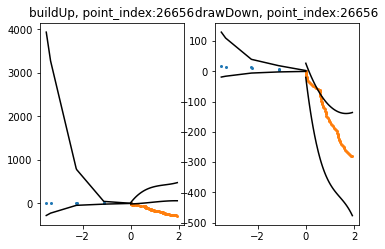

in buildUp pattern
-------------left
8 points for comparison, 0 points are above top, 0 points under bottom
-------------right
91 points for comparison, 0 points are above top, 86 points under bottom
in drawDown pattern
-------------left
8 points for comparison, 0 points are above top, 1 points under bottom
-------------right
91 points for comparison, 0 points are above top, 0 points under bottom


c:\users\junec\appdata\local\programs\python\python38-32\lib\site-packages\IPython\core\pylabtools.py:134: UserWarning: This figure was using constrained_layout==True, but that is incompatible with subplots_adjust and or tight_layout: setting constrained_layout==False. 
  fig.canvas.print_figure(bytes_io, **kw)


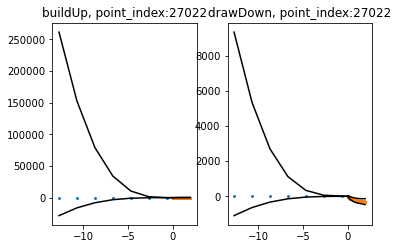

in buildUp pattern
-------------left
8 points for comparison, 0 points are above top, 0 points under bottom
-------------right
114 points for comparison, 0 points are above top, 108 points under bottom
in drawDown pattern
-------------left
8 points for comparison, 1 points are above top, 1 points under bottom
-------------right
114 points for comparison, 0 points are above top, 0 points under bottom


c:\users\junec\appdata\local\programs\python\python38-32\lib\site-packages\IPython\core\pylabtools.py:134: UserWarning: This figure was using constrained_layout==True, but that is incompatible with subplots_adjust and or tight_layout: setting constrained_layout==False. 
  fig.canvas.print_figure(bytes_io, **kw)


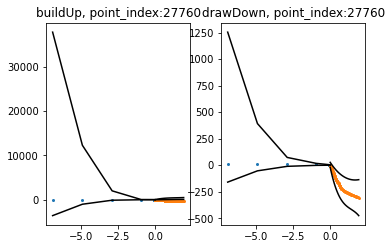

in buildUp pattern
-------------left
8 points for comparison, 0 points are above top, 0 points under bottom
-------------right
141 points for comparison, 0 points are above top, 131 points under bottom
in drawDown pattern
-------------left
8 points for comparison, 0 points are above top, 1 points under bottom
-------------right
141 points for comparison, 0 points are above top, 0 points under bottom


c:\users\junec\appdata\local\programs\python\python38-32\lib\site-packages\IPython\core\pylabtools.py:134: UserWarning: This figure was using constrained_layout==True, but that is incompatible with subplots_adjust and or tight_layout: setting constrained_layout==False. 
  fig.canvas.print_figure(bytes_io, **kw)


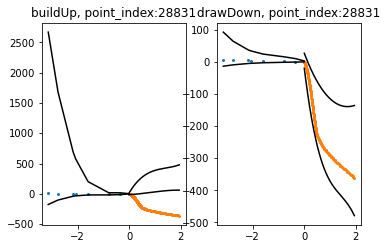

In [16]:
buildUp_notDetected=[buildUp for buildUp in identfication_UsePattern.breakpoints_forLearn['buildUp'] if buildUp not in buildup]
print("len(buildUp_notDetected)",len(buildUp_notDetected))

drawDown_notDetected=[drawDown for drawDown in identfication_UsePattern.breakpoints_forLearn['drawDown'] if drawDown not in drawdown]
print("len(drawDown_notDetected)",len(drawDown_notDetected))

for point_index in buildUp_notDetected:
    identfication_UsePattern.plot_data_forPredict(point_index)
print("================================")   

for point_index in drawDown_notDetected:
    identfication_UsePattern.plot_data_forPredict(point_index)


### plot detected points

---initializing...
---plotting...


findfont: Font family ['Arial Black'] not found. Falling back to DejaVu Sans.


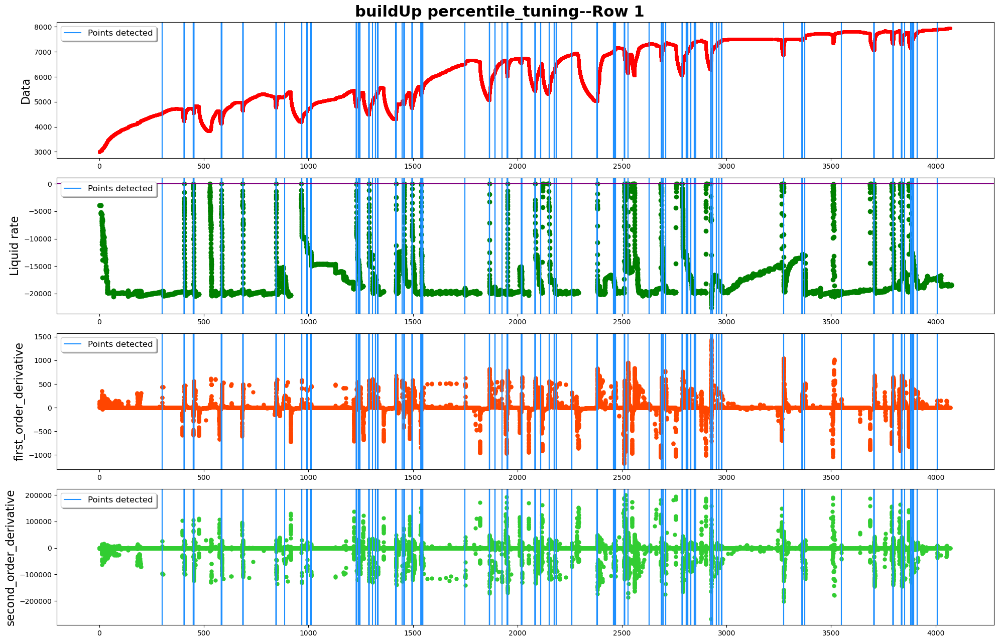

detected 713 points as breakpoints
The plot is devided into 25 rows
------row 1-----detected points:[]


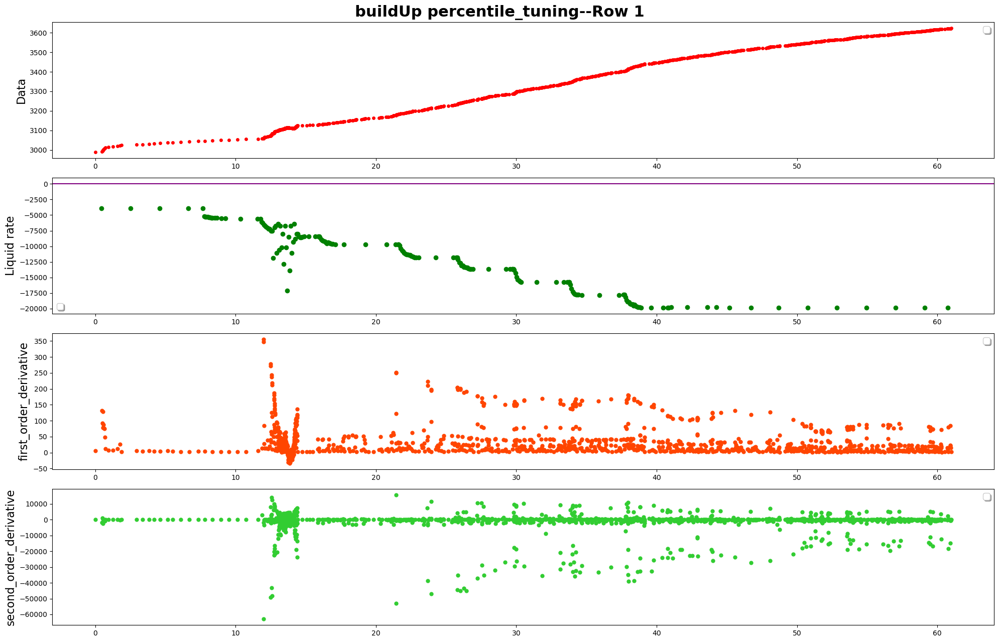

------row 2-----detected points:[2111, 2112]


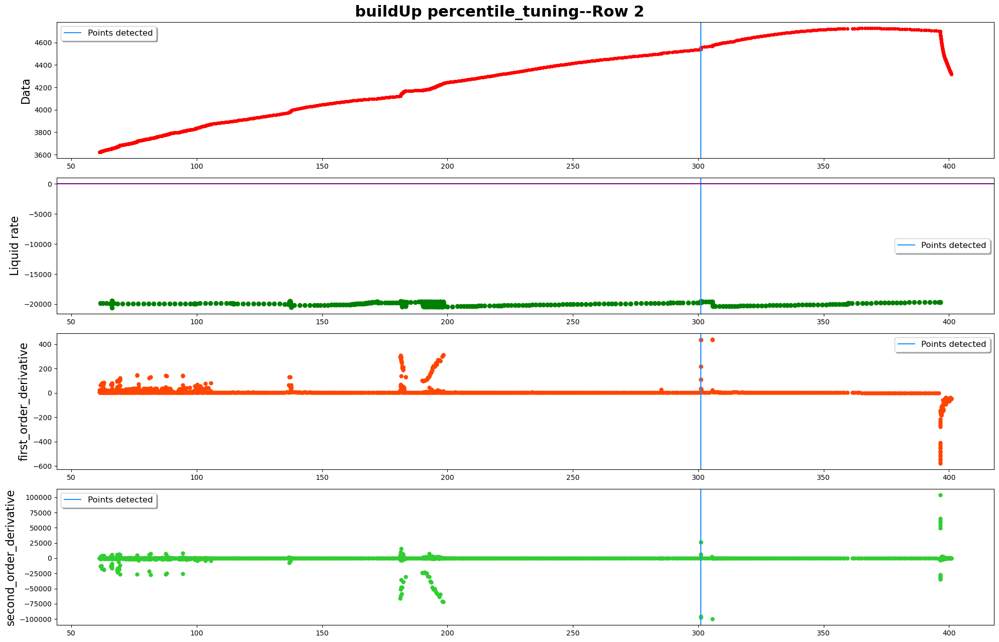

------row 3-----detected points:[2475, 2476, 2477, 2478, 2479, 2480, 2481, 2482, 2483, 2484, 2485, 2486, 2487, 2488, 2489, 2490, 2491, 2492, 2493, 2882, 2883, 2884, 2885, 2886, 2887, 2888, 2889, 2890, 2891, 2892, 2893, 2894, 2895, 2896, 2897, 2898, 2899, 2900, 2901]


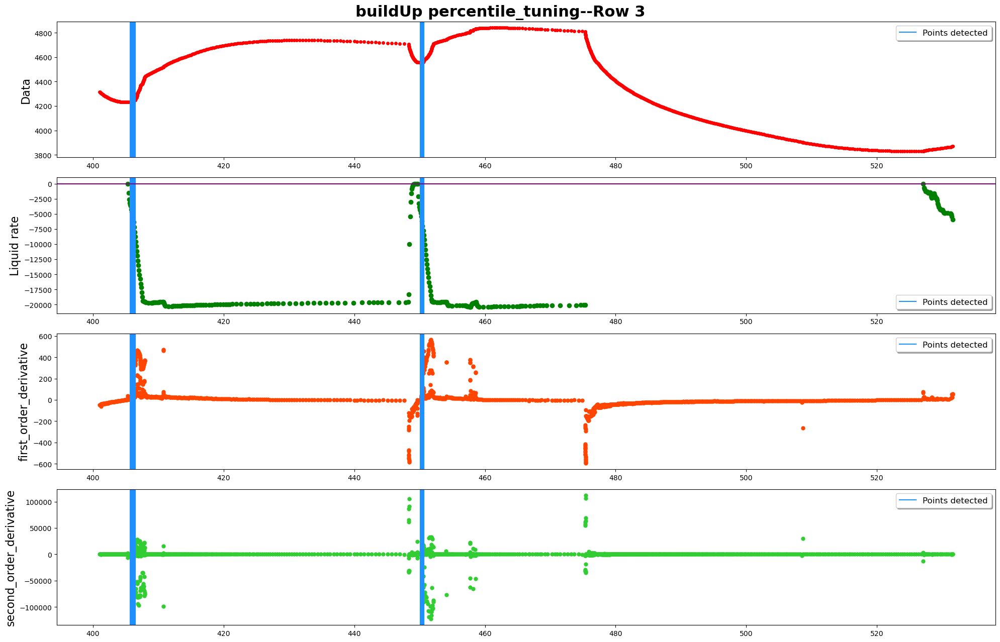

------row 4-----detected points:[4245, 4246, 4247, 4248, 4249, 4250, 4251, 4252, 4253, 4255, 4256, 4257, 4258, 4259, 4260]


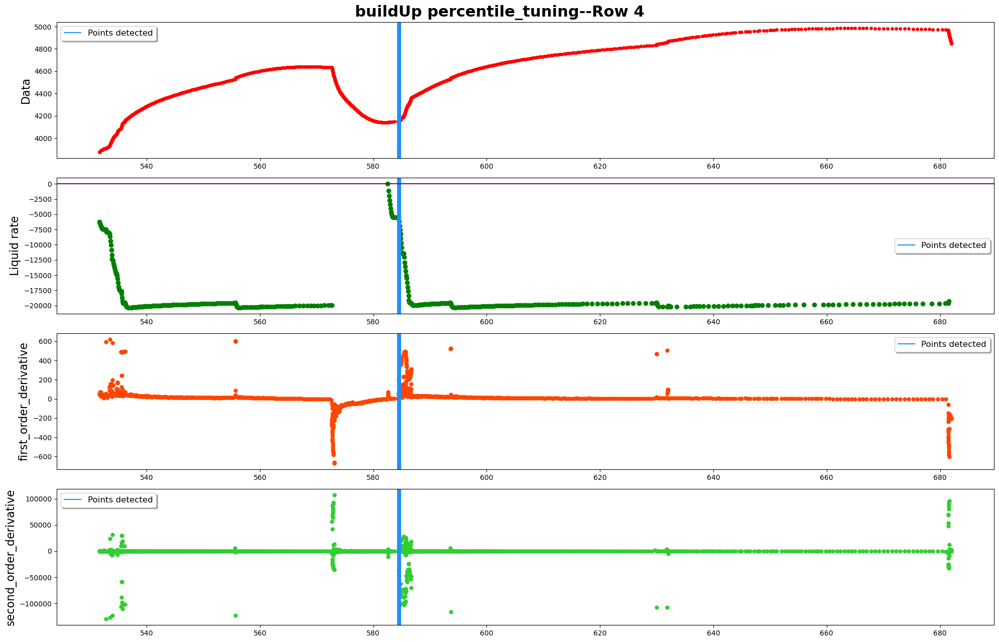

------row 5-----detected points:[4899, 4901, 4902, 4906, 4907, 4908, 4909, 4910, 4911, 4912, 4913, 4914, 4915, 4916, 4917, 4918, 5440, 5441, 5442, 5443, 5444, 5445, 5446, 5447, 5448, 5449, 5450, 5451, 5452, 5453, 5454, 5833]


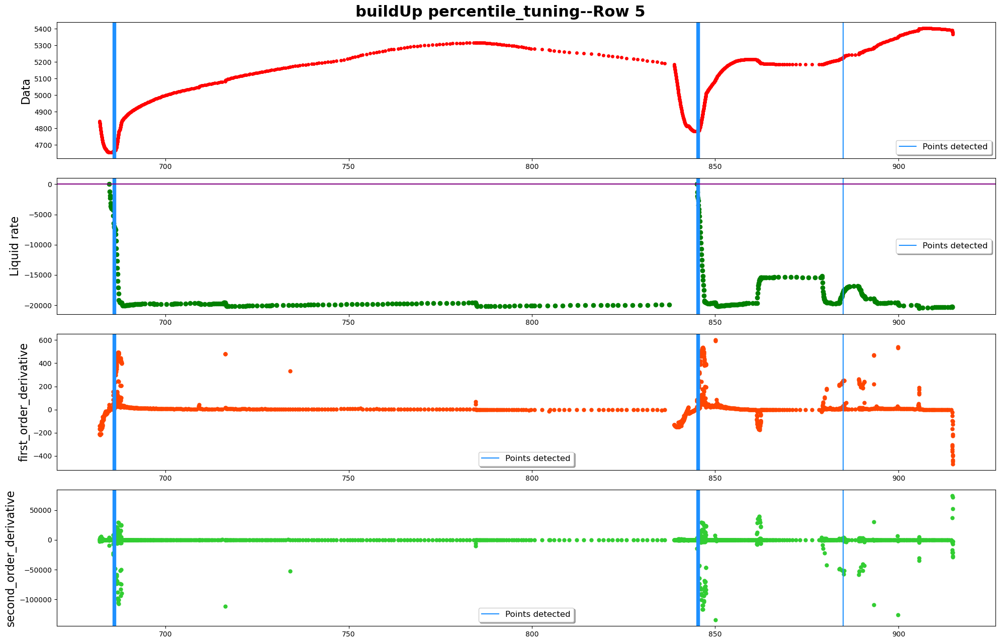

------row 6-----detected points:[6571, 6572, 6573, 6574, 6575, 6769, 6770, 6771, 6772, 6773, 6865, 6866, 6868, 6869]


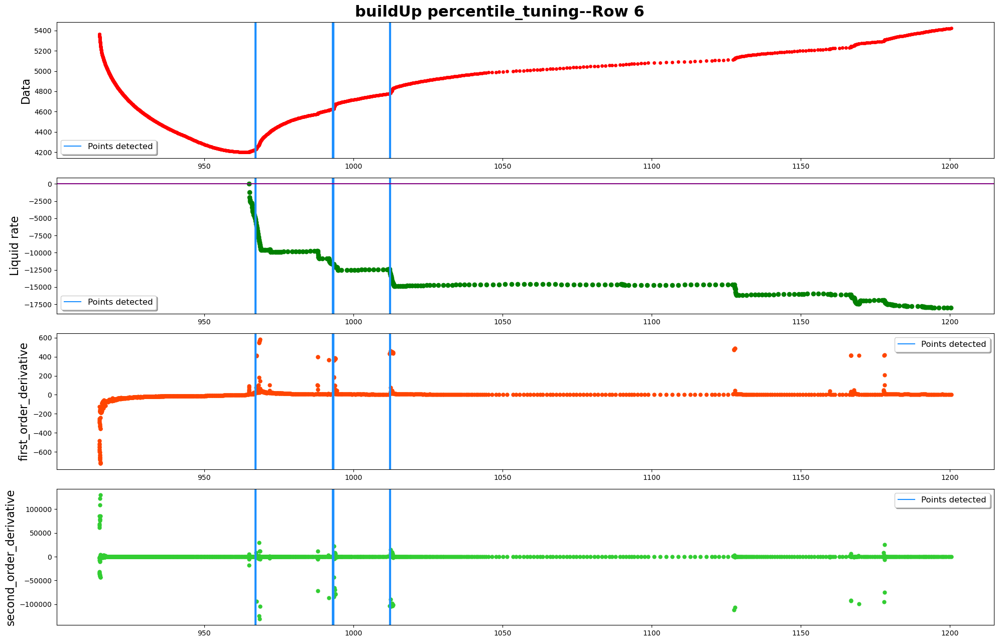

------row 7-----detected points:[7542, 7543, 7544, 7545, 7546, 7547, 7548, 7549, 7550, 7551, 7552, 7553, 7554, 7555, 7556, 7557, 7558, 7559, 7560, 7561, 7562, 7681, 7682, 7683, 7684, 7713, 7714, 7715, 7716, 7719, 7814, 7815, 7816, 7817, 8360, 8361, 8362, 8363, 8364, 8365, 8366, 8367, 8368, 8369, 8370, 8371, 8372, 8373, 8374, 8375, 8376, 8377]


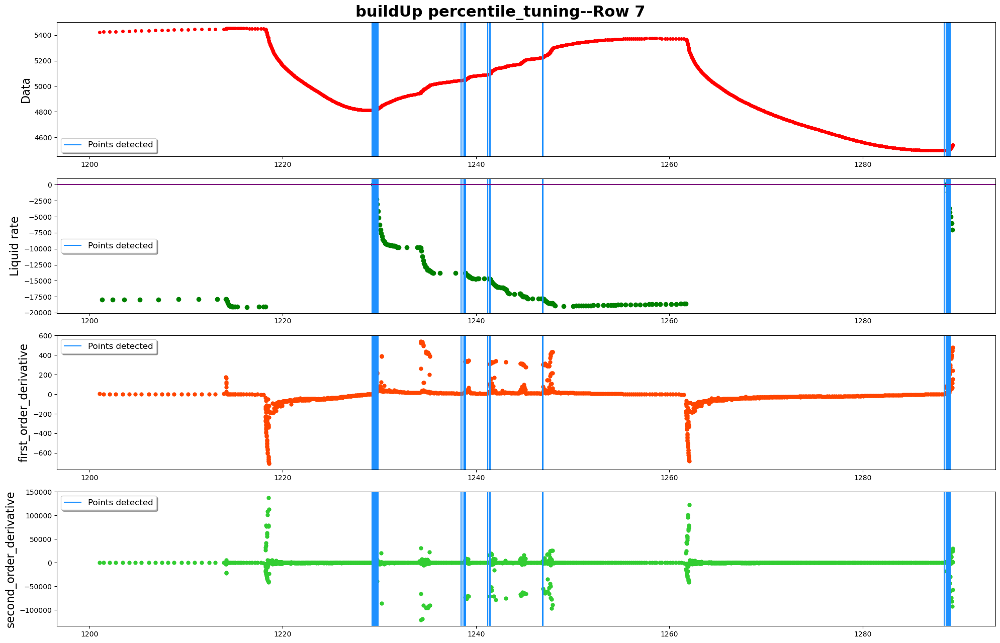

------row 8-----detected points:[8596, 8773, 8774, 8775, 8776, 8866, 8867, 8868, 8869, 8873]


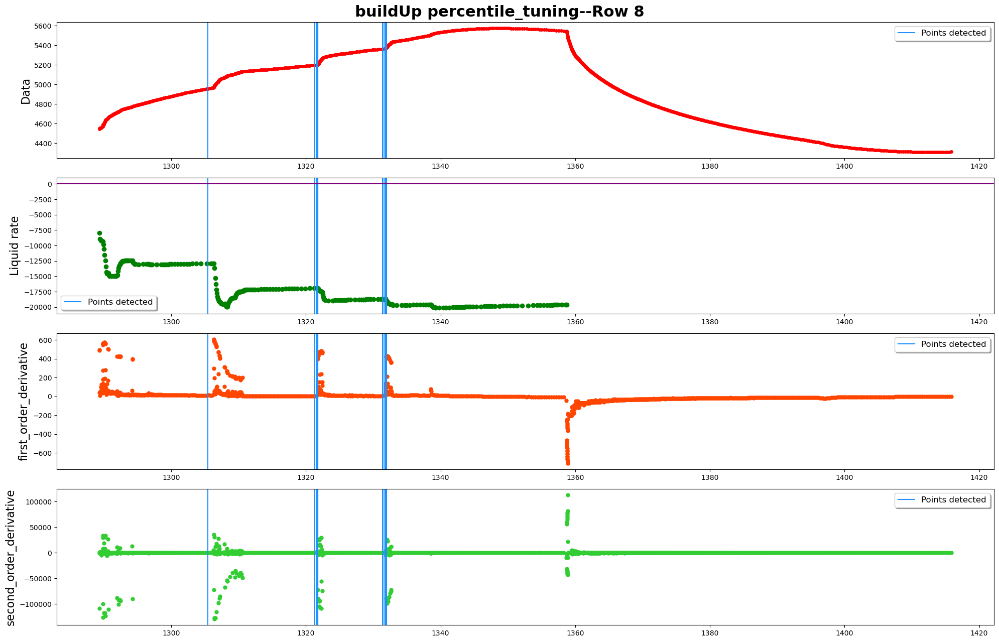

------row 9-----detected points:[9605, 9606, 9607, 9608, 9613, 9614, 9615, 9616, 9617, 9618, 9619, 10064, 10065, 10066, 10217, 10218, 10219, 10220, 10221, 10222, 10223, 10224, 10225, 10226, 10227, 10228, 10229, 10230, 10231, 10232, 10233, 10234, 10235, 10236, 10237, 10238, 10239, 10240, 10241, 10242, 10796, 10797, 10798, 10799]


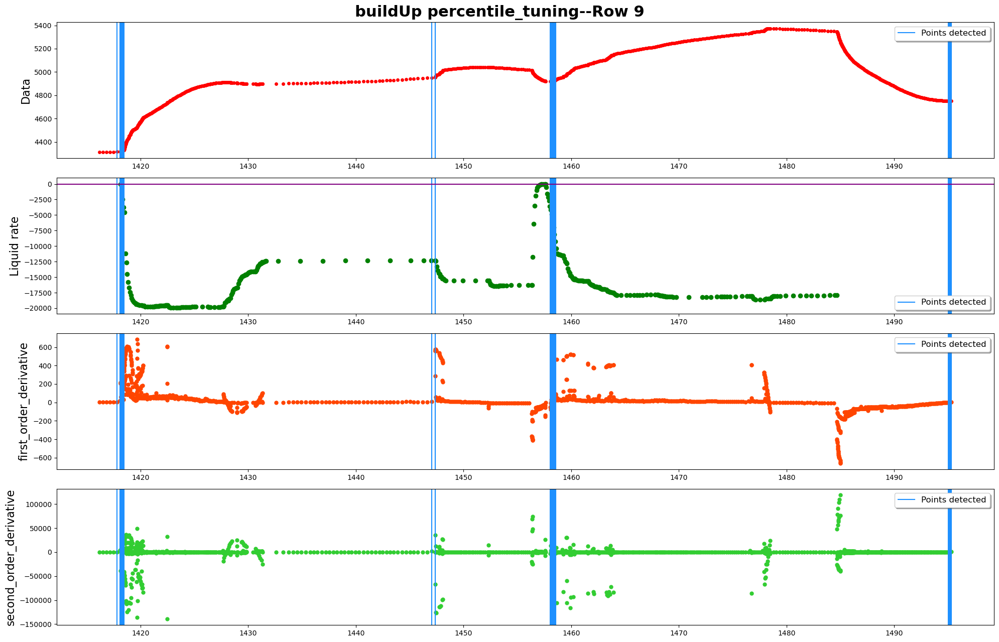

------row 10-----detected points:[10801, 10802, 10803, 10804, 10805, 10806, 10807, 10808, 10809, 10810, 10811, 10812, 10813, 10814, 10815, 10816, 11474, 11475, 11476, 11477, 11478, 11479, 11480, 11481, 11482, 11483, 11484, 11485, 11486, 11487, 11488, 11489, 11490, 11491, 11492, 11493, 11494, 11495, 11496, 11497, 11498, 11499, 11500, 11501, 11502, 11503, 11504, 11505, 11506, 11507, 11508, 11509, 11510, 11511, 11512, 11513, 11514, 11740, 11741, 11742, 11743, 11744, 11745, 11746, 11747, 11748]


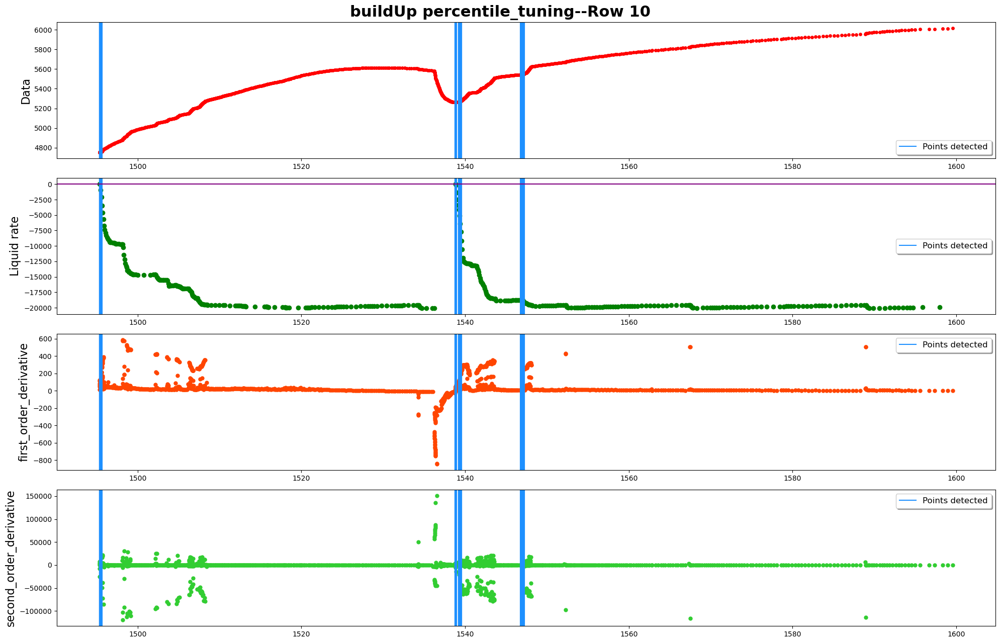

------row 11-----detected points:[12240, 12241, 13035, 13036, 13037, 13038, 13039, 13040, 13041]


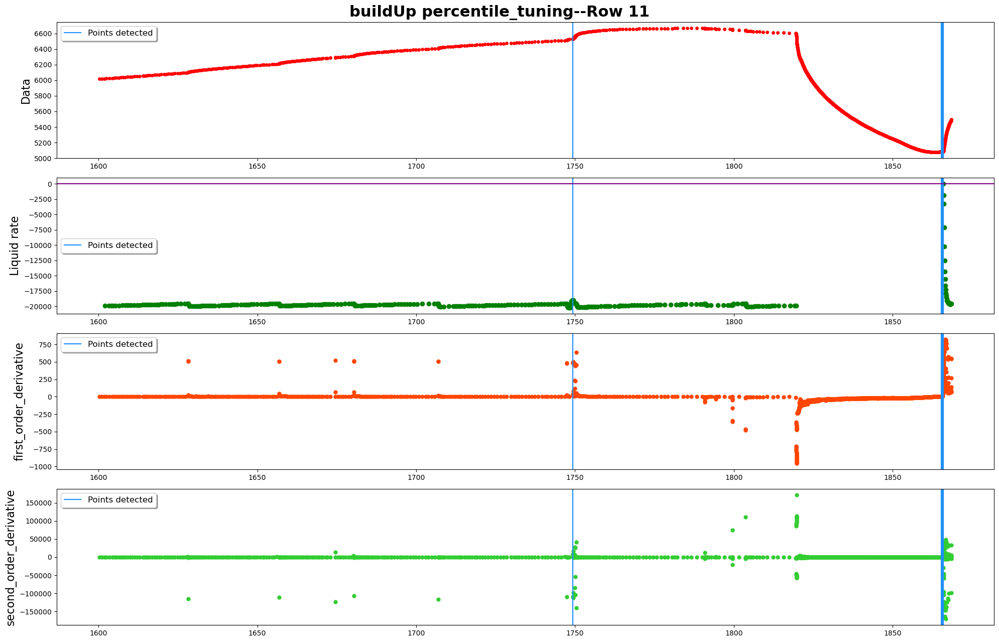

------row 12-----detected points:[13525, 13526, 13527, 13528, 13529, 13774, 13775, 14083, 14084, 14085, 14086, 14087, 14088, 14089, 14090, 14091, 14092, 14093, 14094, 14095, 14096, 14097, 14098, 14099, 14100, 14102]


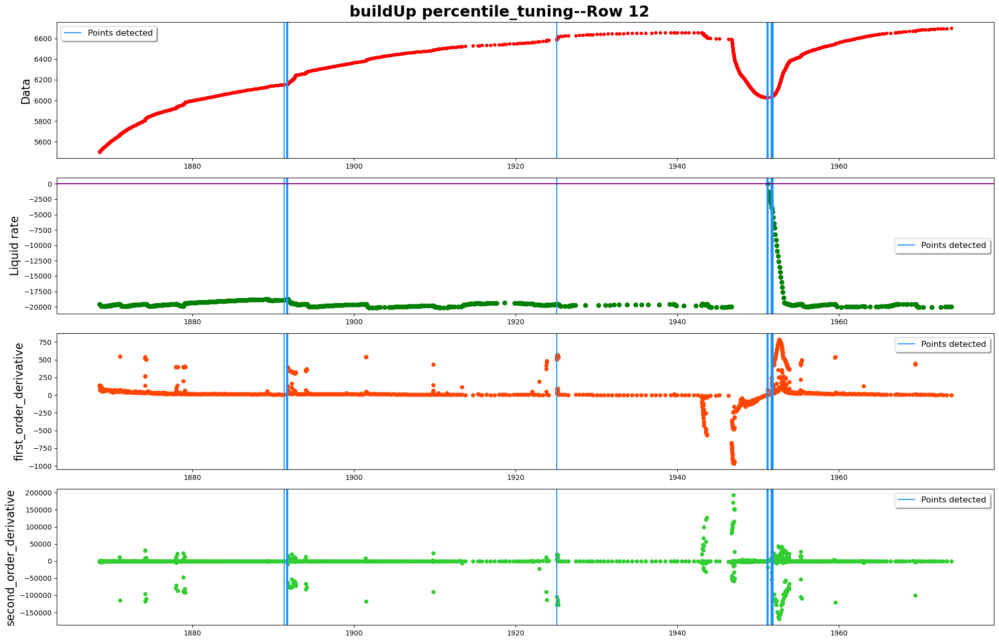

------row 13-----detected points:[14563, 14564, 14565, 14566, 14567, 14568, 14569, 14570, 14571, 14572, 14573, 14574, 14575, 14576, 14577, 14578, 14579, 14580, 14581, 14582, 14583, 14584, 14585, 14586, 14587, 14588, 14589, 14590, 14591, 14592, 14593, 14594, 14595, 14596, 15328, 15329, 15330, 15331, 15332, 15333, 15334, 15335, 15336, 15337, 15338, 15339, 15340, 15341, 15342, 15343, 15344, 15345, 15346, 15347, 15348, 15349, 15350, 15351, 15352, 15353]


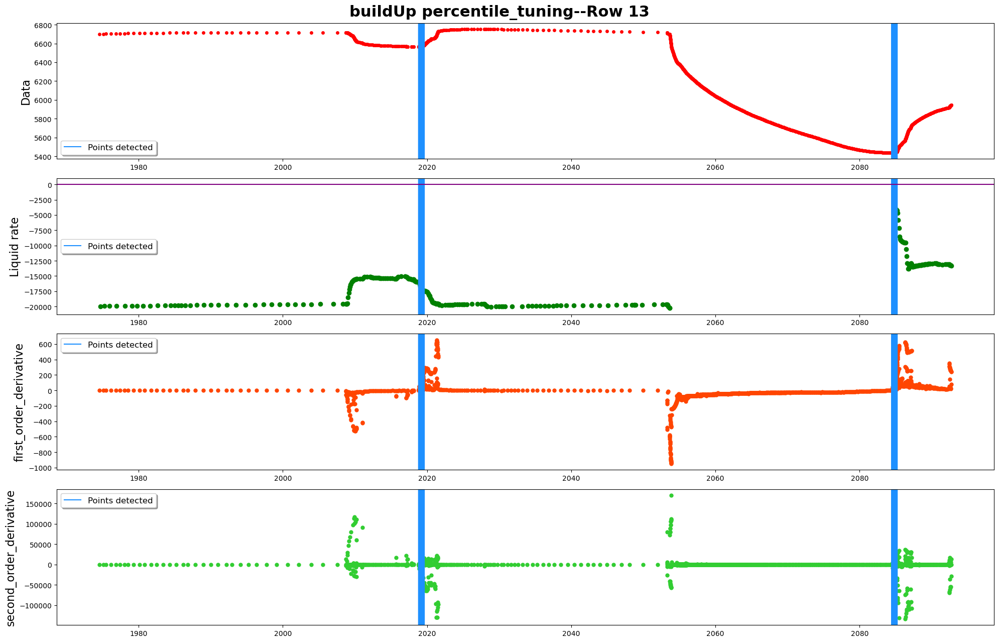

------row 14-----detected points:[15938, 15939, 15940, 16618, 16619, 16620]


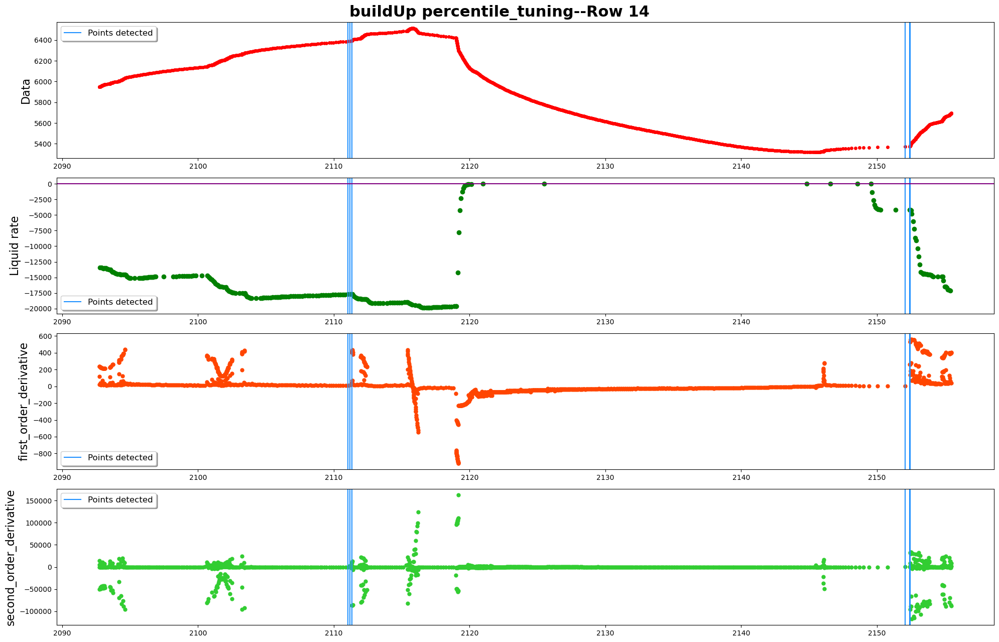

------row 15-----detected points:[17063, 17064, 17065, 17066, 17243, 17244, 17245, 17246, 17461, 17462, 17463, 17464]


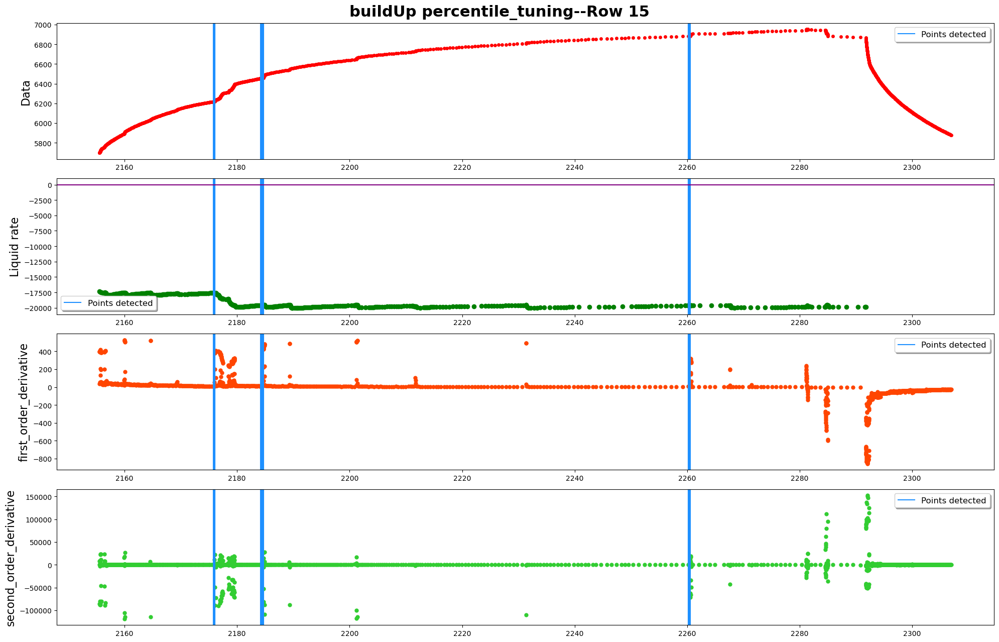

------row 16-----detected points:[18432, 18433, 18434, 18435]


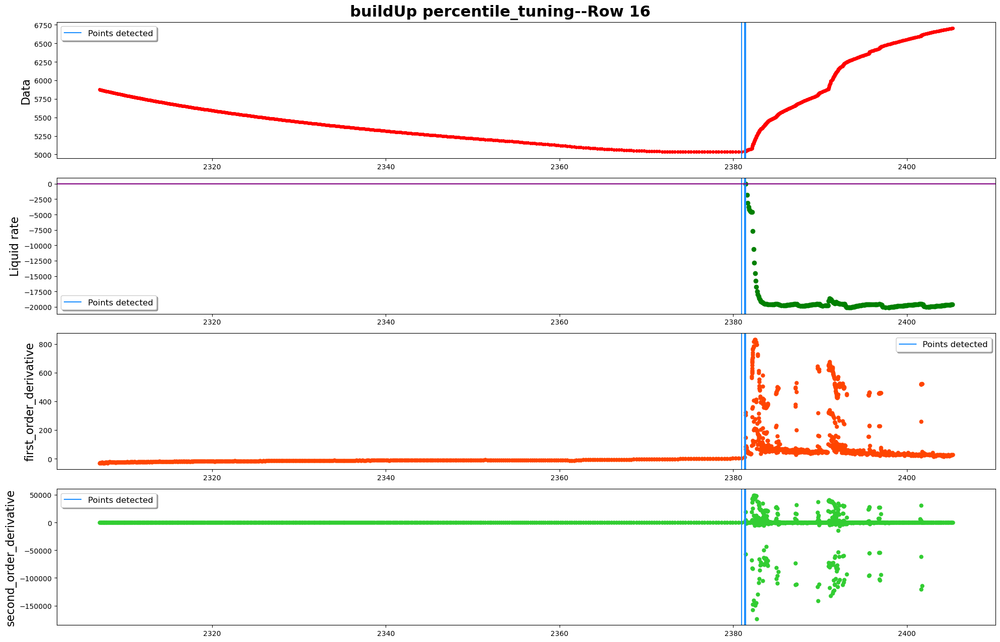

------row 17-----detected points:[19457, 19458, 19459, 19461, 19503, 19504, 19506, 19507, 19509, 19512, 19513, 19514, 19515, 19516, 19517, 19519, 19520, 19521, 19522, 19523, 19524, 19525, 19526, 19527, 19528, 19529, 19531, 19532, 19556, 19557, 19559, 19560, 19777, 19778, 19779, 19780, 19781, 19782, 19783, 19784, 19785, 19786, 19787, 19788, 19789, 19790, 19791, 19792, 19793, 19794, 19795, 20333, 20334]


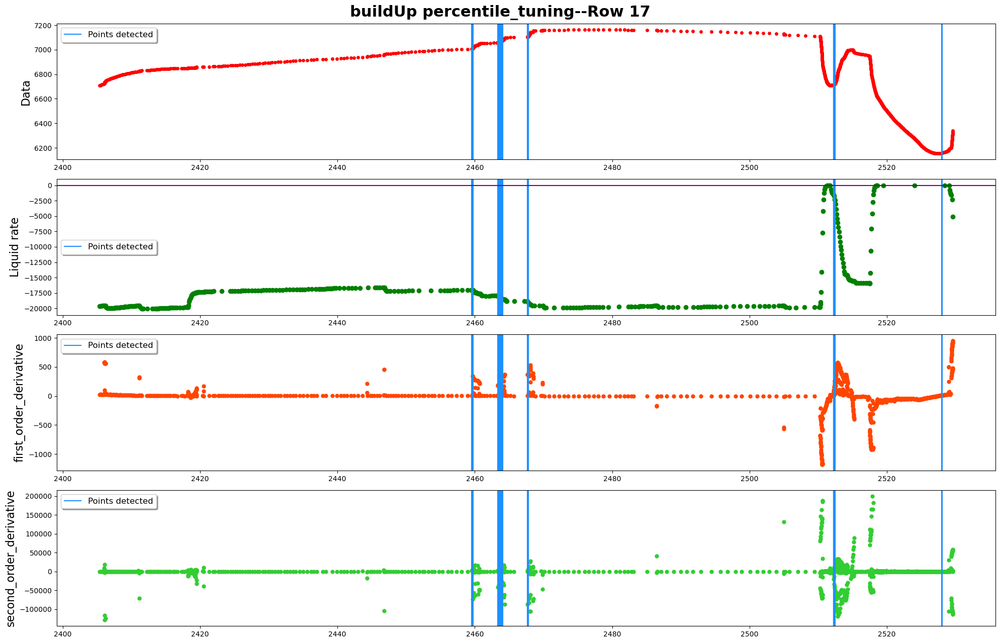

------row 18-----detected points:[]


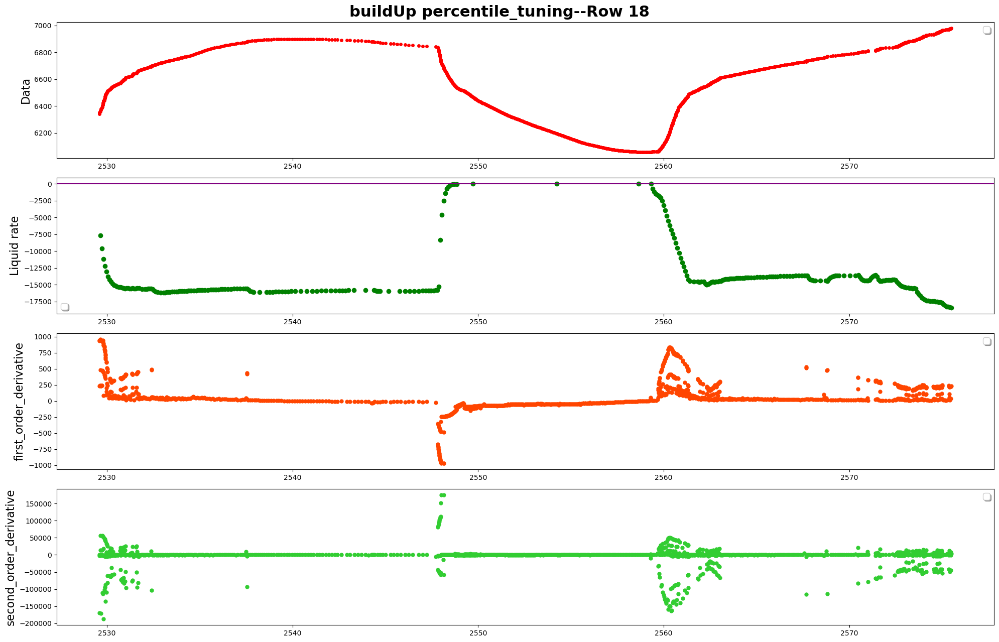

------row 19-----detected points:[21900, 21901, 21902, 22173, 22174, 22175, 22176, 22177, 22178, 22179, 22180, 22181, 22182, 22183, 22184, 22185, 22186, 22187, 22188, 22189, 22190, 22191, 22192, 22193, 22194, 22195, 22196, 22197, 22198, 22199, 22200, 22201, 22202, 22203, 22525, 22526, 22527, 22528, 22529, 22530, 22531, 22532, 22620, 22621, 22622]


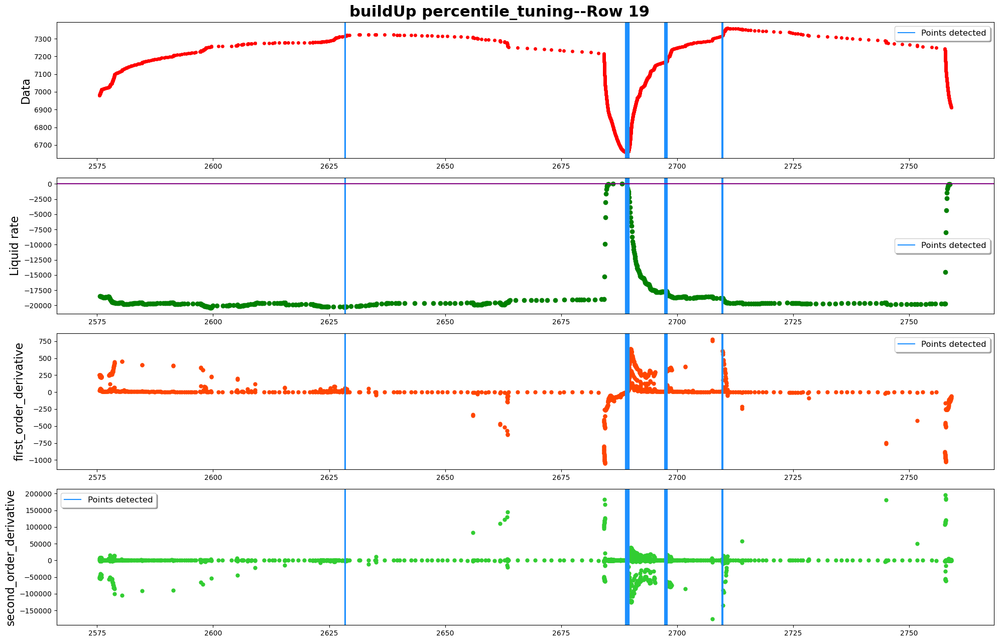

------row 20-----detected points:[23219, 23220, 23221, 23222, 23223, 23224, 23225, 23226, 23227, 23228, 23229, 23230, 23231, 23232, 23233, 23234, 23235, 23236, 23237, 23638, 23639, 23640, 23641, 23771, 23772, 23773, 23775, 23922, 23923, 23924, 23927]


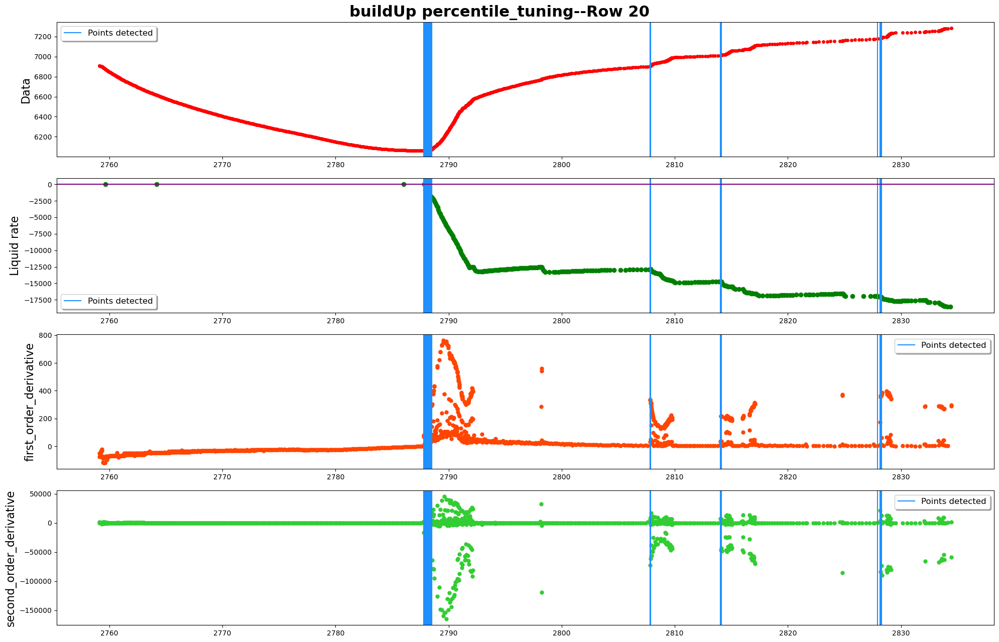

------row 21-----detected points:[24068, 24069, 24070, 24092, 24672, 24673, 24674, 24675, 24676, 24677, 24678, 24682, 24683, 24684, 24685, 24686, 24687, 24688, 25057, 25058, 25059, 25060, 25061, 25062, 25063, 25064, 25065, 25066, 25067, 25068, 25069, 25070, 25071, 25072, 25073, 25074, 25076, 25196, 25197, 25198]


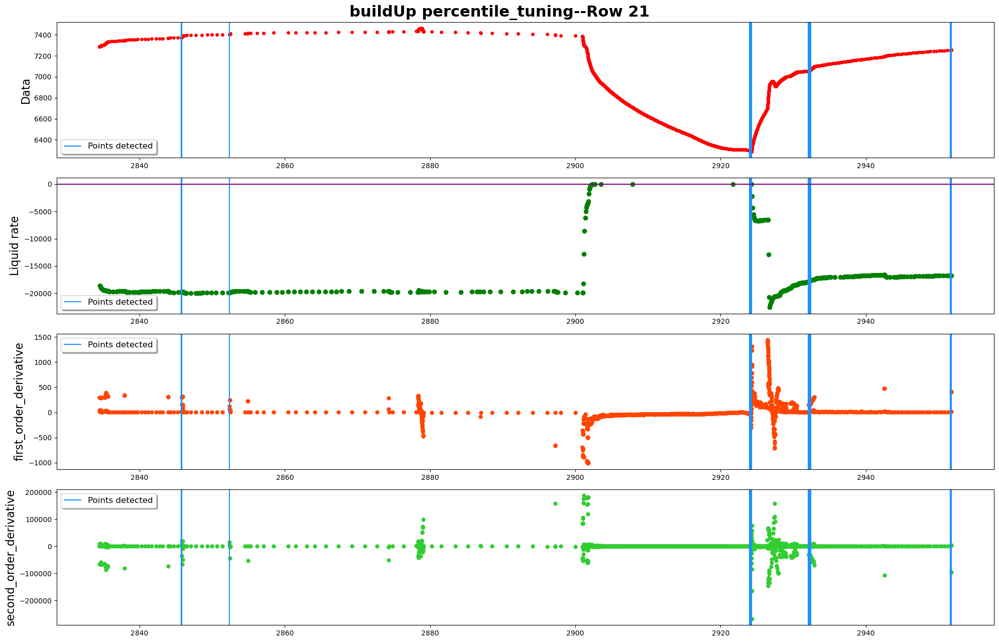

------row 22-----detected points:[25279, 25280, 25281, 25282, 25283, 25287, 25332, 25333, 25345, 25346, 25348, 25990, 25991]


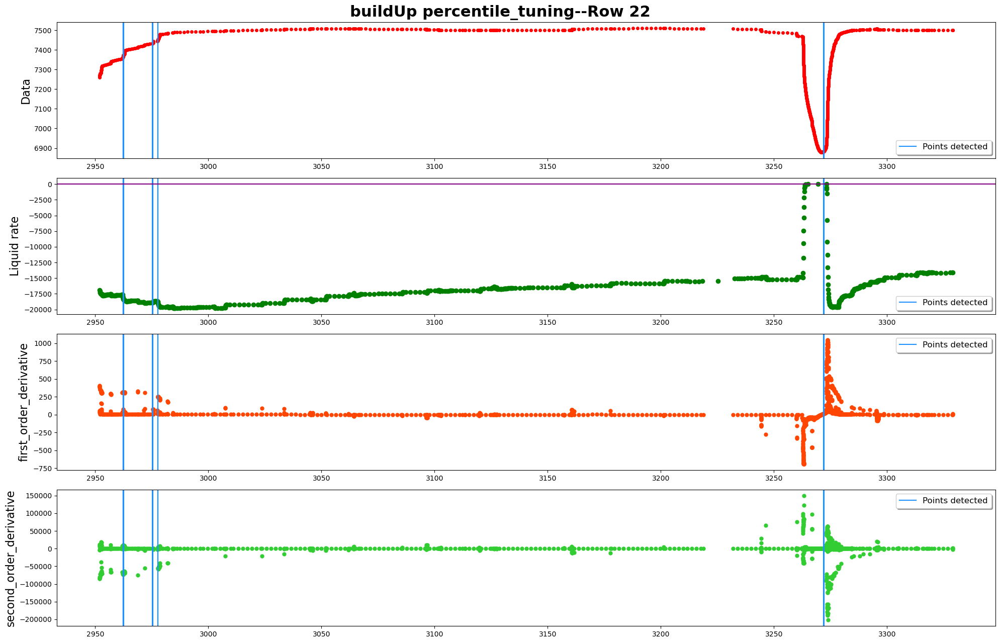

------row 23-----detected points:[26431, 26432, 26433, 26434, 26435, 26436, 26437, 26438, 26439, 26440, 26441, 26442, 26443, 26444, 26445, 26446, 26447, 26448, 26449, 26450, 26451, 26452, 26453, 26454, 26455, 26456, 26457, 26458, 26459, 26460, 26461, 26462, 26463, 26464, 26465, 26466, 26467, 26468, 26469, 26470, 26471, 26472, 26473, 26503, 26504, 26920, 26921, 27313, 27314, 27315, 27316, 27317, 27318, 27319, 27320, 27321, 27322, 27323, 27324, 27325, 27326, 27327, 27328, 27329, 27330, 27331]


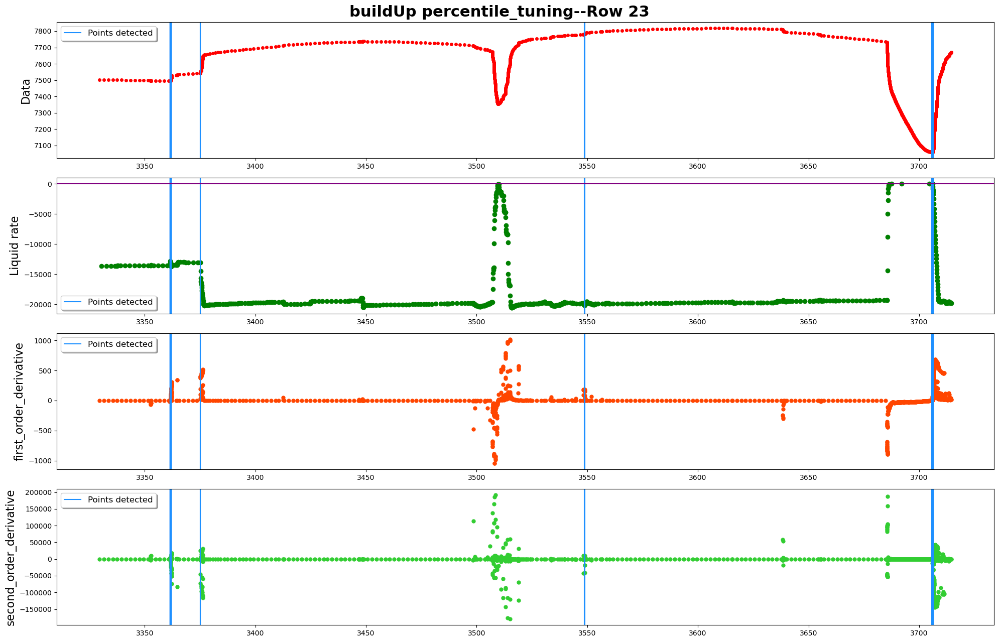

------row 24-----detected points:[27958, 27959, 27960, 27961, 27962, 27963, 27964, 27965, 27966, 27967, 27968, 27969, 27970, 27971, 27972, 27973, 27974, 27975, 27976, 27977, 28484, 28485, 28486, 28487, 28488, 28489, 28490, 28491, 28492, 28493, 28494, 28495, 28496, 28497, 28498, 28499, 28500, 28501, 28502, 28503, 28504, 28505, 28506, 28507, 28753]


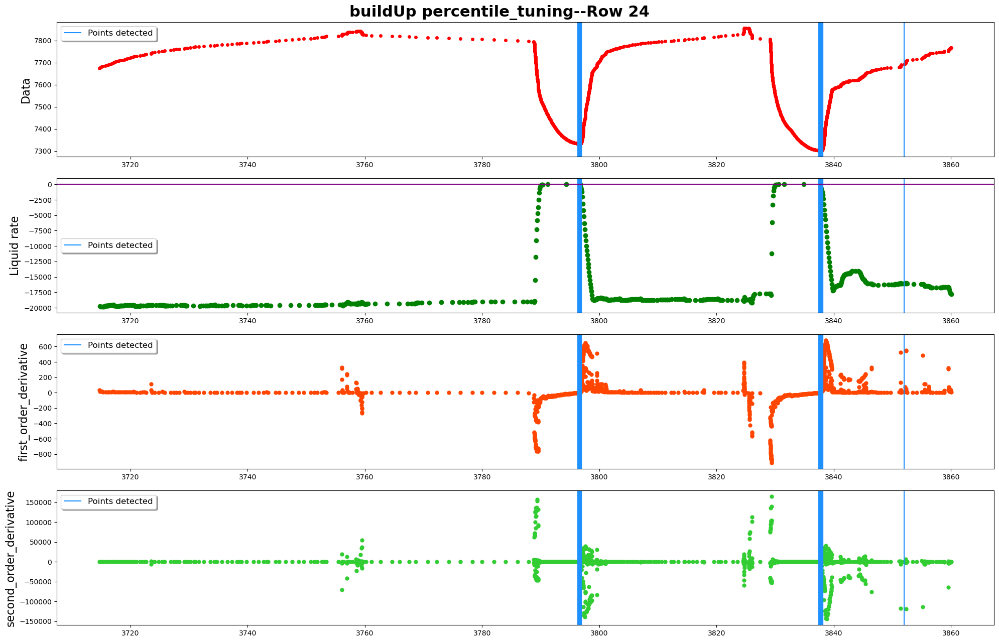

------row 25-----detected points:[29107, 29108, 29109, 29110, 29111, 29112, 29113, 29114, 29115, 29116, 29117, 29118, 29299, 29300, 29301, 29302, 29355, 29356, 29357, 29474, 29475, 29476, 29477, 29478, 29715, 29716, 29717]


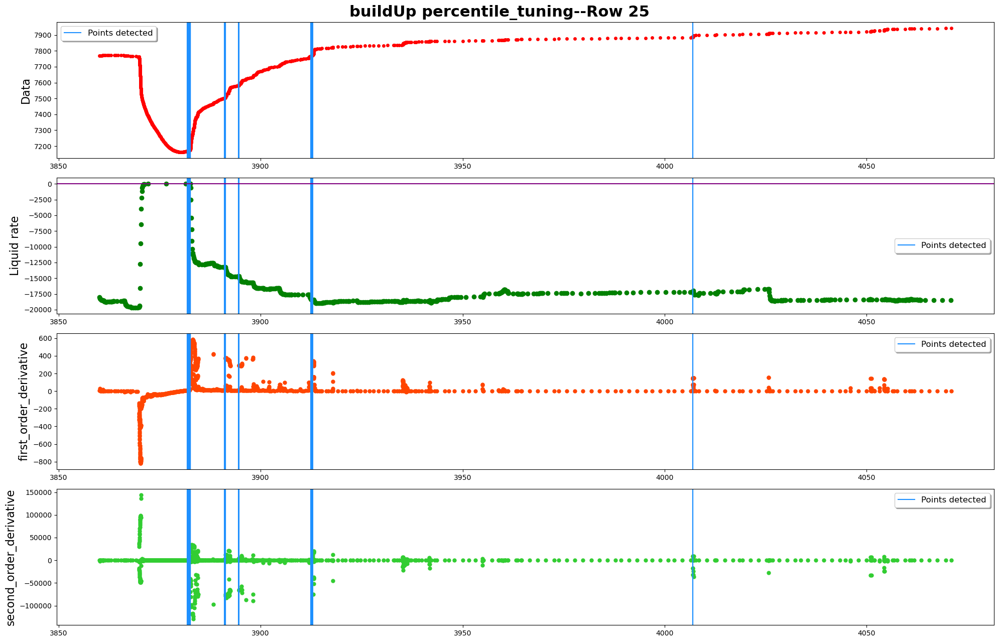

In [6]:
pressure_df=processed_data_denoised.pressure_df
rate_df=processed_data_denoised.rate_df
data_inOneRow=1200
colum_names=colum_names_denoised
filename_toSave="../data_output/RealField_Denoised_linearTangent_N_Pattern_recognition_100_10_100_10.pdf"
plot_name="buildUp percentile_tuning"
plot_whole=True
plot_details=True
plot_statistics=False
PlotNSave(pressure_df,
          rate_df,
          buildup2,
          [],
          data_inOneRow,
          plot_name,
          filename_toSave,
          plot_statistics,
          plot_whole,
          plot_details,
          colum_names)

---initializing...
---plotting...


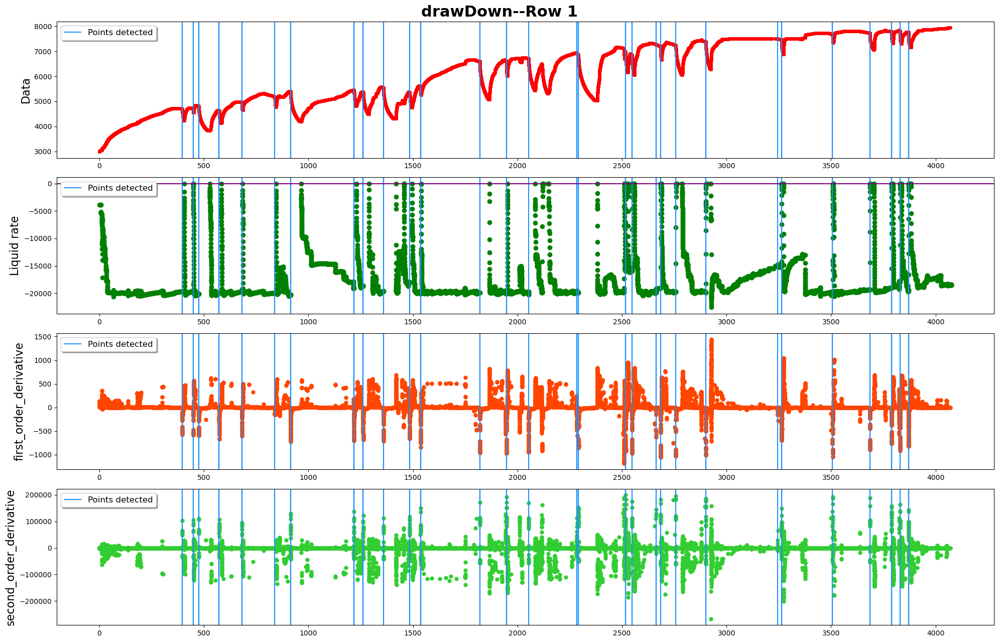

detected 99 points as breakpoints
The plot is devided into 25 rows
------row 1-----detected points:[]


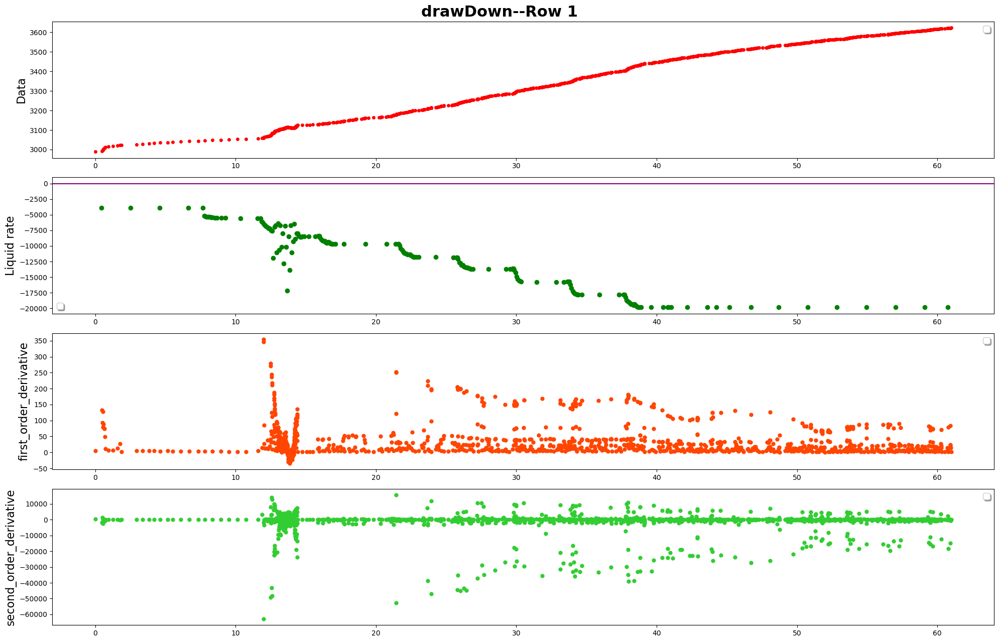

------row 2-----detected points:[2248, 2249, 2250]


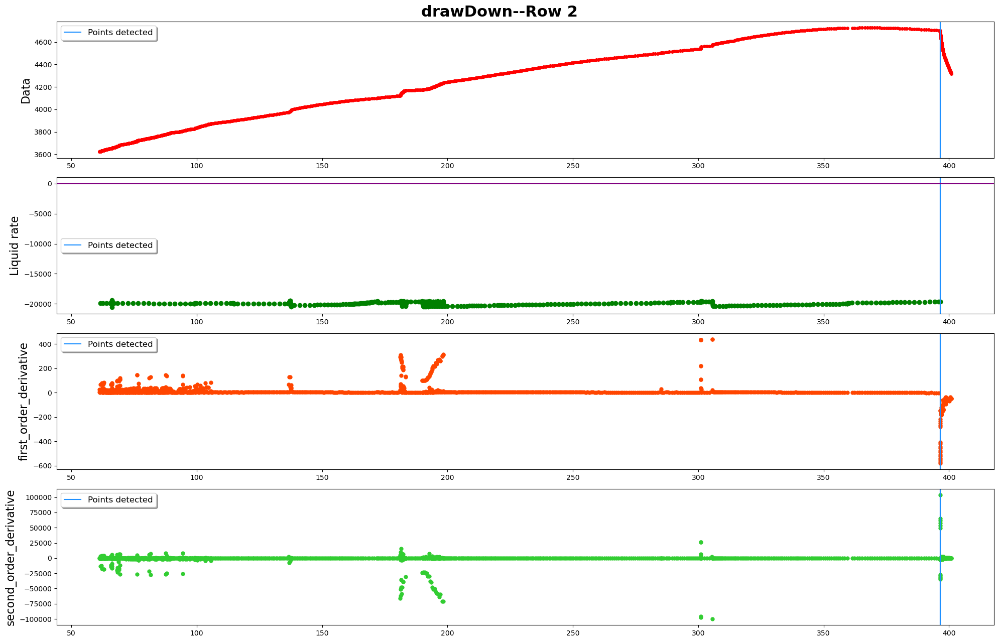

------row 3-----detected points:[2804, 2805, 2806, 3095, 3096, 3097]


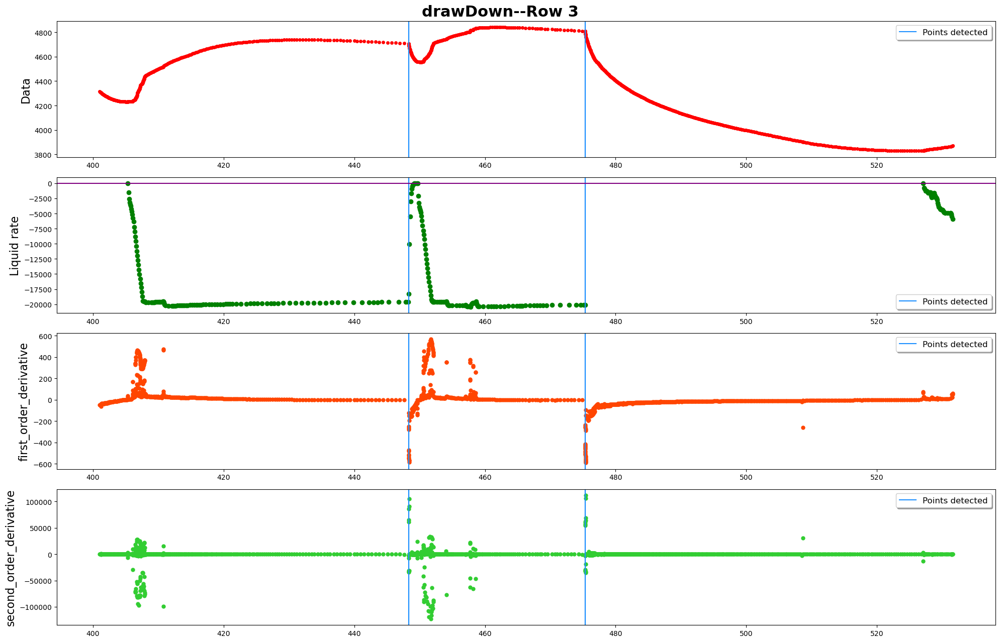

------row 4-----detected points:[3987, 3988, 3989, 3990, 3991, 3992, 4750, 4751, 4752, 4753]


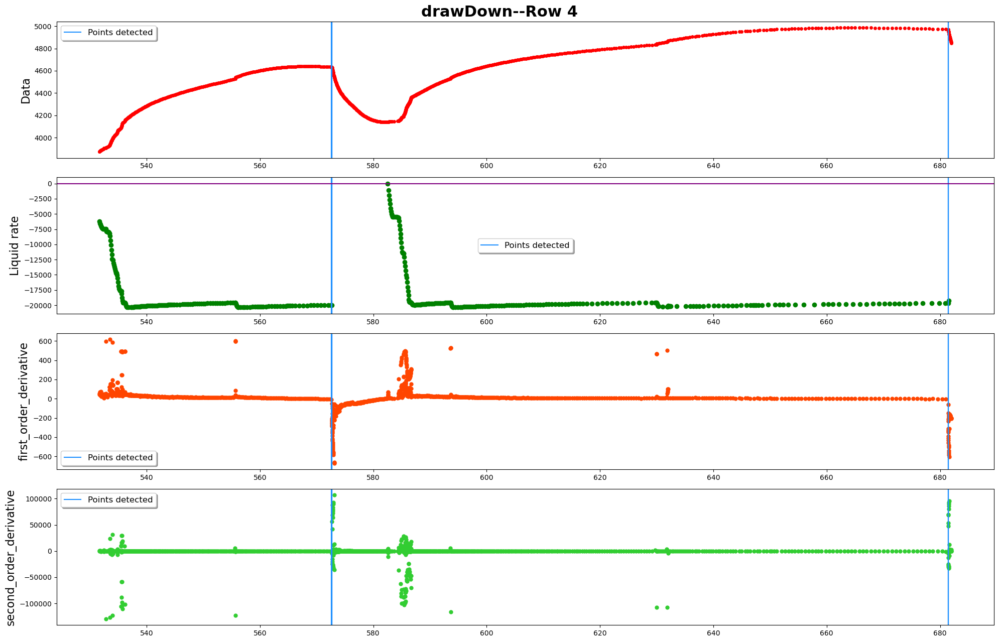

------row 5-----detected points:[5297, 5298, 5983, 5984, 5985, 5986]


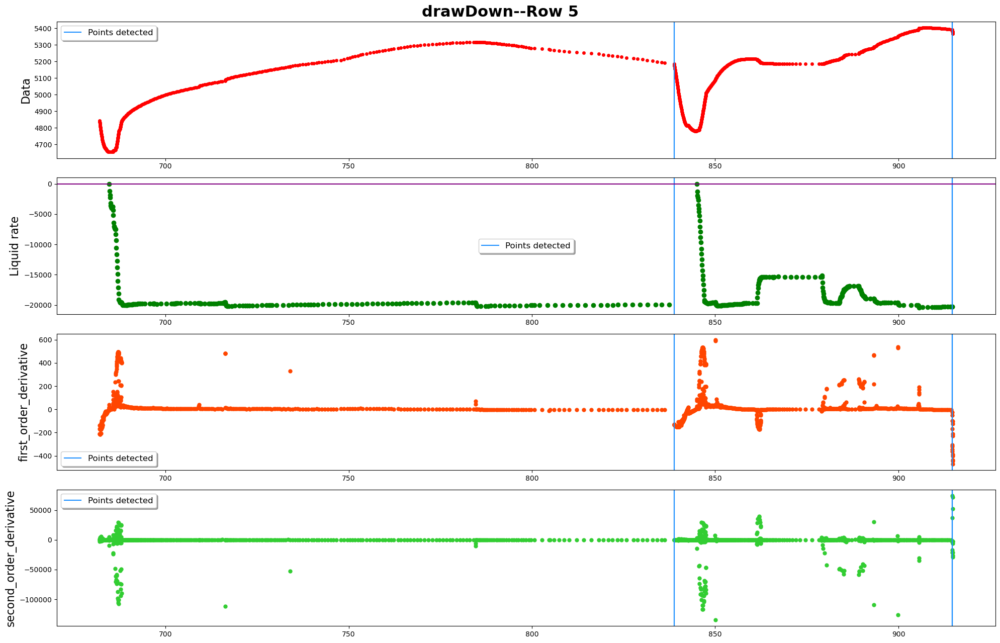

------row 6-----detected points:[]


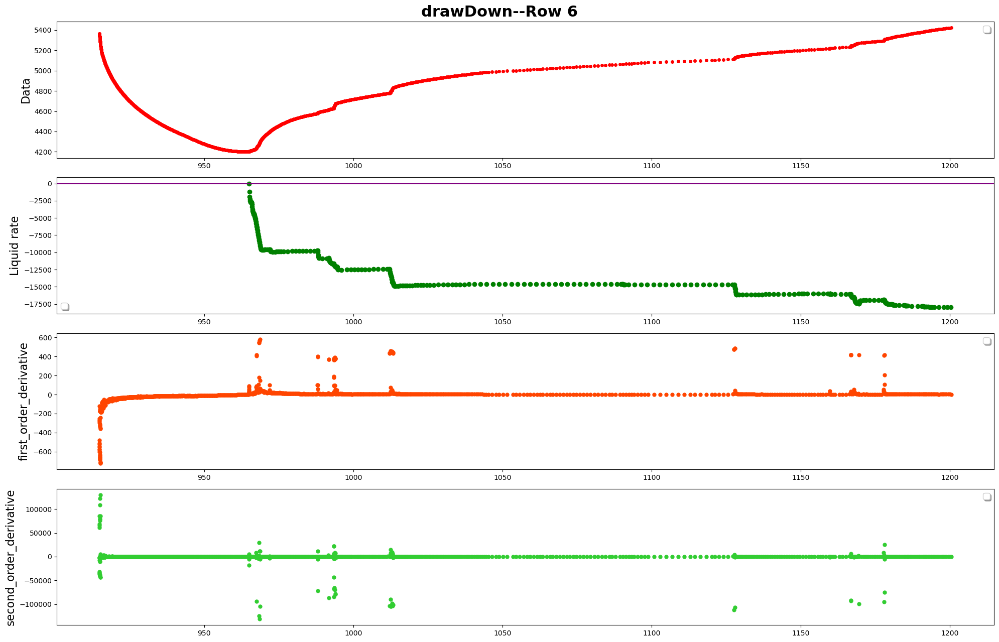

------row 7-----detected points:[7247, 7248, 7249, 7250, 7251, 7252, 7945, 7946, 7947, 7948, 7949, 7950]


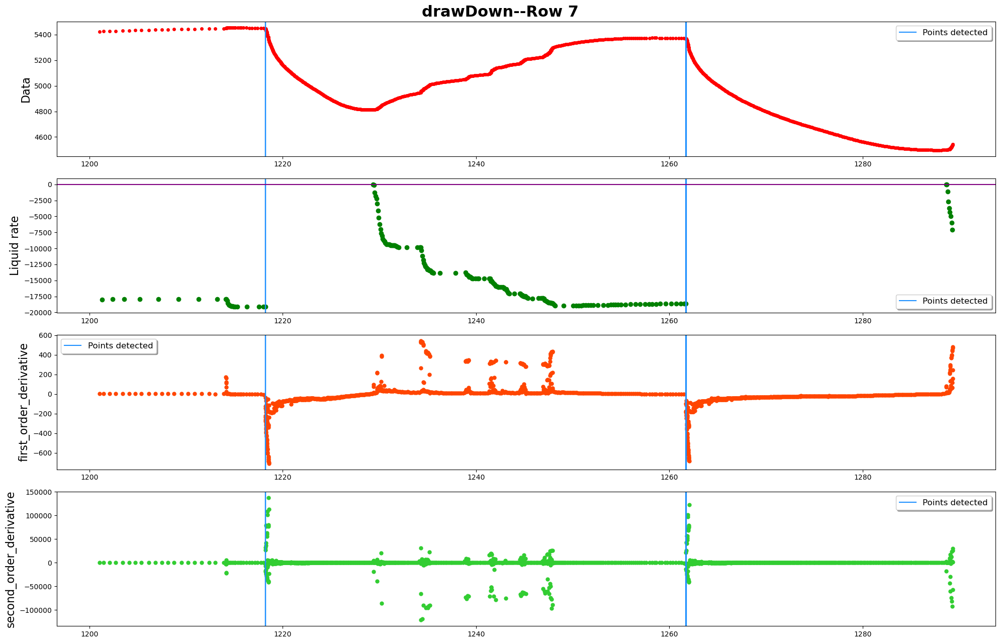

------row 8-----detected points:[9023, 9024, 9025]


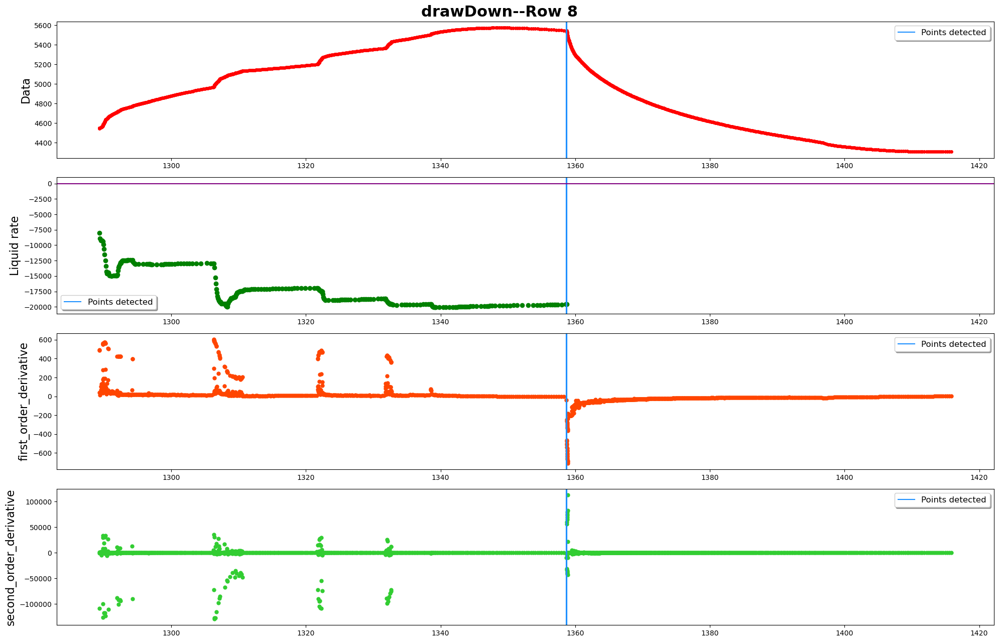

------row 9-----detected points:[10526, 10527, 10528]


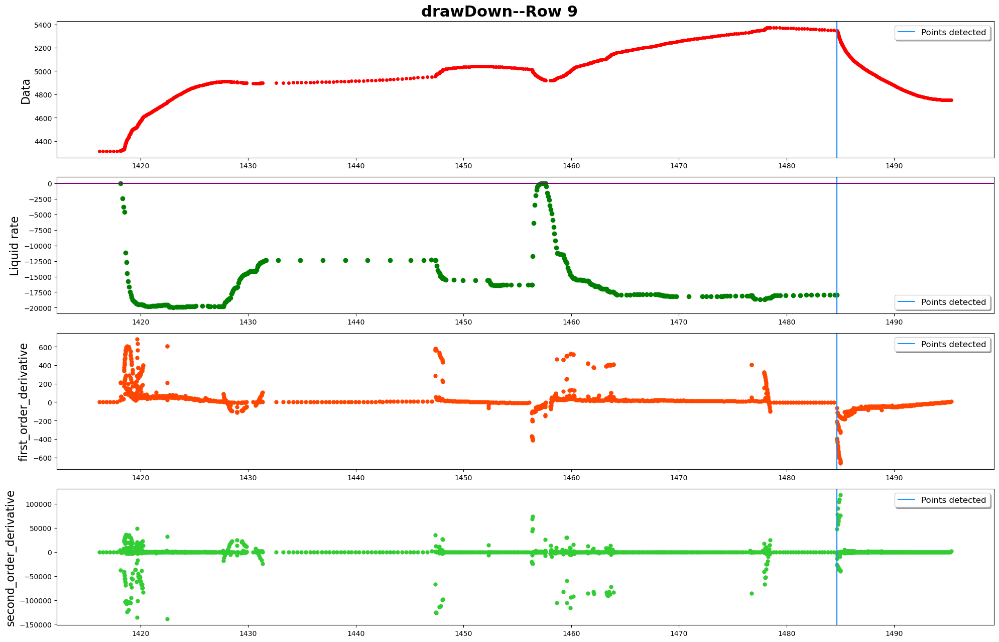

------row 10-----detected points:[11339, 11340, 11341, 11342, 11343]


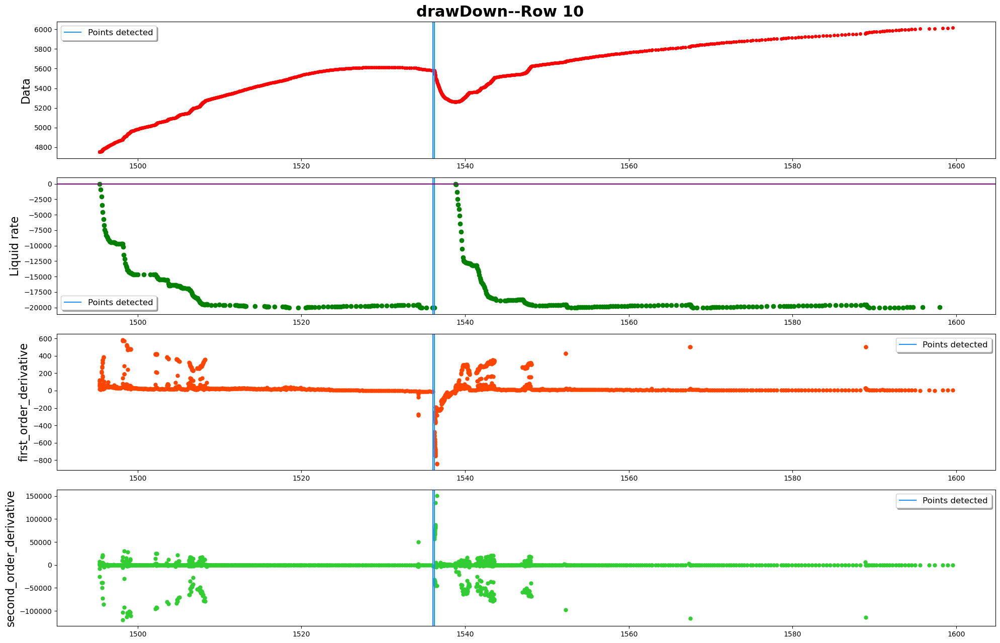

------row 11-----detected points:[12361, 12362, 12363]


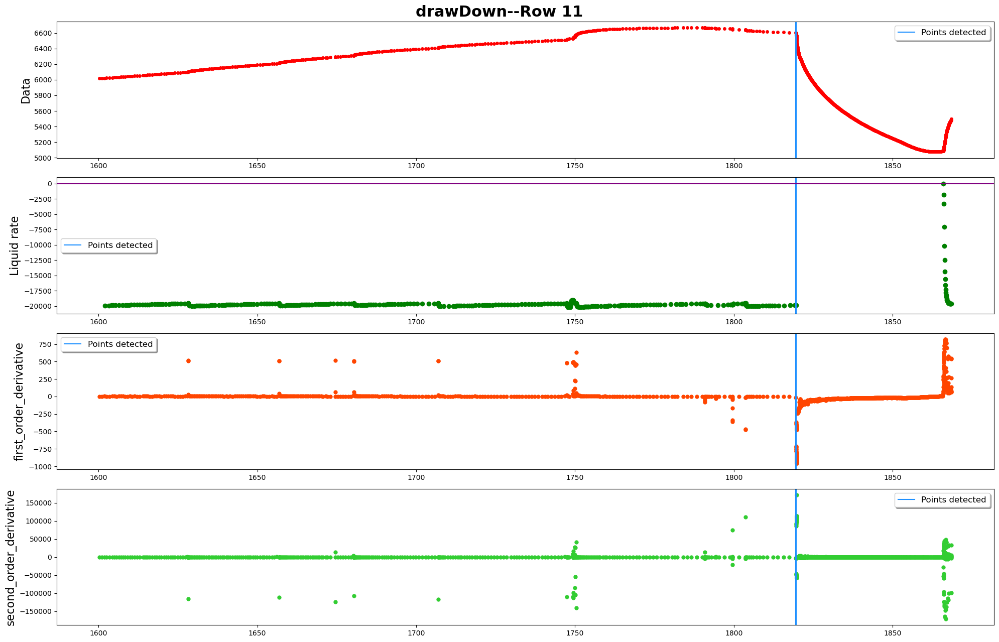

------row 12-----detected points:[13867, 13868, 13869]


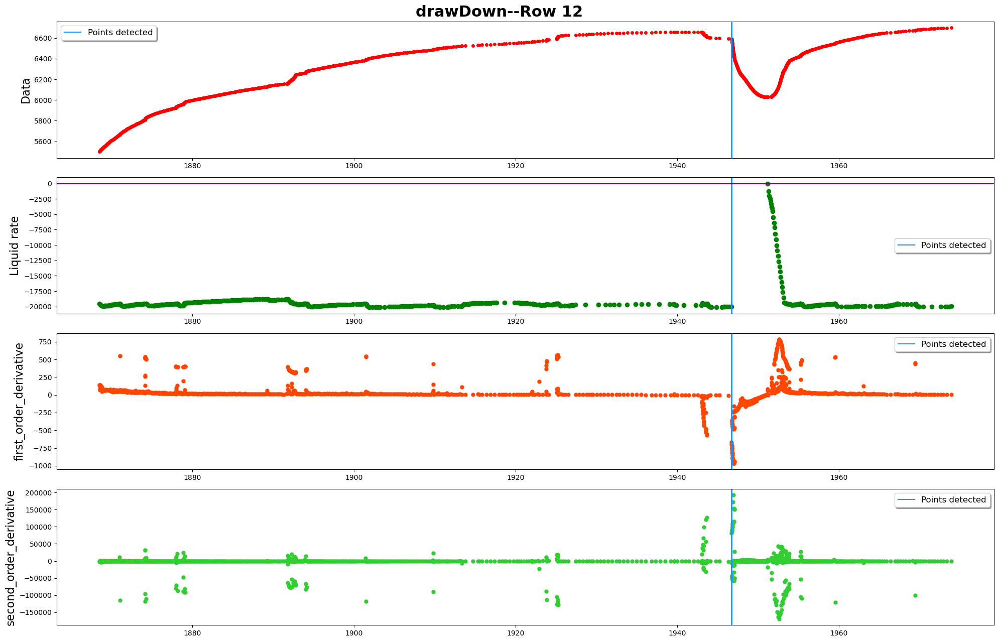

------row 13-----detected points:[14766]


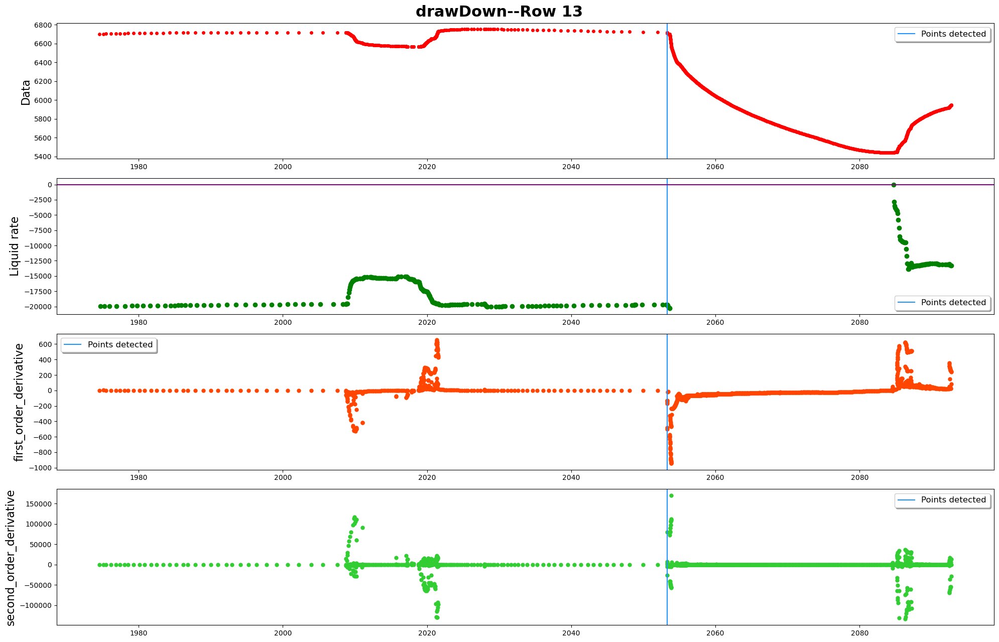

------row 14-----detected points:[]


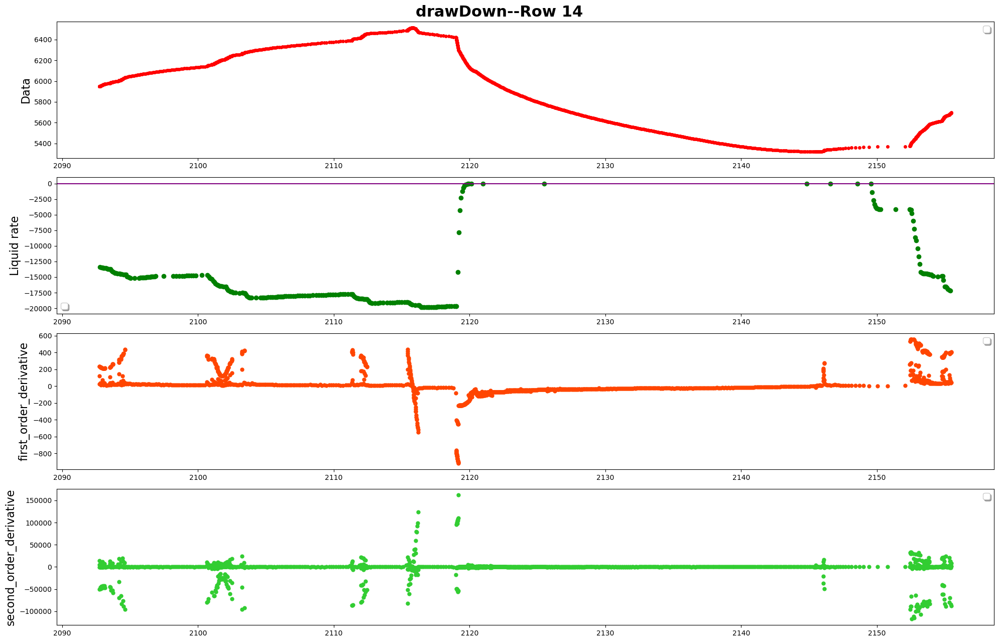

------row 15-----detected points:[17551, 17552, 17553, 17589, 17590, 17591]


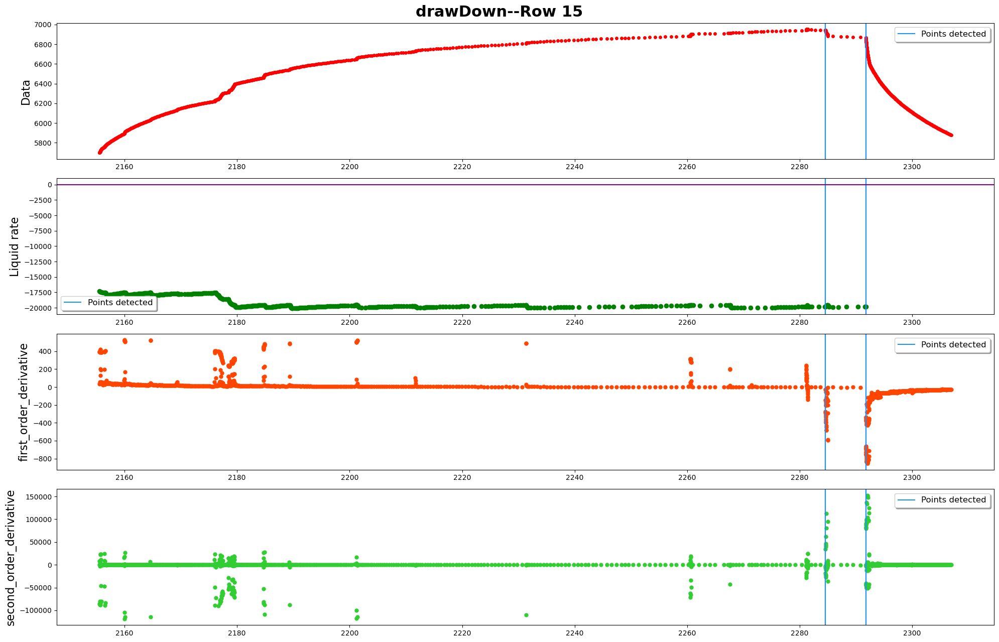

------row 16-----detected points:[]


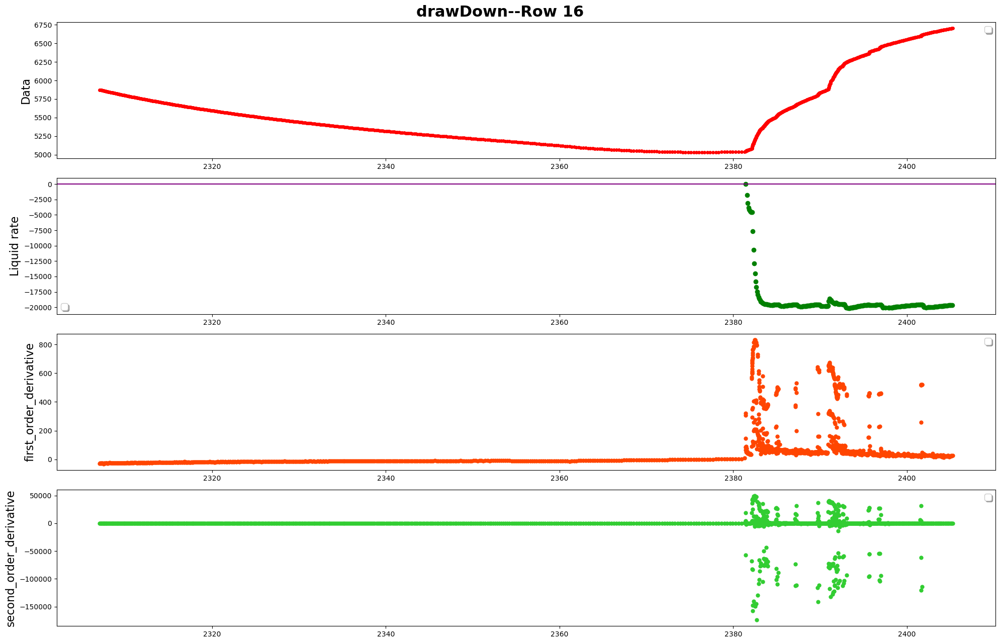

------row 17-----detected points:[20012, 20013, 20014]


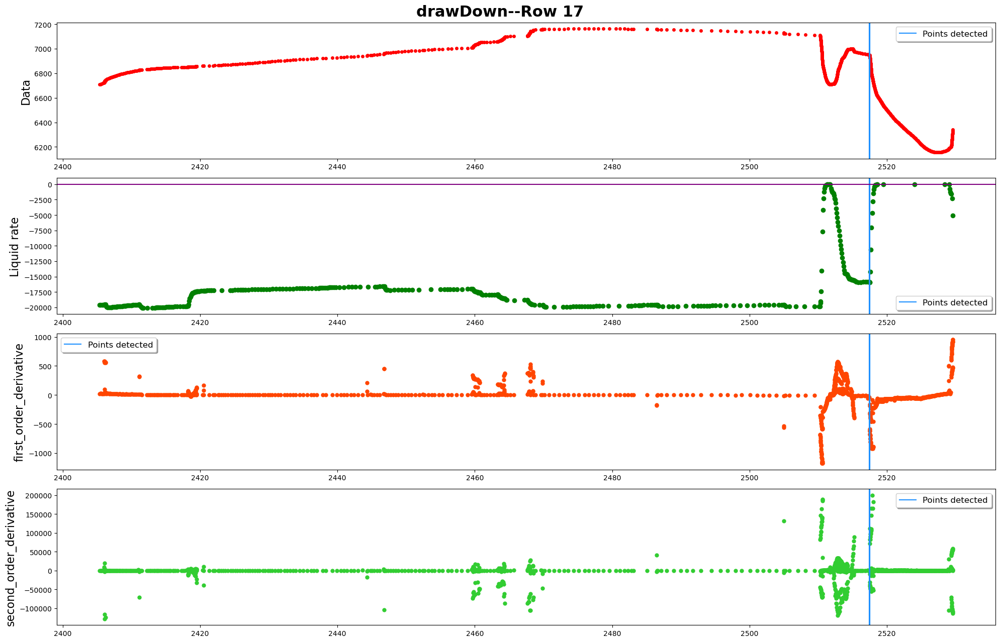

------row 18-----detected points:[20699, 20700, 20701]


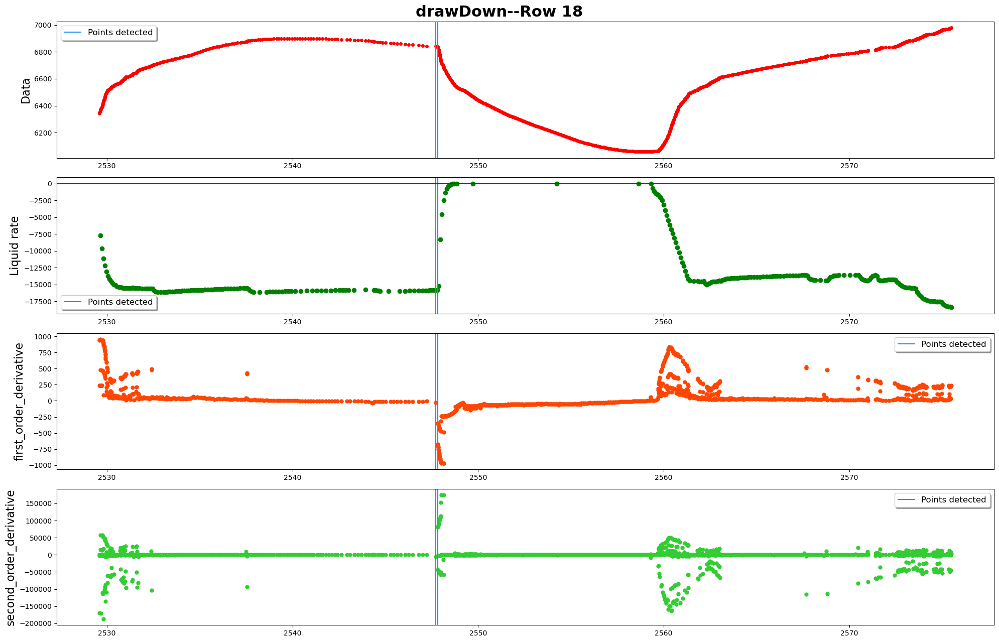

------row 19-----detected points:[21952, 21953, 21954, 21974, 21975, 22709, 22710]


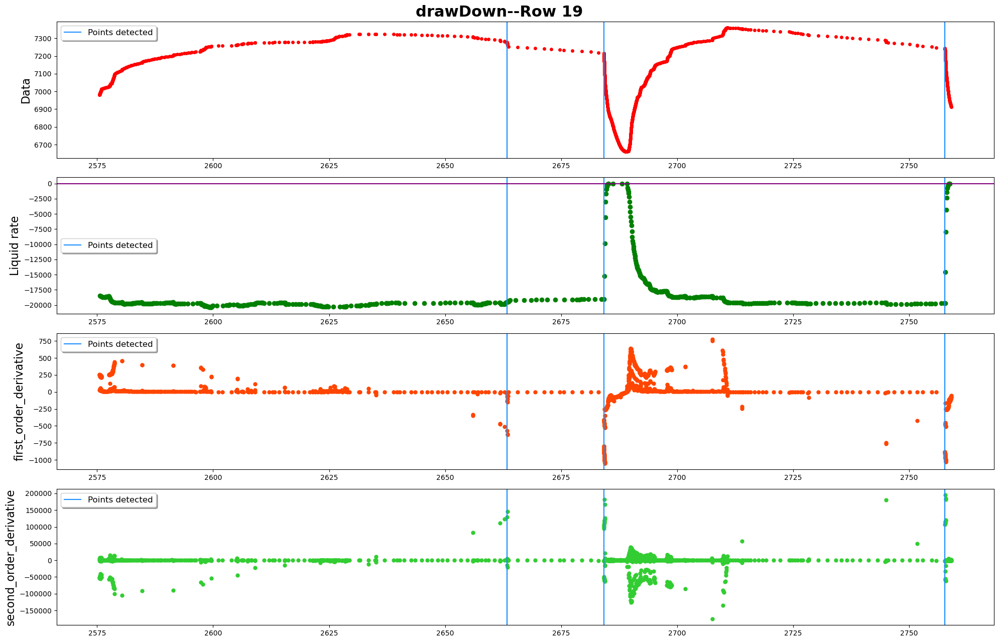

------row 20-----detected points:[]


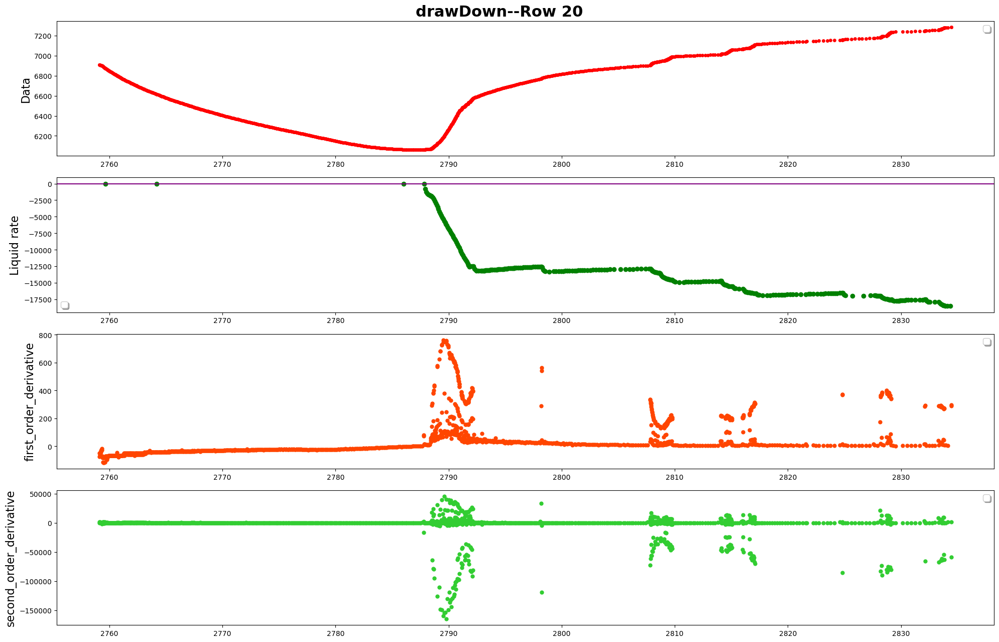

------row 21-----detected points:[24215, 24216, 24217]


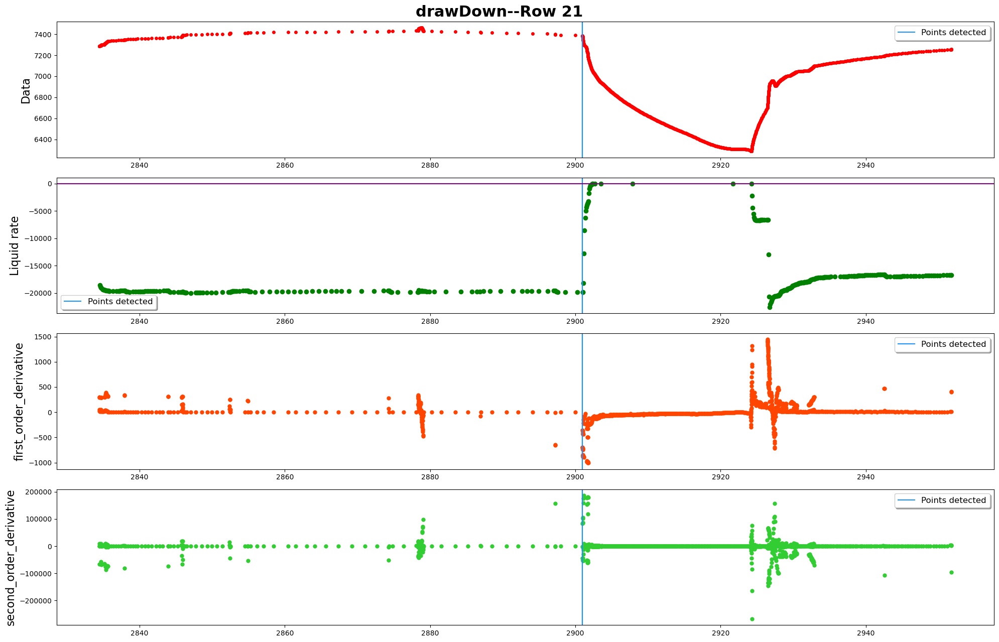

------row 22-----detected points:[25681, 25711, 25712, 25713, 25714]


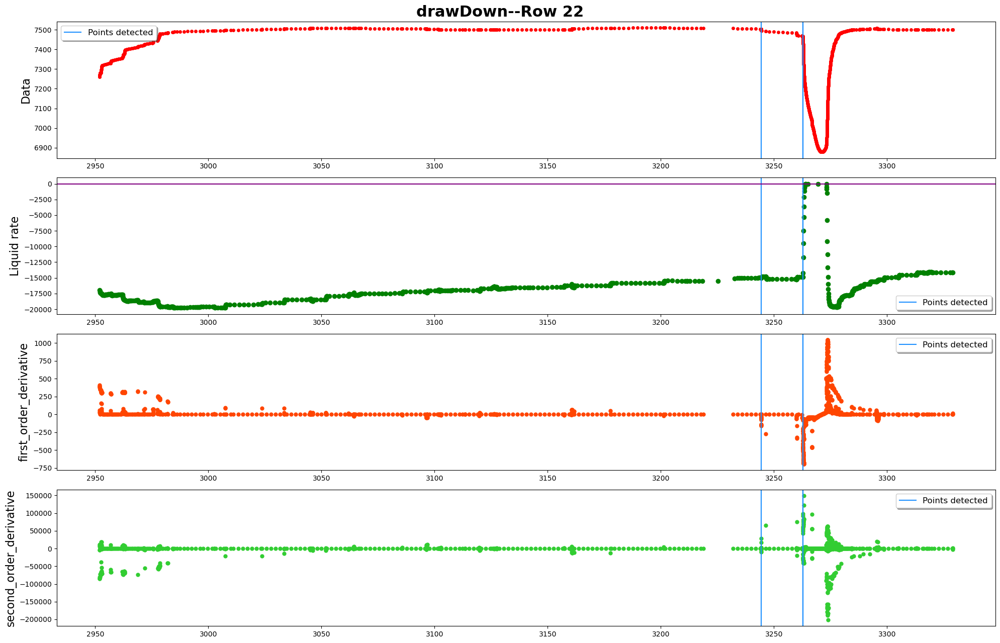

------row 23-----detected points:[26655, 26656, 26657, 27022, 27023, 27024]


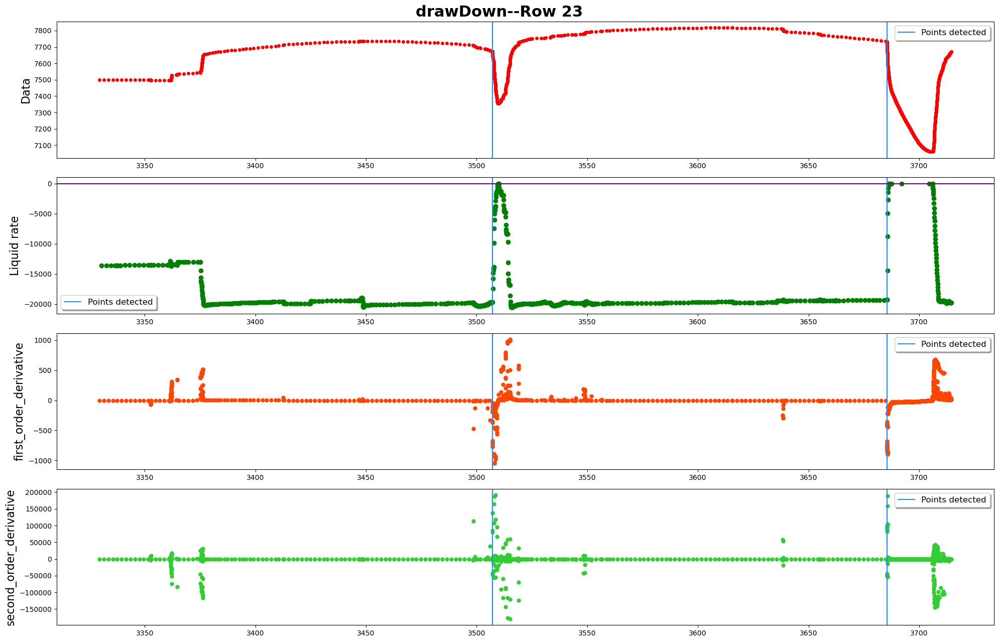

------row 24-----detected points:[27757, 27758, 27759, 27760, 28290, 28291, 28292]


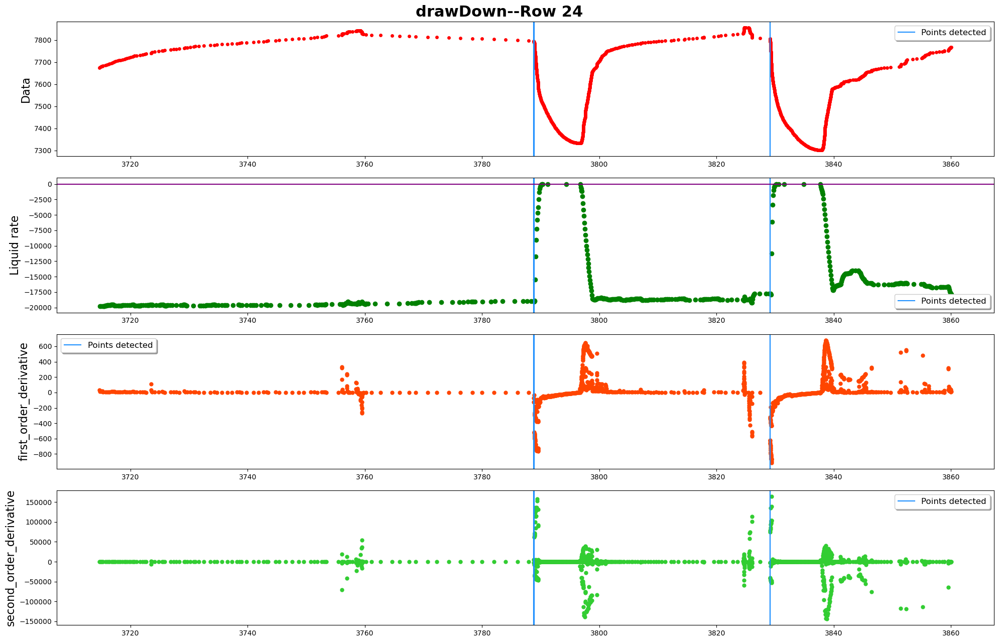

------row 25-----detected points:[28831, 28832, 28833, 28834]


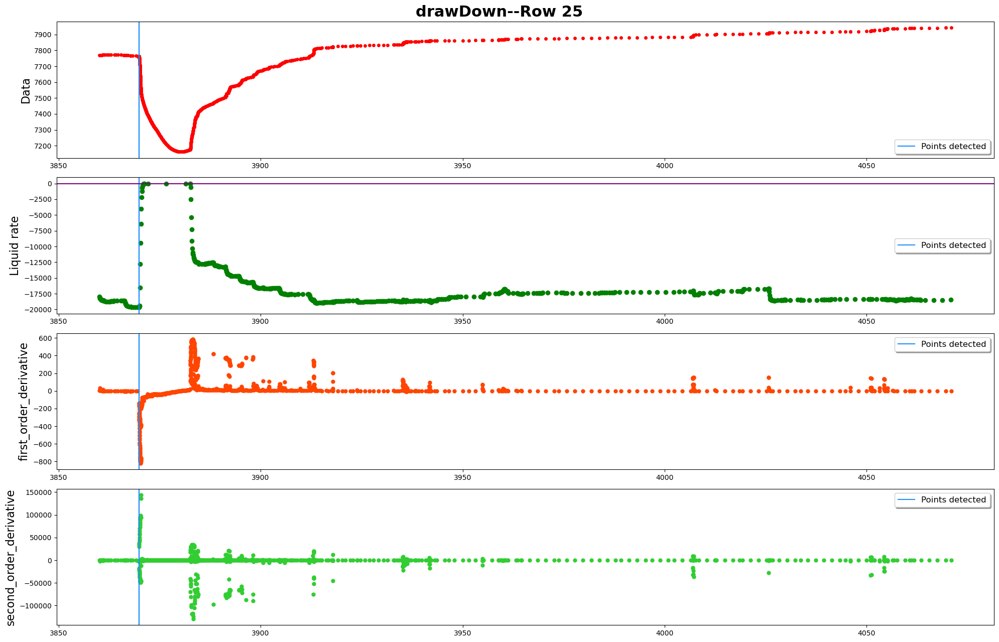

In [7]:
pressure_df=processed_data_denoised.pressure_df
rate_df=processed_data_denoised.rate_df
data_inOneRow=1200
colum_names=colum_names_denoised
filename_toSave="../data_output/RealField_Denoised_linearTangent_N_Pattern_recognition_95_6_95_3.pdf"
plot_name="drawDown"
plot_whole=True
plot_details=True
plot_statistics=False
PlotNSave(pressure_df,
          rate_df,
          drawdown2,
          [],
          data_inOneRow,
          plot_name,
          filename_toSave,
          plot_statistics,
          plot_whole,
          plot_details,
          colum_names)

In [3]:
# pd.set_option('display.max_rows', pressure_df.shape[0]+1)
# pressure_df.iloc[2500:3000]

In [19]:
nan = float('NaN')
nan + 15 ** 4

nan